In [21]:

import sys
sys.path.append("/Users/david/Documents/mastersCode/ubm")
print(sys.path)

['/Applications/PyCharm.app/Contents/plugins/python/helpers-pro/jupyter_debug', '/Applications/PyCharm.app/Contents/plugins/python/helpers/pydev', '/Users/david/Documents/mastersCode/ubm/final/models/hdphmm/bhmm/testing', '/Users/david/.conda/envs/ubm/lib/python310.zip', '/Users/david/.conda/envs/ubm/lib/python3.10', '/Users/david/.conda/envs/ubm/lib/python3.10/lib-dynload', '', '/Users/david/.conda/envs/ubm/lib/python3.10/site-packages', '/Users/david/Documents/mastersCode/ubm', '/Users/david/Documents/mastersCode/ubm']


In [22]:
import pickle
import utils
import matplotlib.pyplot as plt
import numpy as np
from whale.setup import get_data, constants, annotations
# from whale.setup.constants_01 import *
import importlib
importlib.reload(constants)

import importlib
import utils as test_utils
importlib.reload(test_utils)
import warnings
warnings.filterwarnings("ignore", category=np.VisibleDeprecationWarning)
import final.models.hdphmm.hdphmmwl.consts as const

import os
import glob
import numpy as np


In [24]:

def find_pickle_files(directory):
    pickle_files = glob.glob(os.path.join(directory, '*.pkl'))
    return pickle_files

folders = ['log_power', 'log_power_norm', 'mfcc', 'mfcc_norm']
loc = r'/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/'

models = {}
results = {}
features_and_info = None

for folder_loc in folders:

    pickle_files = find_pickle_files(loc + folder_loc)
    print("Pickle files found:", pickle_files)
    if len(pickle_files) > 0:
        for pickle_file in pickle_files:
            file_name = os.path.basename(pickle_file)
            # if file_name.__contains__('model'):
            #     models[file_name] = pickle.load(open(pickle_file, 'rb'))
            if file_name.__contains__('cv_output'):

                features_and_info = pickle.load(open(pickle_file, 'rb'))
                cv_data = features_and_info['cv_output']
                label_map = features_and_info['label_map']
                num_map = features_and_info['num_map']

                ns = [10,20,30] # np.arange(30,31,1)

                model_types = ['wl_hdphmm', 'bhmm'] # ['wl_hdphmm'] # ['bhmm']

                whale_types = [key for key in num_map]
                D = cv_data['train_data'][0][0].shape[1]

                testing_kwargs = dict(
                    n_inits = np.arange(0,3,1),
                    cv_amt = 1 # len(cv_data['train_data']),
                    )

                wl_kwargs = dict(
                    something = 0,
                    sbp = {
                    const.ALPHA0: 10,
                    const.GAMMA0: 10,
                    const.KAPPA0: 10},
                    outer_its=50,
                    iterations=100,
                    convergence_check=1000,
                    max_it=500,
                    nu0 = np.copy(D) + 2
                )

                bhmm_args = dict(
                    iterations=200,
                    alpha0=1,
                    kappa0=1,
                    outer_its=20,
                    verbose=False,
                    convergence_check=20,
                    V0=np.eye(D) * 1,
                    nu0=np.copy(D) + 100 # less
                )

                hmm_kwargs = {
                    'wl_hdphmm': wl_kwargs,
                    'bhmm': bhmm_args
                }

                chosen_whales = whale_types # [0] # whale_types # [3] # whale_types # [0,1]

                results = test_utils.get_all_results(model_types, ns, chosen_whales, cv_data, testing_kwargs, hmm_kwargs)

                for model_key in results:

                    model_results = results[model_key]
                    to_save_loc = loc + folder_loc + '/' + model_key + '_results.pkl'
                    output = open(to_save_loc, "wb")
                    pickle.dump(model_results, output)
                    output.close()

                    best_model_per_whale = {}

                    for whale_key in model_results:
                        whale_results = model_results[whale_key]
                        comp_keys = [key for key in whale_results['components']]
                        argmax_comp = np.argmax(comp['avg-ll'] for comp in whale_results['components'])
                        max_comp = whale_results['components'][comp_keys[argmax_comp]]
                        argmax_ll = np.argmax(ll for ll in max_comp['lls'])
                        max_model = max_comp['models'][argmax_ll]
                        best_model_per_whale[num_map[whale_key]] = max_model

                    to_save_loc = loc + folder_loc + '/' + model_key + '_models.pkl'
                    output = open(to_save_loc, "wb")
                    pickle.dump(best_model_per_whale, output)
                    output.close()

            # if file_name.__contains__('result') and ('vi' not in file_name):
            #     results[file_name] = pickle.load(open(pickle_file, 'rb'))

# cv_output = features_and_info['cv_output']
# label_map = features_and_info['label_map']
# num_map = features_and_info['num_map']
# labels_set = [key for key in label_map]
#
# for model_key in models:
#     curr_model = models[model_key]
#     results_for_models(curr_model, cv_output, labels_set, model_key)



Pickle files found: ['/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/log_power/em_models.pkl', '/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/log_power/vi_inf_bnpy_models.pkl', '/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/log_power/gibbs_inf_models.pkl', '/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/log_power/vi_fin_bnpy_models.pkl', '/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/log_power/em_results.pkl', '/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/log_power/wl_hdphmm_models.pkl', '/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/log_power/gibbs_fin_models.pkl', '/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/log_power/wl_hdphmm_results.pkl', '/Users/david/Documents/mastersCode/ubm/final/tests/get_fea

In [14]:
# features_info = pickle.load(open(r'/Users/david/Documents/mastersCode/ubm/final/tests/get_features/cv_output_all_whales_mfcc.pkl', 'rb'))

features_info = pickle.load(open(r'/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/log_power/cv_output.pkl', 'rb'))
cv_data = features_info['cv_output']
label_map = features_info['label_map']
num_map = features_info['num_map']
# results = pickle.load(open(r'/Users/david/Documents/mastersCode/ubm/final/models/hdphmm/bhmm/testing/log_power/wl_inf_results.pkl', 'rb'))

testing for whale type:  0
testing for model_type:  wl_hdphmm
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.454545454545455 diff:  -0.04545454545454497
avg:  11.0 diff:  -1.333333333333334
avg:  10.692307692307692 diff:  -1.0576923076923084
avg:  10.571428571428571 diff:  -1.6285714285714281
avg:  10.466666666666667 diff:  -1.8666666666666671
avg:  10.3125 diff:  -1.9732142857142865
avg:  10.235294117647058 diff:  -2.014705882352942
avg:  10.333333333333334 diff:  -1.2222222222222214
avg:  10.421052631578947 diff:  -0.9789473684210535
avg:  10.45 diff:  -1.0045454545454557
avg:  10.380952380952381 diff:  -0.6190476190476186
avg:  10.181818181818182 diff:  -0.51048951048951
avg:  10.0 diff:  -0.5714285714285712
avg:  9.958333333333334 diff:  -0.5083333333333329
avg:  9.88 diff:  -0.4324999999999992
avg:  9.846153846153847

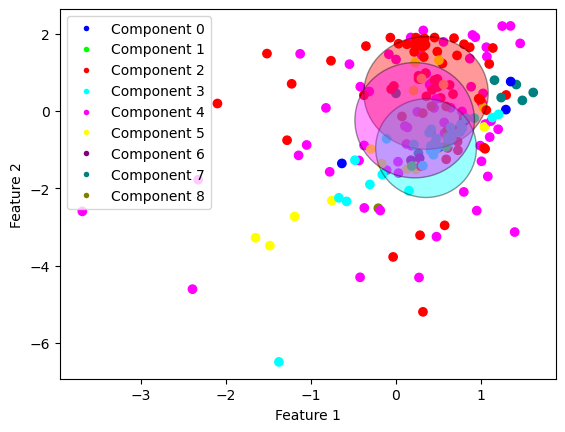

completed gibbs sampling in  7.252563953399658
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.727272727272727 diff:  1.2272727272727266
avg:  9.75 diff:  2.083333333333333
avg:  9.384615384615385 diff:  0.884615384615385
avg:  9.428571428571429 diff:  0.6285714285714281
avg:  9.4 diff:  0.40000000000000036
avg:  9.25 diff:  0.25
avg:  9.235294117647058 diff:  -0.014705882352942012
avg:  9.38888888888889 diff:  -0.05555555555555536
avg:  9.31578947368421 diff:  -0.08421052631578974
avg:  9.3 diff:  -0.4272727272727259
avg:  9.333333333333334 diff:  -0.4166666666666661
avg:  9.409090909090908 diff:  0.024475524475523258
avg:  9.434782608695652 diff:  0.006211180124223503
avg:  9.583333333333334 diff:  0.18333333333333357
avg:  9.6 diff:  0.34999999999999964
avg:  9.538461538461538 diff:  0.30316742081448034
avg:  9.518518518

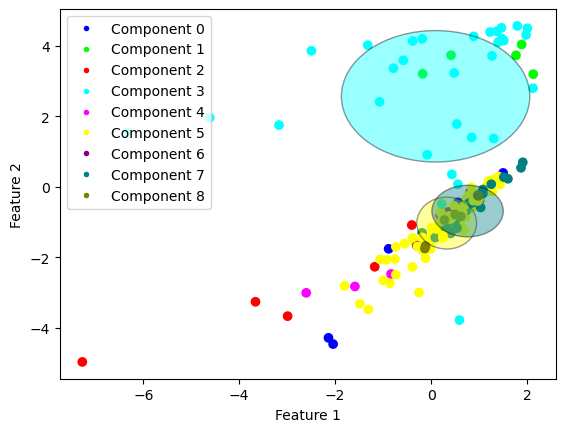

completed gibbs sampling in  6.334190130233765
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.363636363636363 diff:  -0.1363636363636367
avg:  9.583333333333334 diff:  0.5833333333333339
avg:  9.615384615384615 diff:  0.615384615384615
avg:  9.714285714285714 diff:  1.1142857142857139
avg:  9.666666666666666 diff:  0.5
avg:  9.6875 diff:  0.8303571428571423
avg:  9.705882352941176 diff:  0.45588235294117574
avg:  9.777777777777779 diff:  0.6666666666666679
avg:  9.789473684210526 diff:  0.3894736842105253
avg:  9.75 diff:  0.3863636363636367
avg:  9.761904761904763 diff:  0.17857142857142883
avg:  9.545454545454545 diff:  -0.06993006993007
avg:  9.304347826086957 diff:  -0.40993788819875654
avg:  9.375 diff:  -0.2916666666666661
avg:  9.48 diff:  -0.20749999999999957
avg:  9.461538461538462 diff:  -0.24434389140271406
avg:

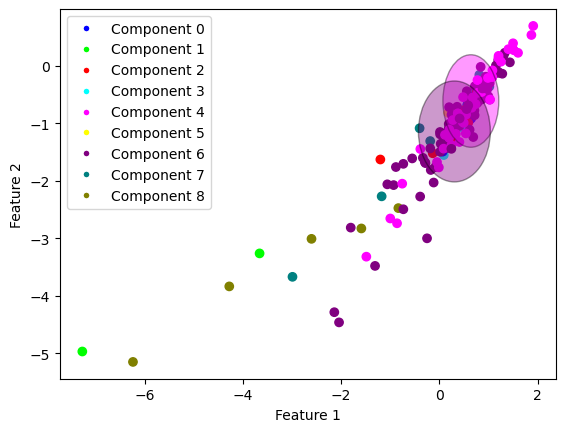

completed gibbs sampling in  7.337650775909424
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.454545454545455 diff:  1.954545454545455
avg:  9.166666666666666 diff:  1.4999999999999991
avg:  8.923076923076923 diff:  0.17307692307692335
avg:  8.928571428571429 diff:  0.12857142857142811
avg:  8.866666666666667 diff:  0.20000000000000107
avg:  8.8125 diff:  -0.1875
avg:  8.823529411764707 diff:  -0.3014705882352935
avg:  8.722222222222221 diff:  -0.5
avg:  8.894736842105264 diff:  -0.20526315789473593
avg:  8.95 diff:  -0.5045454545454557
avg:  8.952380952380953 diff:  -0.21428571428571352
avg:  8.863636363636363 diff:  -0.05944055944056004
avg:  9.08695652173913 diff:  0.158385093167702
avg:  9.125 diff:  0.25833333333333286
avg:  9.2 diff:  0.3874999999999993
avg:  9.26923076923077 diff:  0.44570135746606354
avg:  9.481481

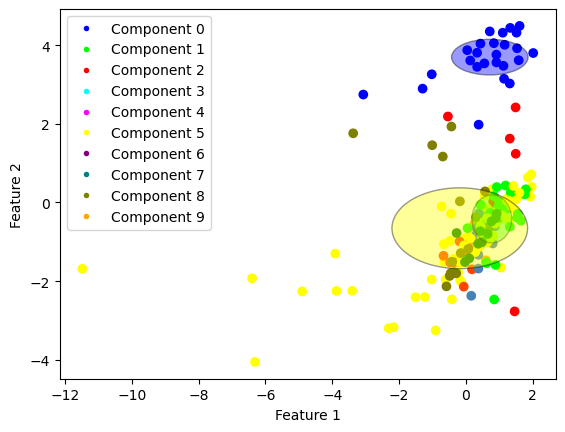

completed gibbs sampling in  6.51025915145874
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.363636363636363 diff:  0.3636363636363633
avg:  11.416666666666666 diff:  1.416666666666666
avg:  11.23076923076923 diff:  0.48076923076922995
avg:  11.142857142857142 diff:  0.14285714285714235
avg:  11.133333333333333 diff:  0.29999999999999893
avg:  10.9375 diff:  -0.6339285714285712
avg:  11.0 diff:  -0.625
avg:  11.0 diff:  -0.5555555555555554
avg:  10.894736842105264 diff:  -0.5052631578947366
avg:  10.8 diff:  -0.5636363636363626
avg:  10.714285714285714 diff:  -0.7023809523809526
avg:  10.681818181818182 diff:  -0.5489510489510483
avg:  10.521739130434783 diff:  -0.6211180124223592
avg:  10.458333333333334 diff:  -0.6749999999999989
avg:  10.28 diff:  -0.6575000000000006
avg:  10.26923076923077 diff:  -0.73076923076923
avg

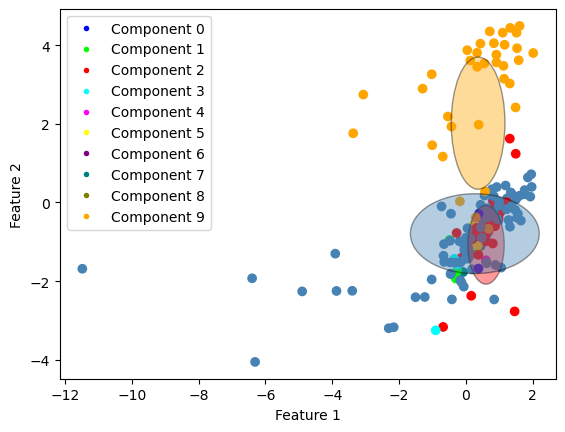

completed gibbs sampling in  6.417995929718018
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.727272727272727 diff:  -0.2727272727272734
avg:  10.75 diff:  -0.5833333333333339
avg:  10.846153846153847 diff:  0.0961538461538467
avg:  10.857142857142858 diff:  -0.742857142857142
avg:  11.0 diff:  -1.0
avg:  10.5625 diff:  -0.7232142857142865
avg:  10.882352941176471 diff:  -0.242647058823529
avg:  10.61111111111111 diff:  0.05555555555555536
avg:  10.789473684210526 diff:  0.28947368421052566
avg:  10.9 diff:  0.17272727272727373
avg:  10.952380952380953 diff:  0.20238095238095255
avg:  11.0 diff:  0.1538461538461533
avg:  11.043478260869565 diff:  0.18633540372670687
avg:  11.125 diff:  0.125
avg:  11.08 diff:  0.5175000000000001
avg:  10.884615384615385 diff:  0.002262443438914019
avg:  10.88888888888889 diff:  0.27777777

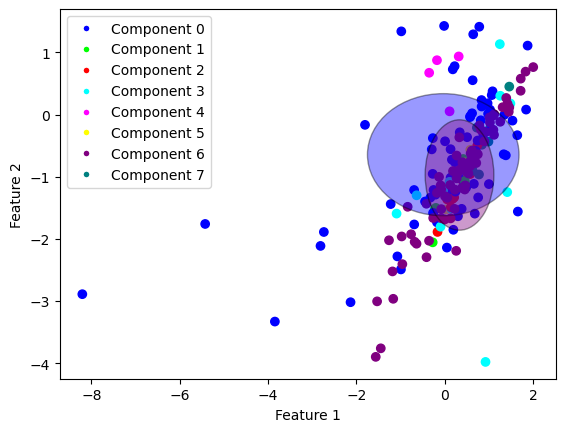

completed gibbs sampling in  6.976839065551758
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.727272727272727 diff:  3.7272727272727266
avg:  10.916666666666666 diff:  2.25
avg:  11.076923076923077 diff:  1.5769230769230766
avg:  11.142857142857142 diff:  0.742857142857142
avg:  11.333333333333334 diff:  0.8333333333333339
avg:  11.4375 diff:  1.0089285714285712
avg:  11.411764705882353 diff:  1.2867647058823533
avg:  11.222222222222221 diff:  1.0
avg:  11.210526315789474 diff:  0.810526315789474
avg:  11.2 diff:  0.47272727272727266
avg:  11.095238095238095 diff:  0.17857142857142883
avg:  11.0 diff:  -0.07692307692307665
avg:  10.826086956521738 diff:  -0.316770186335404
avg:  10.708333333333334 diff:  -0.625
avg:  10.56 diff:  -0.8774999999999995
avg:  10.461538461538462 diff:  -0.9502262443438916
avg:  10.444444444444

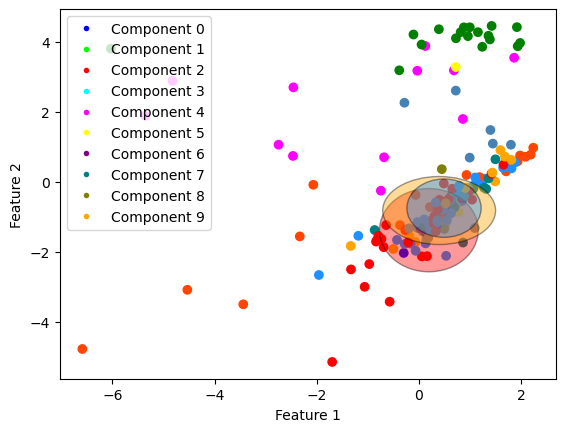

completed gibbs sampling in  7.0189368724823
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.090909090909092 diff:  1.5909090909090917
avg:  11.166666666666666 diff:  -0.16666666666666785
avg:  11.461538461538462 diff:  1.7115384615384617
avg:  11.571428571428571 diff:  2.571428571428571
avg:  11.466666666666667 diff:  1.4666666666666668
avg:  11.5 diff:  0.9285714285714288
avg:  11.235294117647058 diff:  0.235294117647058
avg:  11.38888888888889 diff:  0.05555555555555536
avg:  11.157894736842104 diff:  -0.4421052631578952
avg:  11.05 diff:  -0.040909090909091006
avg:  11.047619047619047 diff:  -0.11904761904761862
avg:  11.0 diff:  -0.4615384615384617
avg:  11.08695652173913 diff:  -0.48447204968944035
avg:  11.041666666666666 diff:  -0.4250000000000007
avg:  10.96 diff:  -0.5399999999999991
avg:  10.76923076923077 diff:

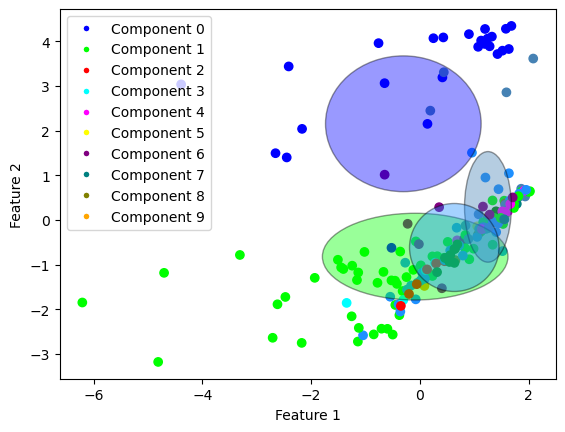

completed gibbs sampling in  6.742594003677368
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.090909090909092 diff:  -0.4090909090909083
avg:  12.166666666666666 diff:  0.16666666666666607
avg:  11.76923076923077 diff:  0.76923076923077
avg:  11.857142857142858 diff:  1.4571428571428573
avg:  11.466666666666667 diff:  0.4666666666666668
avg:  11.5 diff:  0.21428571428571352
avg:  11.647058823529411 diff:  0.27205882352941124
avg:  11.444444444444445 diff:  -0.3333333333333339
avg:  11.157894736842104 diff:  -0.8421052631578956
avg:  11.4 diff:  -0.6909090909090914
avg:  11.428571428571429 diff:  -0.7380952380952372
avg:  11.590909090909092 diff:  -0.17832167832167833
avg:  11.695652173913043 diff:  -0.16149068322981464
avg:  11.666666666666666 diff:  0.1999999999999993
avg:  11.4 diff:  -0.09999999999999964
avg:  11.11538

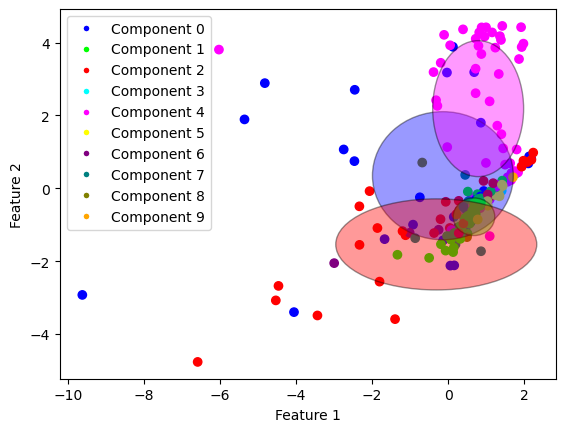

completed gibbs sampling in  6.8611321449279785
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.090909090909092 diff:  -2.9090909090909083
avg:  11.25 diff:  -1.75
avg:  11.23076923076923 diff:  -1.01923076923077
avg:  11.214285714285714 diff:  0.014285714285714235
avg:  11.466666666666667 diff:  0.13333333333333286
avg:  11.75 diff:  0.75
avg:  11.941176470588236 diff:  0.4411764705882355
avg:  11.88888888888889 diff:  0.5555555555555554
avg:  11.947368421052632 diff:  1.0473684210526315
avg:  11.7 diff:  0.6090909090909076
avg:  11.476190476190476 diff:  0.22619047619047628
avg:  11.545454545454545 diff:  0.314685314685315
avg:  11.434782608695652 diff:  0.2204968944099388
avg:  11.375 diff:  -0.09166666666666679
avg:  11.36 diff:  -0.39000000000000057
avg:  11.423076923076923 diff:  -0.5180995475113122
avg:  11.40740740

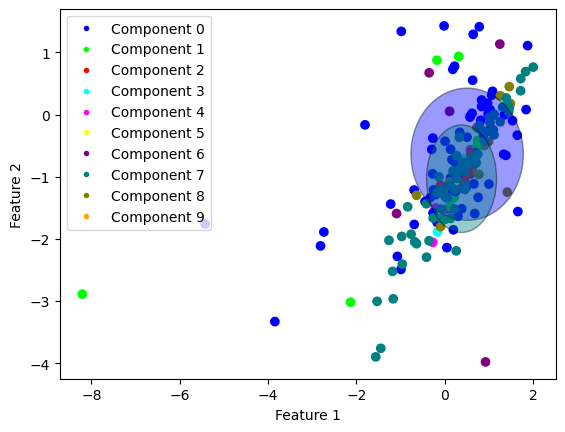

completed gibbs sampling in  6.877844333648682
completed, final component avg:  10.4
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.454545454545455 diff:  -0.545454545454545
avg:  11.333333333333334 diff:  0.3333333333333339
avg:  11.461538461538462 diff:  1.7115384615384617
avg:  11.214285714285714 diff:  1.0142857142857142
avg:  11.666666666666666 diff:  1.0
avg:  11.6875 diff:  0.6875
avg:  11.705882352941176 diff:  0.45588235294117574
avg:  12.0 diff:  0.6666666666666661
avg:  12.263157894736842 diff:  0.9631578947368418
avg:  12.25 diff:  0.795454545454545
avg:  12.095238095238095 diff:  0.761904761904761
avg:  12.045454545454545 diff:  0.5839160839160833
avg:  12.043478260869565 diff:  0.829192546583851
avg:  12.041666666666666 diff:  0.375
avg:  11.92 diff:  0.23249999999999993
avg:  11.846153846153847 diff:  0.140

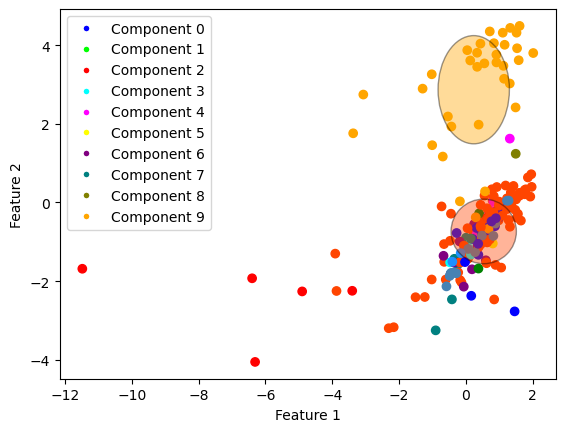

completed gibbs sampling in  8.099732875823975
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  14.818181818181818 diff:  0.8181818181818183
avg:  14.583333333333334 diff:  1.583333333333334
avg:  14.307692307692308 diff:  0.8076923076923084
avg:  14.214285714285714 diff:  0.014285714285714235
avg:  14.066666666666666 diff:  -0.5999999999999996
avg:  14.0 diff:  -0.7142857142857135
avg:  14.117647058823529 diff:  -0.507352941176471
avg:  14.0 diff:  -0.6666666666666661
avg:  13.68421052631579 diff:  -1.1157894736842113
avg:  13.6 diff:  -1.2181818181818187
avg:  13.428571428571429 diff:  -1.154761904761905
avg:  13.636363636363637 diff:  -0.6713286713286717
avg:  13.608695652173912 diff:  -0.6055900621118013
avg:  13.458333333333334 diff:  -0.6083333333333325
avg:  13.44 diff:  -0.5600000000000005
avg:  13.461538461538462 diff

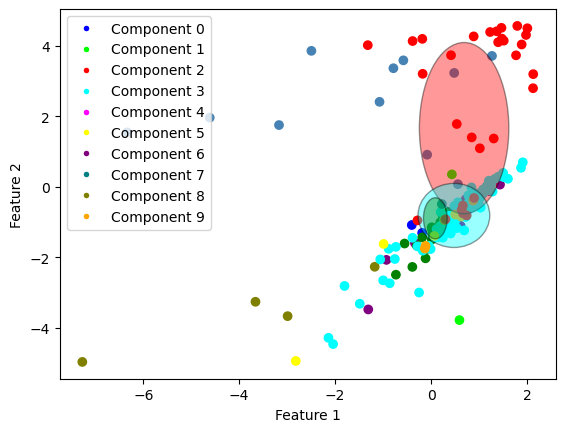

completed gibbs sampling in  8.08384394645691
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.0 diff:  -2.0
avg:  12.083333333333334 diff:  -2.916666666666666
avg:  12.307692307692308 diff:  -3.4423076923076916
avg:  12.5 diff:  -1.9000000000000004
avg:  12.4 diff:  -0.7666666666666657
avg:  12.25 diff:  -0.4642857142857135
avg:  12.176470588235293 diff:  -0.1985294117647065
avg:  12.11111111111111 diff:  0.22222222222222143
avg:  12.052631578947368 diff:  0.15263157894736779
avg:  12.0 diff:  0.0
avg:  12.19047619047619 diff:  0.10714285714285587
avg:  12.227272727272727 diff:  -0.08041958041958175
avg:  12.130434782608695 diff:  -0.36956521739130466
avg:  12.041666666666666 diff:  -0.3583333333333343
avg:  12.4 diff:  0.15000000000000036
avg:  12.307692307692308 diff:  0.13122171945701488
avg:  12.481481481481481 diff:  

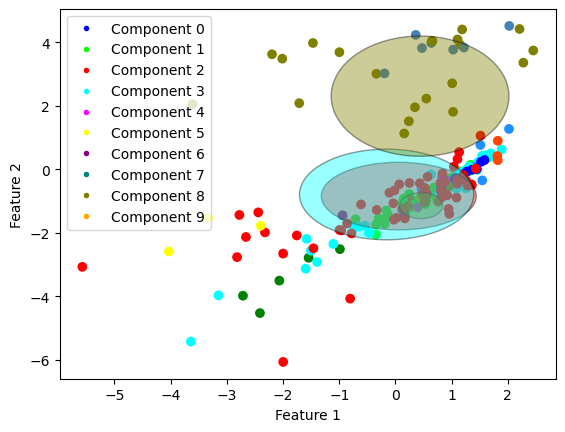

completed gibbs sampling in  7.84433388710022
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  13.909090909090908 diff:  2.4090909090909083
avg:  13.666666666666666 diff:  2.0
avg:  13.307692307692308 diff:  1.3076923076923084
avg:  13.071428571428571 diff:  0.47142857142857153
avg:  12.8 diff:  0.13333333333333464
avg:  12.625 diff:  -0.5178571428571423
avg:  12.529411764705882 diff:  -1.5955882352941178
avg:  12.38888888888889 diff:  -2.0555555555555554
avg:  12.368421052631579 diff:  -1.7315789473684209
avg:  12.25 diff:  -1.6590909090909083
avg:  12.047619047619047 diff:  -1.6190476190476186
avg:  12.090909090909092 diff:  -1.2167832167832167
avg:  12.043478260869565 diff:  -1.0279503105590067
avg:  12.166666666666666 diff:  -0.6333333333333346
avg:  12.16 diff:  -0.46499999999999986
avg:  12.038461538461538 diff:  -0.4909

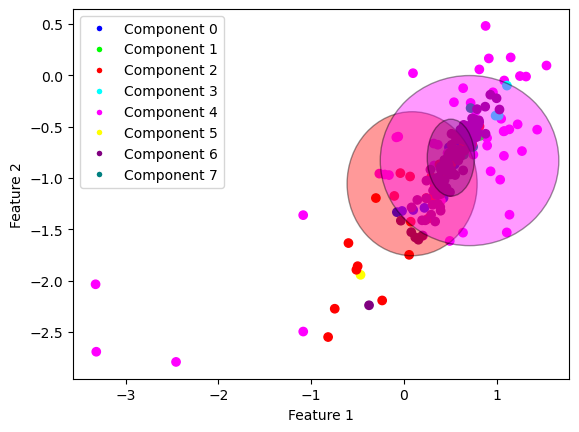

completed gibbs sampling in  8.015432834625244
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.727272727272727 diff:  -2.7727272727272734
avg:  12.083333333333334 diff:  -1.25
avg:  12.0 diff:  -1.25
avg:  12.0 diff:  -1.0
avg:  11.866666666666667 diff:  -0.9666666666666668
avg:  12.0 diff:  -0.5714285714285712
avg:  11.823529411764707 diff:  -1.0514705882352935
avg:  12.055555555555555 diff:  -0.27777777777777857
avg:  11.842105263157896 diff:  -0.5578947368421048
avg:  11.65 diff:  -0.07727272727272627
avg:  11.666666666666666 diff:  -0.41666666666666785
avg:  11.863636363636363 diff:  -0.1363636363636367
avg:  11.73913043478261 diff:  -0.2608695652173907
avg:  11.916666666666666 diff:  0.049999999999998934
avg:  12.04 diff:  0.03999999999999915
avg:  11.961538461538462 diff:  0.13800904977375517
avg:  11.962962962962964

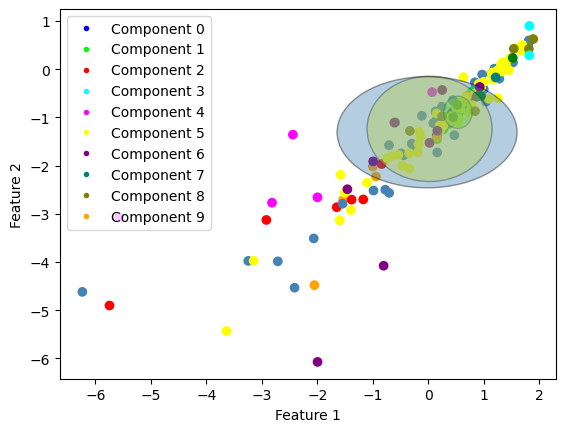

completed gibbs sampling in  8.02371621131897
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  15.090909090909092 diff:  0.09090909090909172
avg:  14.583333333333334 diff:  -0.4166666666666661
avg:  14.846153846153847 diff:  -1.1538461538461533
avg:  15.0 diff:  -1.1999999999999993
avg:  15.0 diff:  -0.8333333333333339
avg:  14.625 diff:  -0.375
avg:  14.588235294117647 diff:  -0.5367647058823533
avg:  14.5 diff:  -0.05555555555555536
avg:  14.263157894736842 diff:  -0.7368421052631575
avg:  14.2 diff:  -0.8909090909090924
avg:  13.857142857142858 diff:  -0.7261904761904763
avg:  13.818181818181818 diff:  -1.0279720279720284
avg:  13.782608695652174 diff:  -1.2173913043478262
avg:  13.916666666666666 diff:  -1.083333333333334
avg:  14.04 diff:  -0.5850000000000009
avg:  14.038461538461538 diff:  -0.5497737556561084
avg:  13.96

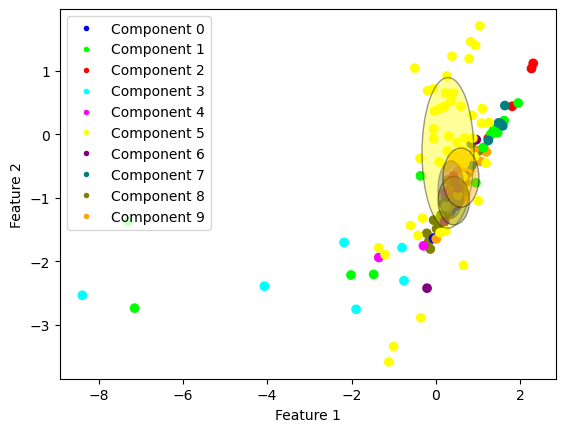

completed gibbs sampling in  8.812896013259888
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  15.636363636363637 diff:  -1.8636363636363633
avg:  15.333333333333334 diff:  -2.9999999999999982
avg:  15.923076923076923 diff:  -1.0769230769230766
avg:  15.642857142857142 diff:  -0.15714285714285836
avg:  15.8 diff:  -0.36666666666666714
avg:  15.8125 diff:  -0.04464285714285765
avg:  15.764705882352942 diff:  0.014705882352942012
avg:  15.444444444444445 diff:  -0.22222222222222143
avg:  15.105263157894736 diff:  -0.49473684210526336
avg:  15.4 diff:  -0.23636363636363633
avg:  15.380952380952381 diff:  0.04761904761904745
avg:  15.227272727272727 diff:  -0.6958041958041967
avg:  14.869565217391305 diff:  -0.7732919254658377
avg:  14.916666666666666 diff:  -0.8833333333333346
avg:  14.88 diff:  -0.9324999999999992
avg:  15.0 di

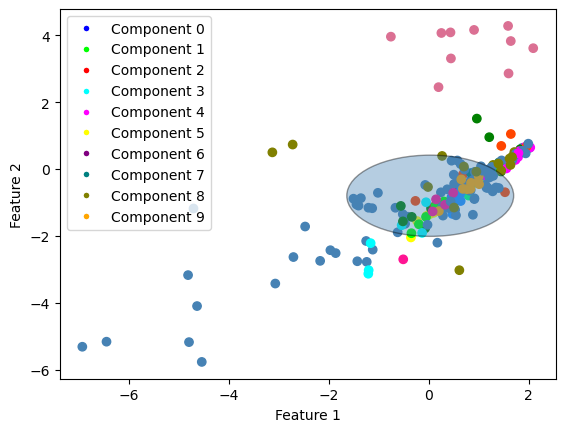

completed gibbs sampling in  8.777543067932129
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  16.272727272727273 diff:  2.2727272727272734
avg:  16.166666666666668 diff:  2.166666666666668
avg:  15.846153846153847 diff:  0.8461538461538467
avg:  15.785714285714286 diff:  -0.21428571428571352
avg:  15.8 diff:  -0.36666666666666714
avg:  15.8125 diff:  -0.4732142857142847
avg:  15.529411764705882 diff:  -0.7205882352941178
avg:  15.666666666666666 diff:  -0.2222222222222232
avg:  15.789473684210526 diff:  -0.31052631578947576
avg:  15.55 diff:  -0.7227272727272727
avg:  15.047619047619047 diff:  -1.1190476190476204
avg:  14.590909090909092 diff:  -1.255244755244755
avg:  14.130434782608695 diff:  -1.6552795031055911
avg:  14.041666666666666 diff:  -1.7583333333333346
avg:  13.8 diff:  -2.0124999999999993
avg:  13.7692307692307

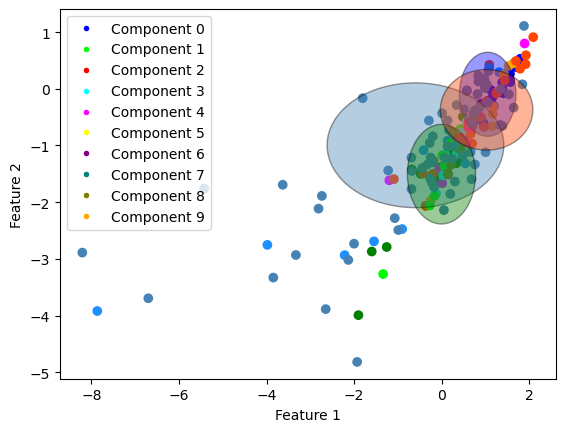

completed gibbs sampling in  8.71673583984375
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  14.909090909090908 diff:  0.4090909090909083
avg:  15.083333333333334 diff:  -0.25
avg:  14.384615384615385 diff:  -1.365384615384615
avg:  14.071428571428571 diff:  -1.9285714285714288
avg:  14.2 diff:  -0.8000000000000007
avg:  13.5625 diff:  -1.8660714285714288
avg:  13.588235294117647 diff:  -1.4117647058823533
avg:  13.61111111111111 diff:  -1.0555555555555554
avg:  13.578947368421053 diff:  -1.8210526315789473
avg:  13.65 diff:  -1.259090909090908
avg:  13.666666666666666 diff:  -1.4166666666666679
avg:  13.863636363636363 diff:  -0.5209790209790217
avg:  13.869565217391305 diff:  -0.20186335403726652
avg:  14.125 diff:  -0.07499999999999929
avg:  13.92 diff:  0.35749999999999993
avg:  14.076923076923077 diff:  0.48868778280542

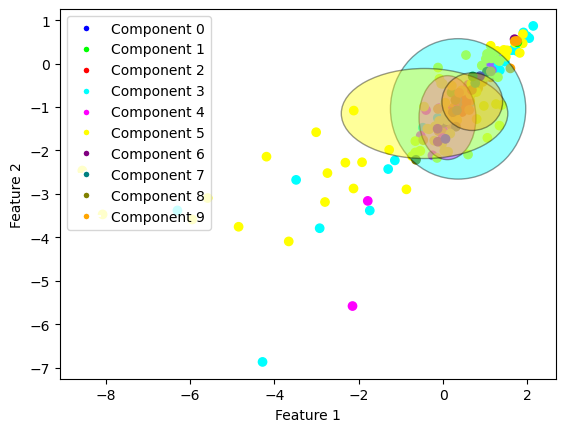

completed gibbs sampling in  8.85503625869751
_______________________________
whale:  0  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  17.09090909090909 diff:  -3.40909090909091
avg:  16.75 diff:  -1.9166666666666679
avg:  16.46153846153846 diff:  -0.7884615384615401
avg:  16.285714285714285 diff:  -1.9142857142857146
avg:  15.8 diff:  -2.1999999999999993
avg:  15.9375 diff:  -1.7767857142857153
avg:  15.764705882352942 diff:  -1.985294117647058
avg:  15.88888888888889 diff:  -1.6666666666666679
avg:  15.526315789473685 diff:  -1.8736842105263136
avg:  15.45 diff:  -1.6409090909090907
avg:  15.380952380952381 diff:  -1.3690476190476186
avg:  15.318181818181818 diff:  -1.1433566433566416
avg:  15.173913043478262 diff:  -1.111801242236023
avg:  15.083333333333334 diff:  -0.7166666666666668
avg:  14.96 diff:  -0.9774999999999991
avg:  14.76923076923077 diff:  -0.995475

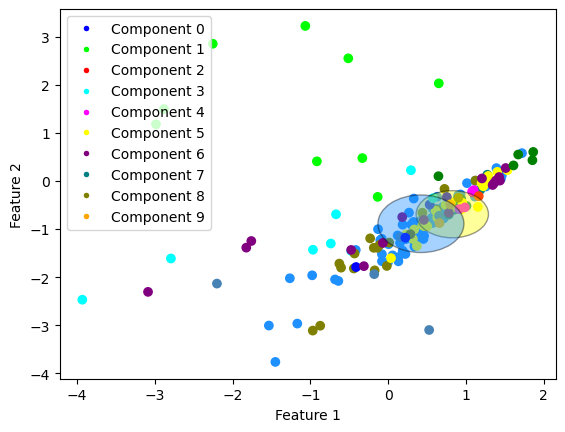

completed gibbs sampling in  8.8295419216156
completed, final component avg:  12.6
testing for whale type:  1
testing for model_type:  wl_hdphmm
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.636363636363637 diff:  -0.3636363636363633
avg:  10.916666666666666 diff:  -0.75
avg:  11.0 diff:  -1.25
avg:  11.0 diff:  -0.5999999999999996
avg:  11.133333333333333 diff:  -0.033333333333333215
avg:  11.3125 diff:  0.3125
avg:  11.176470588235293 diff:  0.3014705882352935
avg:  11.11111111111111 diff:  0.44444444444444464
avg:  11.210526315789474 diff:  0.6105263157894747
avg:  10.95 diff:  0.3136363636363626
avg:  10.952380952380953 diff:  0.035714285714286476
avg:  11.090909090909092 diff:  0.09090909090909172
avg:  11.173913043478262 diff:  0.17391304347826164
avg:  11.125 diff:  -0.00833333333333286
avg:  11.24 diff:  -0.07249

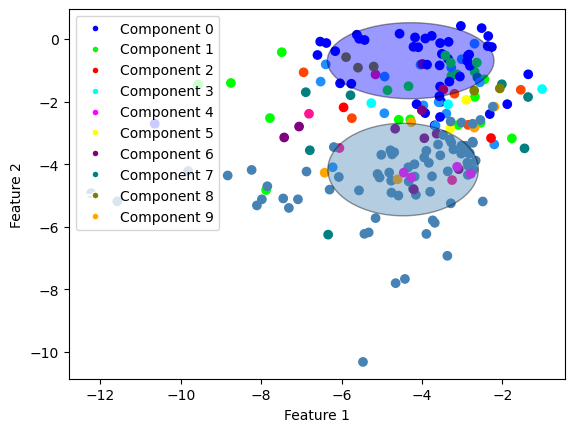

completed gibbs sampling in  6.529319763183594
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.181818181818182 diff:  -0.8181818181818183
avg:  10.083333333333334 diff:  -1.25
avg:  10.307692307692308 diff:  -0.9423076923076916
avg:  9.928571428571429 diff:  -1.0714285714285712
avg:  9.733333333333333 diff:  -1.2666666666666675
avg:  9.5625 diff:  -1.1517857142857135
avg:  9.529411764705882 diff:  -1.2205882352941178
avg:  9.555555555555555 diff:  -1.0
avg:  9.421052631578947 diff:  -1.078947368421053
avg:  9.35 diff:  -0.831818181818182
avg:  9.571428571428571 diff:  -0.5119047619047628
avg:  9.454545454545455 diff:  -0.8531468531468533
avg:  9.304347826086957 diff:  -0.6242236024844718
avg:  9.25 diff:  -0.4833333333333325
avg:  9.28 diff:  -0.28250000000000064
avg:  9.26923076923077 diff:  -0.2601809954751122
avg:  9.37

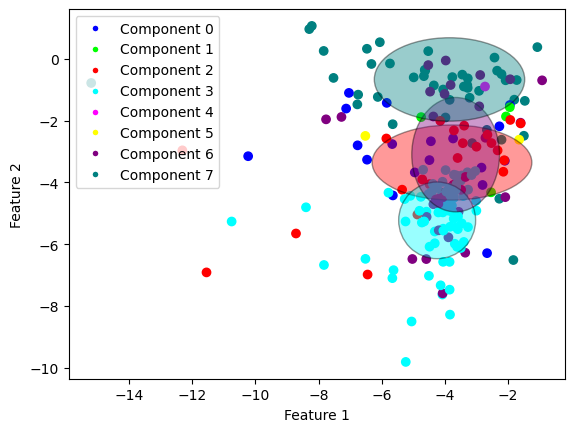

completed gibbs sampling in  6.081655025482178
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.727272727272727 diff:  1.2272727272727266
avg:  9.916666666666666 diff:  1.5833333333333321
avg:  9.461538461538462 diff:  0.4615384615384617
avg:  9.5 diff:  0.3000000000000007
avg:  9.4 diff:  -0.2666666666666657
avg:  9.25 diff:  -0.4642857142857135
avg:  9.0 diff:  -0.375
avg:  9.11111111111111 diff:  -0.11111111111111072
avg:  9.105263157894736 diff:  -0.3947368421052637
avg:  9.3 diff:  -0.4272727272727259
avg:  9.238095238095237 diff:  -0.6785714285714288
avg:  9.227272727272727 diff:  -0.23426573426573505
avg:  9.173913043478262 diff:  -0.32608695652173836
avg:  9.125 diff:  -0.27500000000000036
avg:  9.12 diff:  -0.13000000000000078
avg:  9.038461538461538 diff:  0.038461538461538325
avg:  9.148148148148149 diff:  0.03703

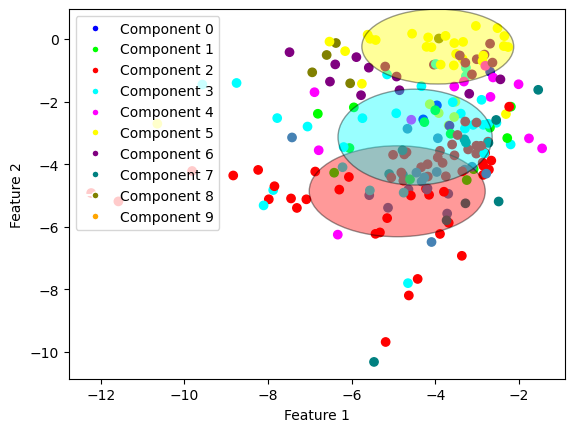

completed gibbs sampling in  6.2968480587005615
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.363636363636363 diff:  -0.6363636363636367
avg:  10.166666666666666 diff:  -2.5
avg:  10.153846153846153 diff:  -1.0961538461538467
avg:  10.0 diff:  -1.4000000000000004
avg:  9.866666666666667 diff:  -0.6333333333333329
avg:  9.9375 diff:  -0.4910714285714288
avg:  9.764705882352942 diff:  -0.735294117647058
avg:  9.555555555555555 diff:  -1.0
avg:  9.526315789473685 diff:  -0.5736842105263147
avg:  9.5 diff:  -0.8636363636363633
avg:  9.476190476190476 diff:  -0.6904761904761898
avg:  9.5 diff:  -0.6538461538461533
avg:  9.565217391304348 diff:  -0.43478260869565233
avg:  9.625 diff:  -0.24166666666666714
avg:  9.72 diff:  -0.21749999999999936
avg:  9.653846153846153 diff:  -0.11085972850678871
avg:  9.444444444444445 diff:  -

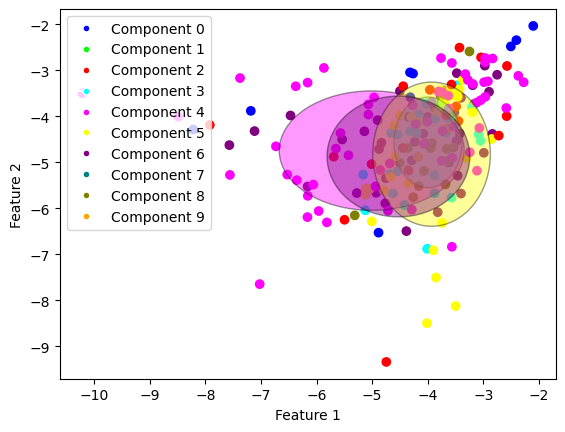

completed gibbs sampling in  6.124652862548828
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.363636363636363 diff:  0.3636363636363633
avg:  9.583333333333334 diff:  0.25
avg:  9.76923076923077 diff:  0.26923076923077005
avg:  9.714285714285714 diff:  0.11428571428571388
avg:  9.933333333333334 diff:  0.43333333333333357
avg:  10.0 diff:  0.7142857142857135
avg:  10.176470588235293 diff:  1.1764705882352935
avg:  9.944444444444445 diff:  1.166666666666666
avg:  9.947368421052632 diff:  0.8473684210526322
avg:  10.0 diff:  0.6363636363636367
avg:  10.047619047619047 diff:  0.4642857142857135
avg:  10.136363636363637 diff:  0.36713286713286664
avg:  10.130434782608695 diff:  0.4161490683229818
avg:  10.291666666666666 diff:  0.3583333333333325
avg:  10.16 diff:  0.16000000000000014
avg:  10.0 diff:  -0.1764705882352935
avg:

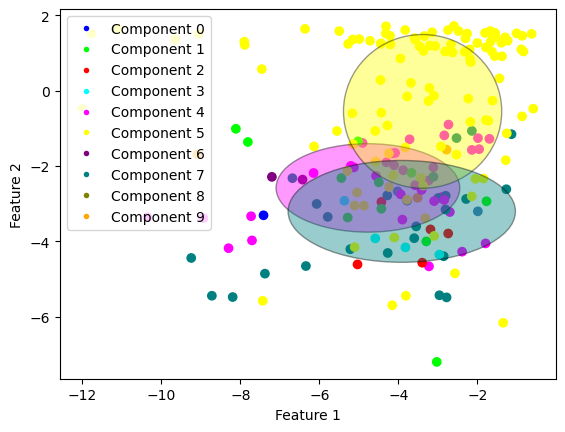

completed gibbs sampling in  6.506026029586792
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.090909090909092 diff:  -1.4090909090909083
avg:  10.166666666666666 diff:  -0.8333333333333339
avg:  10.153846153846153 diff:  -0.3461538461538467
avg:  9.928571428571429 diff:  -0.47142857142857153
avg:  9.666666666666666 diff:  -1.0
avg:  9.75 diff:  -0.6785714285714288
avg:  9.588235294117647 diff:  -0.41176470588235325
avg:  9.38888888888889 diff:  -0.7222222222222214
avg:  9.368421052631579 diff:  -0.931578947368422
avg:  9.4 diff:  -0.6909090909090914
avg:  9.285714285714286 diff:  -0.8809523809523796
avg:  9.318181818181818 diff:  -0.835664335664335
avg:  9.521739130434783 diff:  -0.4068322981366457
avg:  9.666666666666666 diff:  0.0
avg:  9.76 diff:  0.009999999999999787
avg:  9.692307692307692 diff:  0.10407239819004488


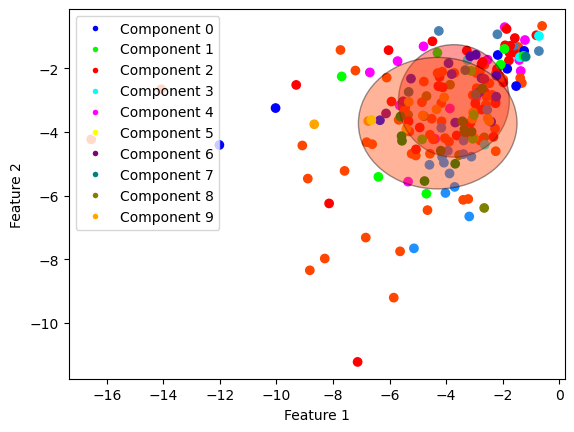

completed gibbs sampling in  6.577989816665649
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.272727272727273 diff:  -0.7272727272727266
avg:  10.0 diff:  -1.0
avg:  10.23076923076923 diff:  -0.76923076923077
avg:  10.071428571428571 diff:  -0.5285714285714285
avg:  10.2 diff:  0.36666666666666536
avg:  10.25 diff:  0.5357142857142865
avg:  10.176470588235293 diff:  0.4264705882352935
avg:  10.0 diff:  -0.44444444444444464
avg:  10.052631578947368 diff:  -0.44736842105263186
avg:  10.0 diff:  -0.2727272727272734
avg:  9.857142857142858 diff:  -0.14285714285714235
avg:  9.909090909090908 diff:  -0.32167832167832167
avg:  9.782608695652174 diff:  -0.28881987577639734
avg:  9.875 diff:  -0.3249999999999993
avg:  9.92 diff:  -0.33000000000000007
avg:  10.0 diff:  -0.1764705882352935
avg:  10.037037037037036 diff:  0.037037037

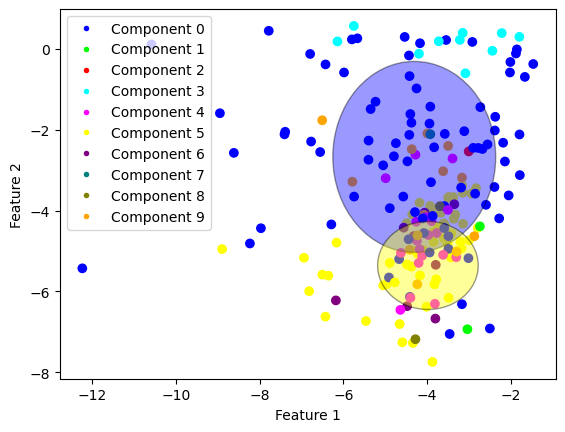

completed gibbs sampling in  6.170551776885986
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.363636363636363 diff:  0.3636363636363633
avg:  9.416666666666666 diff:  -0.9166666666666679
avg:  9.0 diff:  -0.5
avg:  8.928571428571429 diff:  -0.27142857142857046
avg:  9.2 diff:  0.033333333333333215
avg:  9.1875 diff:  -0.3839285714285712
avg:  9.352941176470589 diff:  -0.022058823529411242
avg:  9.333333333333334 diff:  0.0
avg:  9.473684210526315 diff:  0.27368421052631575
avg:  9.2 diff:  -0.16363636363636402
avg:  9.333333333333334 diff:  -0.08333333333333215
avg:  9.272727272727273 diff:  0.2727272727272734
avg:  9.173913043478262 diff:  0.24534161490683282
avg:  9.083333333333334 diff:  -0.11666666666666536
avg:  9.0 diff:  -0.1875
avg:  9.038461538461538 diff:  -0.31447963800905043
avg:  9.148148148148149 diff:  -0.18

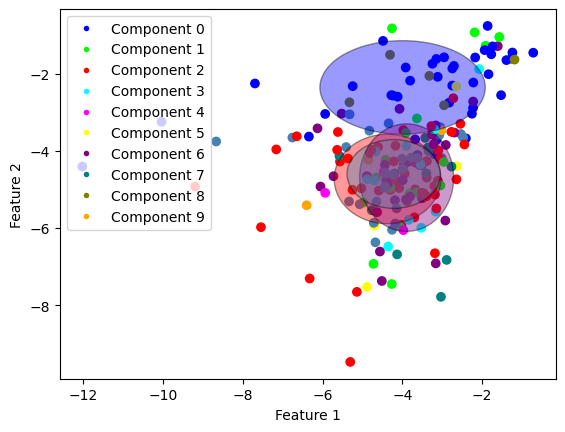

completed gibbs sampling in  6.295393943786621
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.363636363636363 diff:  -3.6363636363636367
avg:  9.416666666666666 diff:  -1.9166666666666679
avg:  9.307692307692308 diff:  -2.1923076923076916
avg:  9.5 diff:  -1.9000000000000004
avg:  9.4 diff:  -1.2666666666666657
avg:  9.4375 diff:  -1.1339285714285712
avg:  9.411764705882353 diff:  -1.0882352941176467
avg:  9.5 diff:  -0.6111111111111107
avg:  9.631578947368421 diff:  0.031578947368421595
avg:  9.8 diff:  0.4363636363636374
avg:  9.80952380952381 diff:  0.3928571428571441
avg:  9.818181818181818 diff:  0.51048951048951
avg:  9.826086956521738 diff:  0.32608695652173836
avg:  9.75 diff:  0.34999999999999964
avg:  9.8 diff:  0.3625000000000007
avg:  9.846153846153847 diff:  0.43438914027149345
avg:  9.88888888888889 diff:  0.

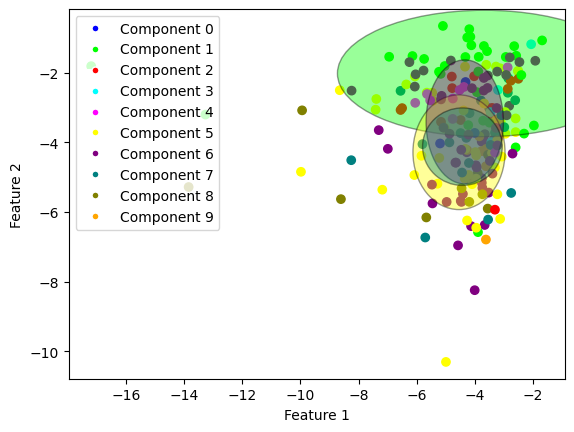

completed gibbs sampling in  6.345539093017578
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.636363636363637 diff:  1.6363636363636367
avg:  10.333333333333334 diff:  -0.33333333333333215
avg:  10.538461538461538 diff:  -0.21153846153846168
avg:  10.642857142857142 diff:  -0.15714285714285836
avg:  10.466666666666667 diff:  -0.36666666666666714
avg:  10.375 diff:  -0.625
avg:  10.117647058823529 diff:  -0.882352941176471
avg:  10.166666666666666 diff:  -0.6111111111111125
avg:  10.157894736842104 diff:  -0.5421052631578949
avg:  10.15 diff:  -0.48636363636363633
avg:  10.19047619047619 diff:  -0.14285714285714413
avg:  10.136363636363637 diff:  -0.40209790209790164
avg:  10.0 diff:  -0.6428571428571423
avg:  9.875 diff:  -0.5916666666666668
avg:  9.8 diff:  -0.5749999999999993
avg:  9.73076923076923 diff:  -0.38687782805

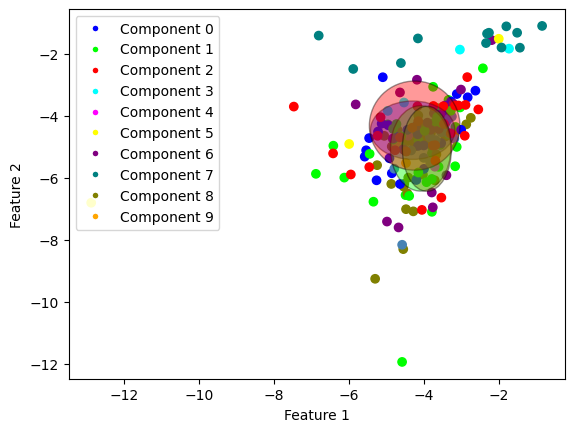

completed gibbs sampling in  6.005604028701782
completed, final component avg:  9.7
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.454545454545455 diff:  -2.545454545454545
avg:  11.75 diff:  -0.5833333333333339
avg:  11.692307692307692 diff:  -0.3076923076923084
avg:  11.571428571428571 diff:  -0.22857142857142954
avg:  11.533333333333333 diff:  0.36666666666666714
avg:  11.625 diff:  0.48214285714285765
avg:  11.588235294117647 diff:  0.33823529411764675
avg:  11.555555555555555 diff:  0.0
avg:  11.526315789473685 diff:  -0.17368421052631433
avg:  11.7 diff:  0.24545454545454426
avg:  11.428571428571429 diff:  -0.3214285714285712
avg:  11.454545454545455 diff:  -0.2377622377622366
avg:  11.652173913043478 diff:  0.08074534161490732
avg:  11.666666666666666 diff:  0.13333333333333286
avg:  11.56 diff:  -0.064999999999999

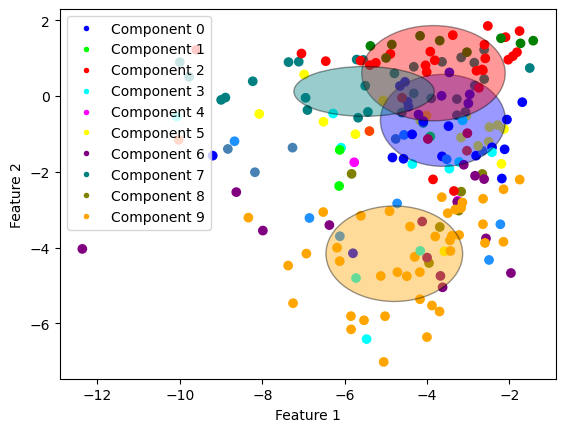

completed gibbs sampling in  7.8301801681518555
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.636363636363637 diff:  1.1363636363636367
avg:  13.0 diff:  0.0
avg:  12.923076923076923 diff:  0.6730769230769234
avg:  12.714285714285714 diff:  0.7142857142857135
avg:  12.533333333333333 diff:  0.36666666666666714
avg:  12.3125 diff:  0.16964285714285765
avg:  12.470588235294118 diff:  0.22058823529411775
avg:  12.444444444444445 diff:  0.0
avg:  12.31578947368421 diff:  -0.284210526315789
avg:  12.15 diff:  -0.48636363636363633
avg:  12.238095238095237 diff:  -0.7619047619047628
avg:  12.227272727272727 diff:  -0.6958041958041967
avg:  12.08695652173913 diff:  -0.6273291925465827
avg:  11.875 diff:  -0.6583333333333332
avg:  11.8 diff:  -0.5124999999999993
avg:  11.692307692307692 diff:  -0.7782805429864261
avg:  11.8148148

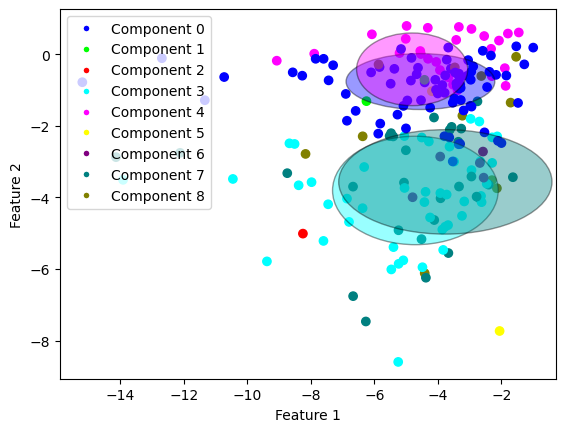

completed gibbs sampling in  7.957964181900024
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.454545454545455 diff:  3.954545454545455
avg:  12.5 diff:  3.5
avg:  12.615384615384615 diff:  4.365384615384615
avg:  12.857142857142858 diff:  2.6571428571428584
avg:  12.733333333333333 diff:  2.0666666666666664
avg:  12.5625 diff:  0.8482142857142865
avg:  12.411764705882353 diff:  0.41176470588235325
avg:  12.277777777777779 diff:  0.055555555555557135
avg:  12.210526315789474 diff:  -0.08947368421052637
avg:  12.2 diff:  -0.25454545454545574
avg:  12.095238095238095 diff:  -0.4047619047619051
avg:  11.954545454545455 diff:  -0.66083916083916
avg:  11.73913043478261 diff:  -1.1180124223602483
avg:  11.666666666666666 diff:  -1.0666666666666664
avg:  11.56 diff:  -1.0024999999999995
avg:  11.461538461538462 diff:  -0.95022624

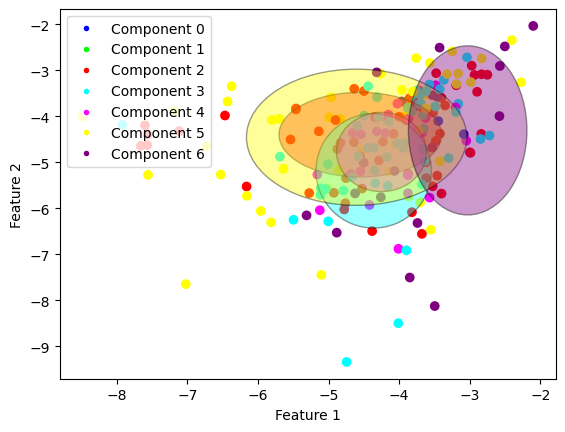

completed gibbs sampling in  7.630558967590332
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.818181818181818 diff:  -2.6818181818181817
avg:  11.666666666666666 diff:  -3.0
avg:  11.692307692307692 diff:  -2.0576923076923084
avg:  11.785714285714286 diff:  -1.4142857142857128
avg:  11.733333333333333 diff:  -1.2666666666666675
avg:  11.6875 diff:  -0.7410714285714288
avg:  11.411764705882353 diff:  -1.3382352941176467
avg:  11.38888888888889 diff:  -1.5
avg:  11.421052631578947 diff:  -0.8789473684210538
avg:  11.15 diff:  -0.668181818181818
avg:  11.047619047619047 diff:  -0.6190476190476186
avg:  11.090909090909092 diff:  -0.6013986013985999
avg:  11.0 diff:  -0.7857142857142865
avg:  11.291666666666666 diff:  -0.44166666666666643
avg:  11.44 diff:  -0.2475000000000005
avg:  11.346153846153847 diff:  -0.065610859728506

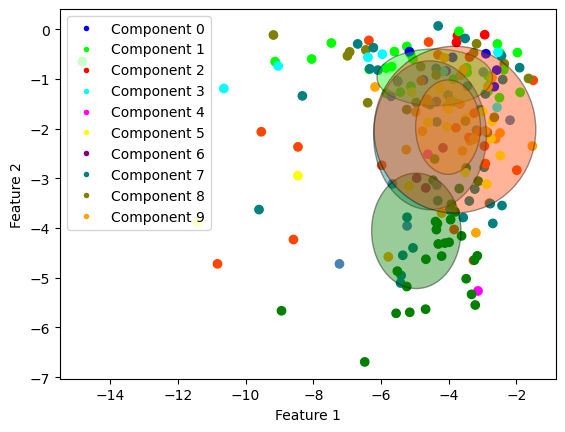

completed gibbs sampling in  7.912554979324341
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.818181818181818 diff:  -0.18181818181818166
avg:  13.0 diff:  -1.666666666666666
avg:  12.923076923076923 diff:  -1.5769230769230766
avg:  12.857142857142858 diff:  -1.1428571428571423
avg:  12.466666666666667 diff:  -0.8666666666666671
avg:  12.4375 diff:  -0.41964285714285765
avg:  12.235294117647058 diff:  -0.639705882352942
avg:  12.5 diff:  -0.3888888888888893
avg:  12.736842105263158 diff:  0.03684210526315823
avg:  12.8 diff:  -0.018181818181817633
avg:  12.857142857142858 diff:  -0.14285714285714235
avg:  12.636363636363637 diff:  -0.28671328671328666
avg:  12.652173913043478 diff:  -0.20496894409937916
avg:  12.708333333333334 diff:  0.24166666666666714
avg:  12.52 diff:  0.08249999999999957
avg:  12.346153846153847 diff

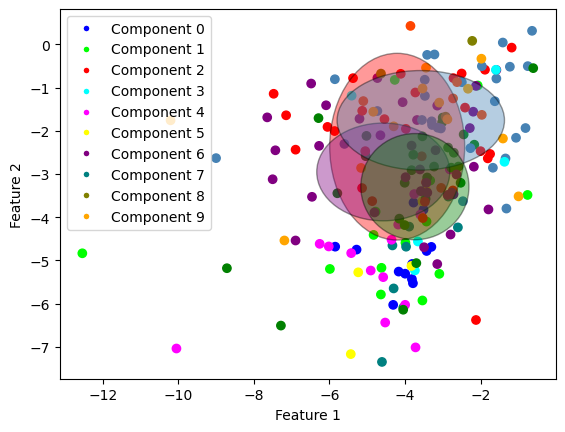

completed gibbs sampling in  7.87804913520813
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.181818181818182 diff:  -1.3181818181818183
avg:  11.666666666666666 diff:  0.33333333333333215
avg:  11.923076923076923 diff:  1.4230769230769234
avg:  12.0 diff:  2.1999999999999993
avg:  11.866666666666667 diff:  1.5333333333333332
avg:  11.6875 diff:  1.4017857142857135
avg:  11.529411764705882 diff:  1.0294117647058822
avg:  11.5 diff:  0.7222222222222214
avg:  11.368421052631579 diff:  0.36842105263157876
avg:  11.55 diff:  0.36818181818181905
avg:  11.571428571428571 diff:  -0.0952380952380949
avg:  11.681818181818182 diff:  -0.2412587412587417
avg:  11.521739130434783 diff:  -0.47826086956521685
avg:  11.416666666666666 diff:  -0.45000000000000107
avg:  11.52 diff:  -0.16750000000000043
avg:  11.653846153846153 diff:  0.124

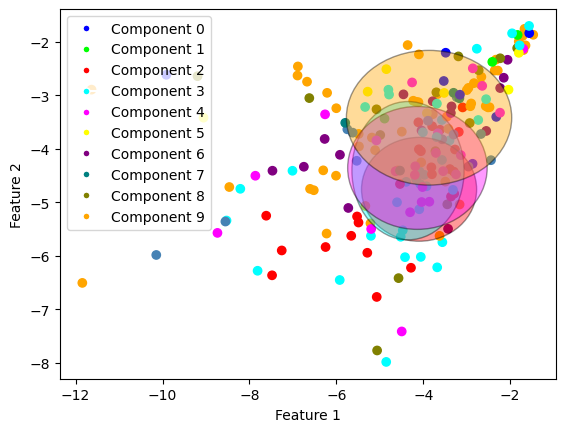

completed gibbs sampling in  7.722682952880859
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.363636363636363 diff:  0.8636363636363633
avg:  12.5 diff:  0.5
avg:  12.76923076923077 diff:  0.26923076923077005
avg:  12.857142857142858 diff:  0.05714285714285694
avg:  12.6 diff:  -0.23333333333333428
avg:  12.3125 diff:  -0.6875
avg:  12.470588235294118 diff:  0.09558823529411775
avg:  12.11111111111111 diff:  -0.5555555555555554
avg:  12.210526315789474 diff:  -0.28947368421052566
avg:  12.15 diff:  -0.21363636363636296
avg:  12.333333333333334 diff:  -0.16666666666666607
avg:  12.318181818181818 diff:  -0.4510489510489517
avg:  12.217391304347826 diff:  -0.6397515527950315
avg:  12.25 diff:  -0.34999999999999964
avg:  12.28 diff:  -0.03250000000000064
avg:  12.423076923076923 diff:  -0.0475113122171944
avg:  12.5185185185

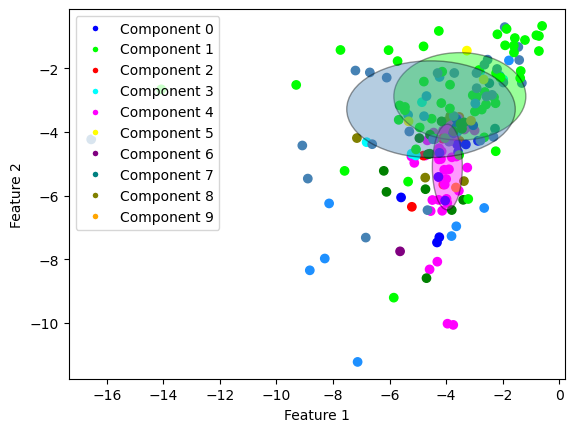

completed gibbs sampling in  8.080523014068604
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  14.363636363636363 diff:  -0.1363636363636367
avg:  14.25 diff:  -0.75
avg:  14.23076923076923 diff:  -1.01923076923077
avg:  14.214285714285714 diff:  -1.1857142857142868
avg:  14.133333333333333 diff:  -1.5333333333333332
avg:  14.125 diff:  -1.4464285714285712
avg:  14.117647058823529 diff:  -1.132352941176471
avg:  14.055555555555555 diff:  -0.7222222222222232
avg:  14.052631578947368 diff:  -0.6473684210526311
avg:  14.0 diff:  -0.3636363636363633
avg:  13.80952380952381 diff:  -0.4404761904761898
avg:  13.727272727272727 diff:  -0.5034965034965033
avg:  13.608695652173912 diff:  -0.6055900621118013
avg:  13.625 diff:  -0.5083333333333329
avg:  13.6 diff:  -0.5250000000000004
avg:  13.423076923076923 diff:  -0.6945701357466056


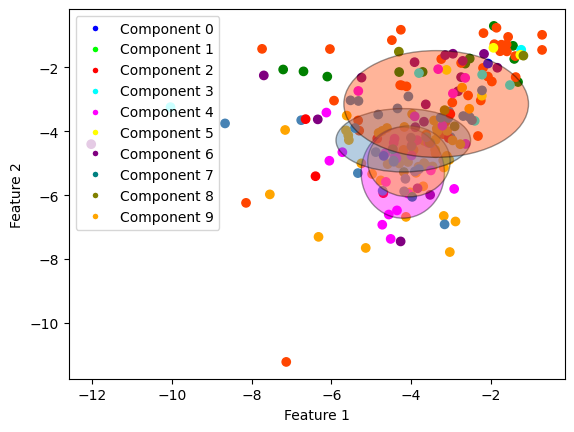

completed gibbs sampling in  7.88051700592041
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.363636363636363 diff:  0.3636363636363633
avg:  12.333333333333334 diff:  2.0
avg:  12.307692307692308 diff:  0.8076923076923084
avg:  12.357142857142858 diff:  -0.042857142857142705
avg:  12.333333333333334 diff:  0.8333333333333339
avg:  12.25 diff:  0.5357142857142865
avg:  12.235294117647058 diff:  0.360294117647058
avg:  12.0 diff:  0.11111111111111072
avg:  11.947368421052632 diff:  -0.15263157894736779
avg:  11.95 diff:  -0.413636363636364
avg:  11.80952380952381 diff:  -0.5238095238095237
avg:  12.0 diff:  -0.3076923076923084
avg:  11.956521739130435 diff:  -0.4006211180124222
avg:  11.791666666666666 diff:  -0.5416666666666679
avg:  11.68 diff:  -0.5700000000000003
avg:  11.76923076923077 diff:  -0.46606334841628794
avg: 

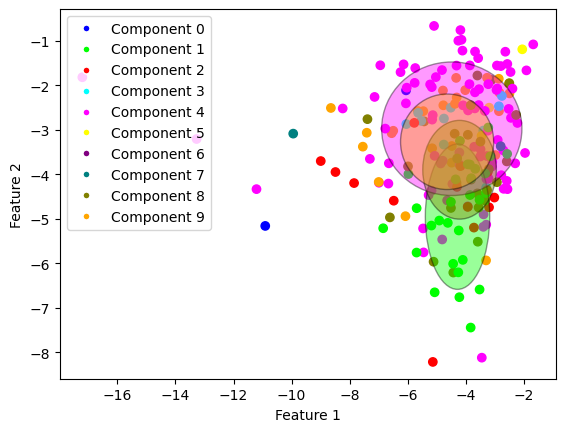

completed gibbs sampling in  7.526325941085815
_______________________________
whale:  1  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.909090909090908 diff:  -1.0909090909090917
avg:  12.25 diff:  -0.75
avg:  12.23076923076923 diff:  -1.51923076923077
avg:  12.214285714285714 diff:  -1.3857142857142861
avg:  12.4 diff:  -0.43333333333333357
avg:  12.4375 diff:  0.008928571428571175
avg:  12.470588235294118 diff:  0.47058823529411775
avg:  12.222222222222221 diff:  0.22222222222222143
avg:  12.210526315789474 diff:  0.310526315789474
avg:  12.1 diff:  0.19090909090909136
avg:  12.0 diff:  -0.25
avg:  12.045454545454545 diff:  -0.18531468531468498
avg:  11.956521739130435 diff:  -0.25776397515527805
avg:  11.875 diff:  -0.5250000000000004
avg:  11.88 diff:  -0.5574999999999992
avg:  11.73076923076923 diff:  -0.7398190045248878
avg:  11.592592592592593 diff:  -0.62

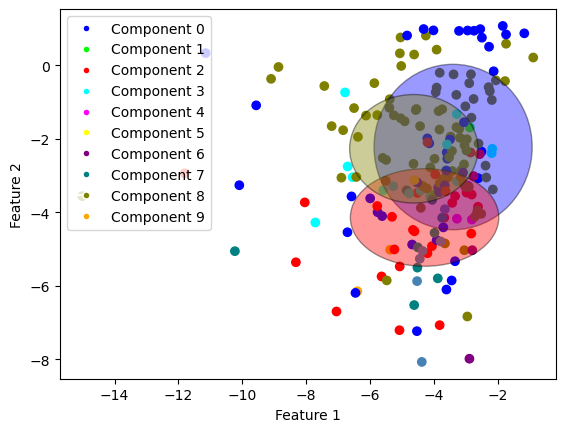

completed gibbs sampling in  7.877691030502319
completed, final component avg:  11.5
testing for whale type:  2
testing for model_type:  wl_hdphmm
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  14.0 diff:  -2.5
avg:  13.75 diff:  -2.583333333333332
avg:  13.461538461538462 diff:  -2.7884615384615383
avg:  13.214285714285714 diff:  -3.385714285714288
avg:  13.0 diff:  -3.0
avg:  12.8125 diff:  -2.616071428571429
avg:  12.529411764705882 diff:  -2.5955882352941178
avg:  12.444444444444445 diff:  -2.4444444444444446
avg:  12.31578947368421 diff:  -1.98421052631579
avg:  12.15 diff:  -1.8499999999999996
avg:  12.0 diff:  -1.75
avg:  11.909090909090908 diff:  -1.5524475524475534
avg:  11.782608695652174 diff:  -1.4316770186335397
avg:  11.75 diff:  -1.25
avg:  11.64 diff:  -1.1724999999999994
avg:  11.5 diff:  -1.0294117647058822

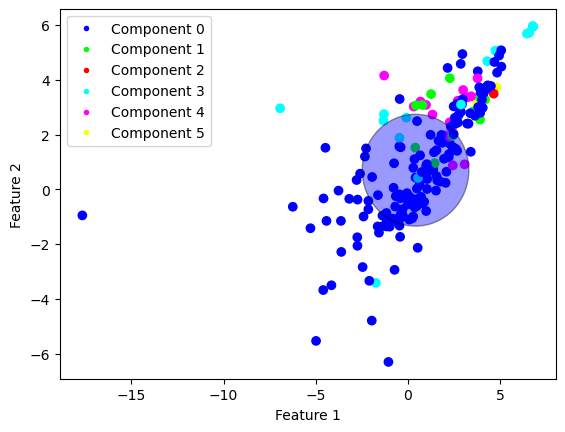

completed gibbs sampling in  5.8905181884765625
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.909090909090908 diff:  -3.5909090909090917
avg:  12.666666666666666 diff:  -3.333333333333334
avg:  12.538461538461538 diff:  -2.9615384615384617
avg:  12.714285714285714 diff:  -1.8857142857142861
avg:  12.866666666666667 diff:  -1.299999999999999
avg:  12.9375 diff:  -0.9196428571428577
avg:  12.705882352941176 diff:  -1.1691176470588243
avg:  12.555555555555555 diff:  -1.0
avg:  12.31578947368421 diff:  -0.8842105263157887
avg:  12.2 diff:  -0.709090909090909
avg:  12.095238095238095 diff:  -0.5714285714285712
avg:  11.954545454545455 diff:  -0.5839160839160833
avg:  12.0 diff:  -0.7142857142857135
avg:  11.916666666666666 diff:  -0.9500000000000011
avg:  11.96 diff:  -0.9774999999999991
avg:  11.961538461538462 diff:  -0.744

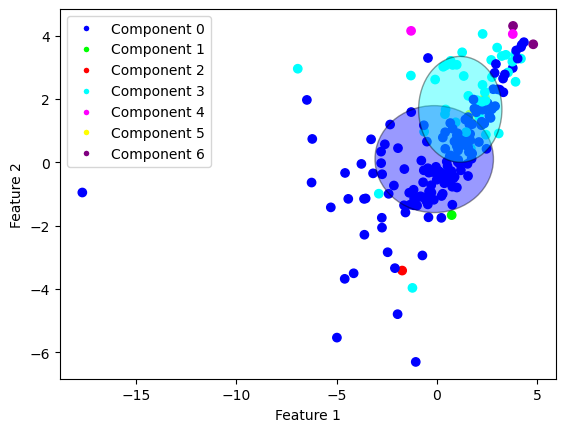

completed gibbs sampling in  6.382587194442749
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.909090909090908 diff:  -3.0909090909090917
avg:  12.583333333333334 diff:  -3.416666666666666
avg:  12.461538461538462 diff:  -3.2884615384615383
avg:  12.357142857142858 diff:  -2.6428571428571423
avg:  12.266666666666667 diff:  -2.7333333333333325
avg:  11.875 diff:  -2.2678571428571423
avg:  11.823529411764707 diff:  -2.1764705882352935
avg:  11.555555555555555 diff:  -1.8888888888888893
avg:  11.263157894736842 diff:  -2.0368421052631582
avg:  11.15 diff:  -1.759090909090908
avg:  11.0 diff:  -1.583333333333334
avg:  11.0 diff:  -1.4615384615384617
avg:  10.782608695652174 diff:  -1.5745341614906838
avg:  10.708333333333334 diff:  -1.5583333333333336
avg:  10.6 diff:  -1.2750000000000004
avg:  10.615384615384615 diff:  -1.208

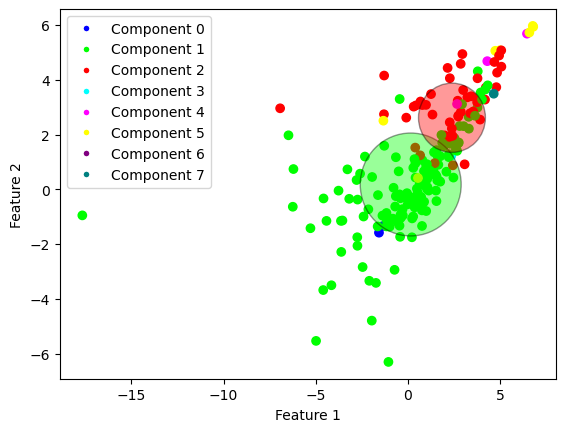

completed gibbs sampling in  6.1870527267456055
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  13.0 diff:  -5.0
avg:  13.083333333333334 diff:  -3.2499999999999982
avg:  12.846153846153847 diff:  -2.4038461538461533
avg:  12.785714285714286 diff:  -1.8142857142857132
avg:  12.6 diff:  -2.0666666666666664
avg:  12.5 diff:  -1.6428571428571423
avg:  12.411764705882353 diff:  -1.3382352941176467
avg:  12.277777777777779 diff:  -1.0555555555555554
avg:  12.31578947368421 diff:  -0.6842105263157894
avg:  12.45 diff:  -0.5500000000000007
avg:  12.476190476190476 diff:  -0.6071428571428577
avg:  12.409090909090908 diff:  -0.4370629370629384
avg:  12.217391304347826 diff:  -0.5683229813664603
avg:  12.125 diff:  -0.47499999999999964
avg:  11.92 diff:  -0.5800000000000001
avg:  11.807692307692308 diff:  -0.6040723981900449
avg:  11.7

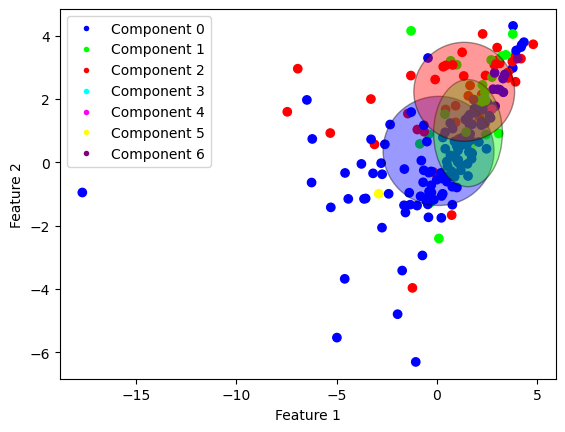

completed gibbs sampling in  6.528115749359131
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  14.090909090909092 diff:  -2.9090909090909083
avg:  13.666666666666666 diff:  -3.666666666666666
avg:  13.461538461538462 diff:  -4.038461538461538
avg:  13.285714285714286 diff:  -3.114285714285712
avg:  13.0 diff:  -2.5
avg:  12.75 diff:  -2.678571428571429
avg:  12.529411764705882 diff:  -2.2205882352941178
avg:  12.333333333333334 diff:  -2.2222222222222214
avg:  12.31578947368421 diff:  -2.1842105263157894
avg:  12.15 diff:  -1.9409090909090914
avg:  12.095238095238095 diff:  -1.5714285714285712
avg:  12.0 diff:  -1.4615384615384617
avg:  11.956521739130435 diff:  -1.329192546583851
avg:  11.875 diff:  -1.125
avg:  11.84 diff:  -0.9100000000000001
avg:  11.653846153846153 diff:  -0.875565610859729
avg:  11.481481481481481 diff:

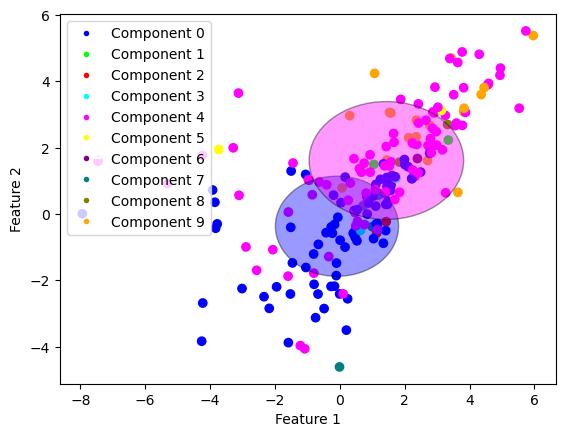

completed gibbs sampling in  6.367481231689453
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.272727272727273 diff:  -3.2272727272727266
avg:  11.833333333333334 diff:  -3.166666666666666
avg:  11.615384615384615 diff:  -3.134615384615385
avg:  11.357142857142858 diff:  -2.8428571428571416
avg:  11.133333333333333 diff:  -2.533333333333333
avg:  10.8125 diff:  -2.1875
avg:  10.705882352941176 diff:  -2.2941176470588243
avg:  10.666666666666666 diff:  -2.222222222222223
avg:  10.526315789473685 diff:  -2.1736842105263143
avg:  10.5 diff:  -1.7727272727272734
avg:  10.476190476190476 diff:  -1.3571428571428577
avg:  10.227272727272727 diff:  -1.3881118881118883
avg:  10.130434782608695 diff:  -1.2267080745341623
avg:  10.0 diff:  -1.1333333333333329
avg:  9.84 diff:  -0.9725000000000001
avg:  9.884615384615385 diff:  -0.821

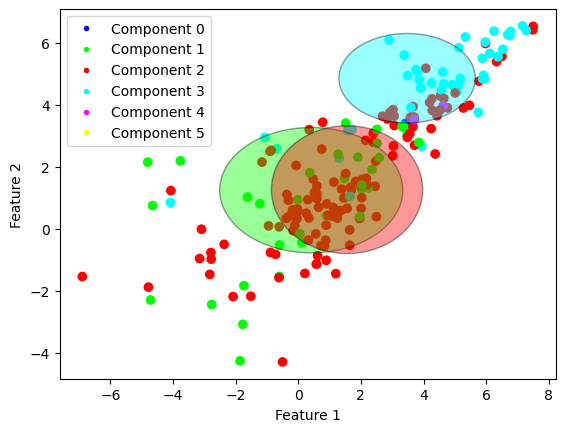

completed gibbs sampling in  5.400031089782715
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.181818181818182 diff:  -4.818181818181818
avg:  10.75 diff:  -3.583333333333334
avg:  10.384615384615385 diff:  -3.865384615384615
avg:  10.214285714285714 diff:  -3.585714285714287
avg:  10.2 diff:  -2.8000000000000007
avg:  10.0625 diff:  -2.508928571428571
avg:  9.941176470588236 diff:  -2.3088235294117645
avg:  9.722222222222221 diff:  -1.9444444444444446
avg:  9.526315789473685 diff:  -1.8736842105263154
avg:  9.35 diff:  -1.831818181818182
avg:  9.476190476190476 diff:  -1.2738095238095237
avg:  9.545454545454545 diff:  -0.83916083916084
avg:  9.391304347826088 diff:  -0.8229813664596257
avg:  9.25 diff:  -0.9499999999999993
avg:  9.12 diff:  -0.9425000000000008
avg:  9.038461538461538 diff:  -0.9027149321266972
avg:  8.925

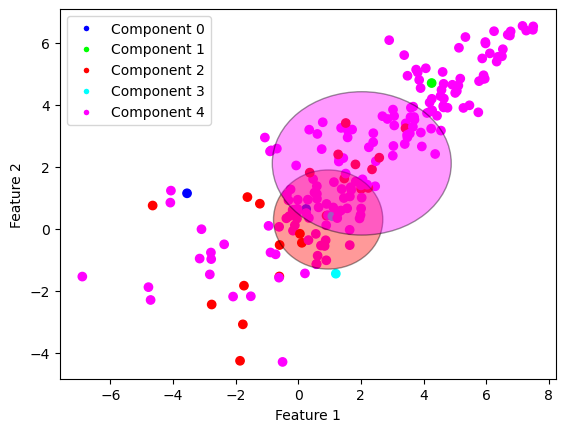

completed gibbs sampling in  5.323089122772217
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.909090909090908 diff:  -2.5909090909090917
avg:  11.666666666666666 diff:  -3.0
avg:  11.615384615384615 diff:  -2.634615384615385
avg:  11.571428571428571 diff:  -2.428571428571429
avg:  11.333333333333334 diff:  -2.5
avg:  10.9375 diff:  -2.3482142857142865
avg:  10.588235294117647 diff:  -2.2867647058823533
avg:  10.5 diff:  -2.0555555555555554
avg:  10.421052631578947 diff:  -1.8789473684210538
avg:  10.15 diff:  -1.759090909090908
avg:  10.047619047619047 diff:  -1.6190476190476186
avg:  9.863636363636363 diff:  -1.7517482517482517
avg:  9.73913043478261 diff:  -1.8322981366459619
avg:  9.75 diff:  -1.583333333333334
avg:  9.64 diff:  -1.2974999999999994
avg:  9.538461538461538 diff:  -1.0497737556561084
avg:  9.444444444444

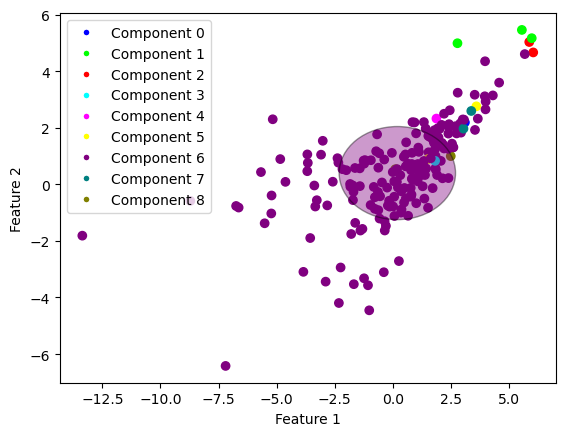

completed gibbs sampling in  5.39618992805481
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.909090909090908 diff:  -6.590909090909092
avg:  9.833333333333334 diff:  -4.833333333333332
avg:  9.846153846153847 diff:  -2.9038461538461533
avg:  10.0 diff:  -2.1999999999999993
avg:  9.866666666666667 diff:  -1.799999999999999
avg:  9.875 diff:  -0.8392857142857135
avg:  9.705882352941176 diff:  -0.5441176470588243
avg:  9.5 diff:  -0.27777777777777857
avg:  9.31578947368421 diff:  -0.38421052631578867
avg:  9.35 diff:  -0.5590909090909086
avg:  9.142857142857142 diff:  -0.6904761904761916
avg:  9.136363636363637 diff:  -0.70979020979021
avg:  8.91304347826087 diff:  -1.0869565217391308
avg:  9.041666666666666 diff:  -0.8250000000000011
avg:  8.88 diff:  -0.9949999999999992
avg:  8.73076923076923 diff:  -0.9751131221719458
avg:

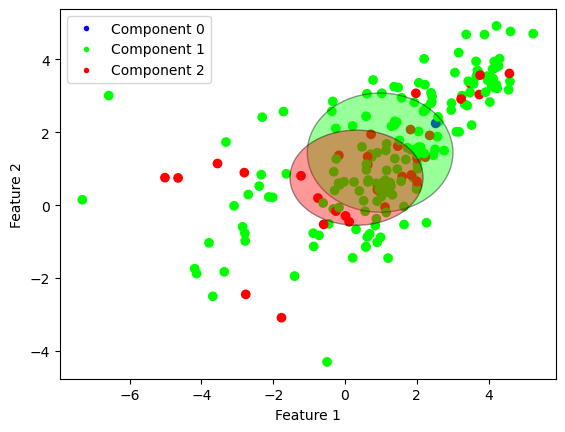

completed gibbs sampling in  4.937146902084351
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.818181818181818 diff:  -4.681818181818182
avg:  11.5 diff:  -5.166666666666668
avg:  11.307692307692308 diff:  -3.6923076923076916
avg:  10.857142857142858 diff:  -2.942857142857143
avg:  10.4 diff:  -2.7666666666666657
avg:  10.125 diff:  -2.7321428571428577
avg:  10.117647058823529 diff:  -2.007352941176471
avg:  10.11111111111111 diff:  -2.222222222222223
avg:  10.157894736842104 diff:  -1.742105263157896
avg:  10.05 diff:  -1.7681818181818176
avg:  10.095238095238095 diff:  -1.404761904761905
avg:  9.954545454545455 diff:  -1.3531468531468533
avg:  10.08695652173913 diff:  -0.7701863354037268
avg:  10.166666666666666 diff:  -0.23333333333333428
avg:  10.0 diff:  -0.125
avg:  9.961538461538462 diff:  -0.15610859728506732
avg: 

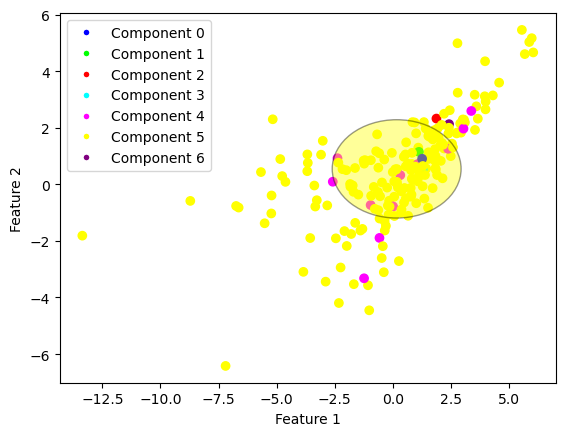

completed gibbs sampling in  5.554466962814331
completed, final component avg:  7.7
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  19.272727272727273 diff:  -0.7272727272727266
avg:  18.75 diff:  -1.5833333333333321
avg:  18.923076923076923 diff:  -2.3269230769230766
avg:  18.642857142857142 diff:  -2.557142857142857
avg:  18.333333333333332 diff:  -2.5
avg:  18.3125 diff:  -1.9732142857142847
avg:  18.0 diff:  -2.125
avg:  17.666666666666668 diff:  -1.4444444444444429
avg:  17.526315789473685 diff:  -1.6736842105263143
avg:  17.45 diff:  -1.822727272727274
avg:  17.19047619047619 diff:  -1.5595238095238102
avg:  16.954545454545453 diff:  -1.96853146853147
avg:  16.91304347826087 diff:  -1.7298136645962714
avg:  17.0 diff:  -1.3333333333333321
avg:  17.04 diff:  -1.2725000000000009
avg:  16.923076923076923 diff:  -1.07692307

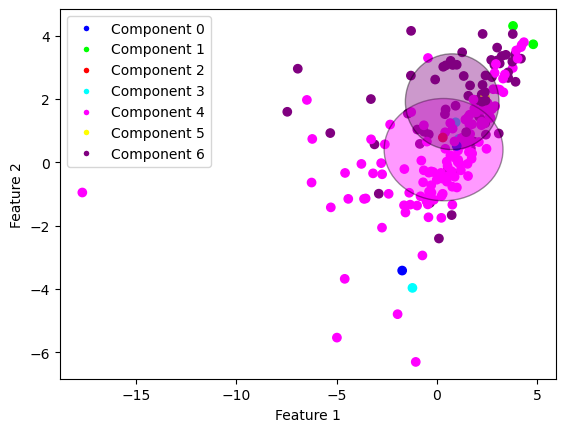

completed gibbs sampling in  8.419287919998169
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  19.181818181818183 diff:  -3.8181818181818166
avg:  18.333333333333332 diff:  -4.0
avg:  18.0 diff:  -4.0
avg:  18.071428571428573 diff:  -3.7285714285714278
avg:  18.0 diff:  -3.333333333333332
avg:  17.625 diff:  -3.5178571428571423
avg:  17.352941176470587 diff:  -3.647058823529413
avg:  17.22222222222222 diff:  -2.8888888888888893
avg:  17.105263157894736 diff:  -2.2947368421052623
avg:  17.0 diff:  -2.1818181818181834
avg:  16.761904761904763 diff:  -1.5714285714285694
avg:  16.59090909090909 diff:  -1.40909090909091
avg:  16.47826086956522 diff:  -1.5931677018633543
avg:  16.25 diff:  -1.75
avg:  16.0 diff:  -1.625
avg:  16.23076923076923 diff:  -1.122171945701357
avg:  16.40740740740741 diff:  -0.8148148148148131
avg:  16.535

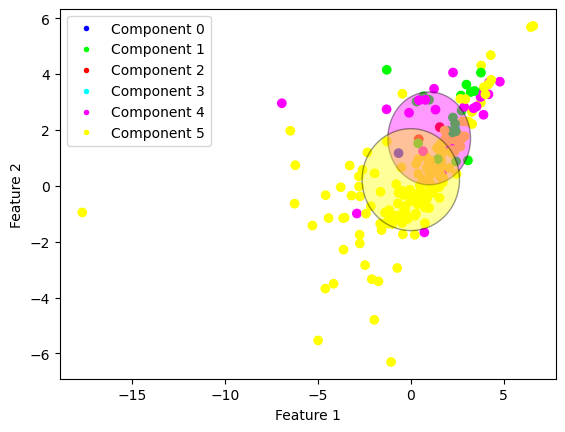

completed gibbs sampling in  8.850185871124268
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  19.818181818181817 diff:  -2.1818181818181834
avg:  19.5 diff:  -2.833333333333332
avg:  19.153846153846153 diff:  -2.8461538461538467
avg:  18.785714285714285 diff:  -2.614285714285714
avg:  18.333333333333332 diff:  -2.666666666666668
avg:  17.9375 diff:  -3.0625
avg:  17.647058823529413 diff:  -3.477941176470587
avg:  17.38888888888889 diff:  -3.3888888888888893
avg:  17.05263157894737 diff:  -3.1473684210526294
avg:  16.85 diff:  -2.968181818181815
avg:  16.761904761904763 diff:  -2.7380952380952372
avg:  16.681818181818183 diff:  -2.47202797202797
avg:  16.652173913043477 diff:  -2.133540372670808
avg:  16.666666666666668 diff:  -1.6666666666666643
avg:  16.56 diff:  -1.3775000000000013
avg:  16.384615384615383 diff:  -1.262443

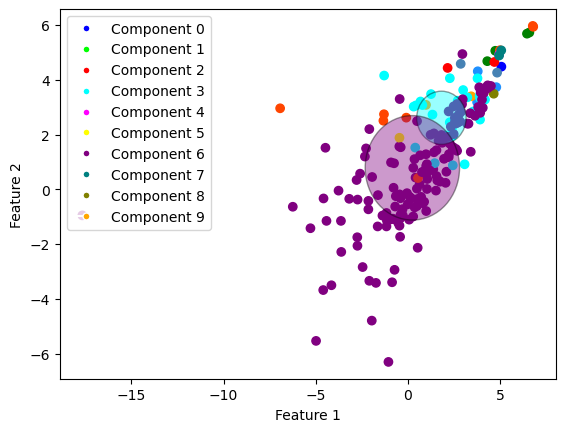

completed gibbs sampling in  8.411364793777466
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  19.0 diff:  -4.5
avg:  18.25 diff:  -3.75
avg:  17.923076923076923 diff:  -3.8269230769230766
avg:  17.857142857142858 diff:  -3.7428571428571438
avg:  17.8 diff:  -3.866666666666667
avg:  17.5625 diff:  -2.866071428571427
avg:  17.352941176470587 diff:  -2.897058823529413
avg:  17.0 diff:  -3.0
avg:  16.894736842105264 diff:  -2.7052631578947377
avg:  16.75 diff:  -2.25
avg:  16.80952380952381 diff:  -1.4404761904761898
avg:  16.818181818181817 diff:  -1.1048951048951068
avg:  16.782608695652176 diff:  -1.074534161490682
avg:  16.583333333333332 diff:  -1.2166666666666686
avg:  16.44 diff:  -1.1224999999999987
avg:  16.346153846153847 diff:  -1.0067873303167403
avg:  16.22222222222222 diff:  -0.7777777777777786
avg:  16.03571428571

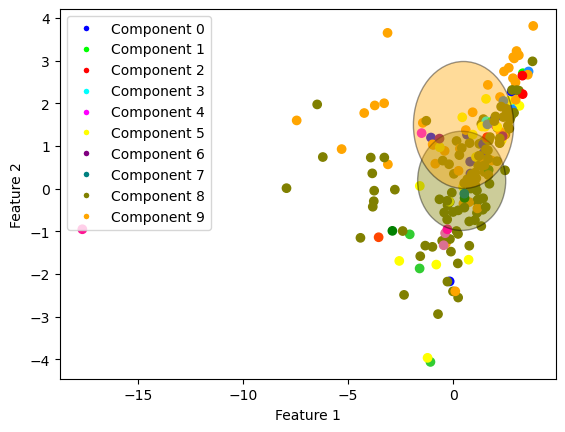

completed gibbs sampling in  8.889587879180908
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  18.454545454545453 diff:  -1.5454545454545467
avg:  18.0 diff:  -3.0
avg:  17.615384615384617 diff:  -4.134615384615383
avg:  17.357142857142858 diff:  -3.6428571428571423
avg:  16.933333333333334 diff:  -3.3999999999999986
avg:  16.8125 diff:  -3.1875
avg:  16.764705882352942 diff:  -2.485294117647058
avg:  16.77777777777778 diff:  -2.2222222222222214
avg:  16.42105263157895 diff:  -2.0789473684210513
avg:  16.2 diff:  -2.254545454545454
avg:  16.19047619047619 diff:  -1.8095238095238102
avg:  16.0 diff:  -1.6153846153846168
avg:  15.956521739130435 diff:  -1.4006211180124222
avg:  15.833333333333334 diff:  -1.0999999999999996
avg:  15.72 diff:  -1.0924999999999994
avg:  15.615384615384615 diff:  -1.149321266968327
avg:  15.3333333

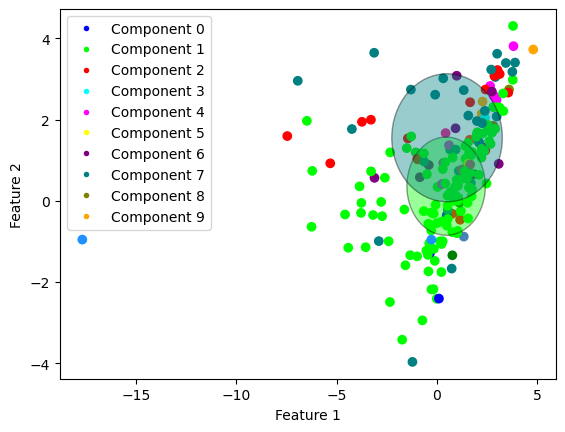

completed gibbs sampling in  8.15571904182434
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  14.727272727272727 diff:  -5.272727272727273
avg:  14.333333333333334 diff:  -4.666666666666666
avg:  14.307692307692308 diff:  -3.9423076923076916
avg:  14.071428571428571 diff:  -3.7285714285714295
avg:  14.066666666666666 diff:  -3.2666666666666657
avg:  14.0625 diff:  -2.9375
avg:  13.882352941176471 diff:  -2.242647058823529
avg:  13.666666666666666 diff:  -2.222222222222223
avg:  13.526315789473685 diff:  -1.6736842105263143
avg:  13.5 diff:  -1.2272727272727266
avg:  13.428571428571429 diff:  -0.9047619047619051
avg:  13.136363636363637 diff:  -1.1713286713286717
avg:  13.130434782608695 diff:  -0.9409937888198758
avg:  13.041666666666666 diff:  -1.0250000000000004
avg:  12.76 diff:  -1.3025000000000002
avg:  12.69230769230769

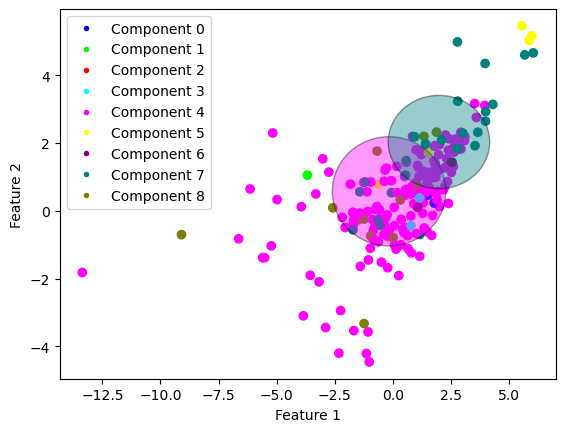

completed gibbs sampling in  7.377280950546265
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  14.909090909090908 diff:  -6.090909090909092
avg:  14.75 diff:  -5.25
avg:  14.461538461538462 diff:  -5.538461538461538
avg:  14.285714285714286 diff:  -3.5142857142857142
avg:  14.333333333333334 diff:  -2.4999999999999982
avg:  14.25 diff:  -1.8928571428571423
avg:  13.882352941176471 diff:  -2.242647058823529
avg:  13.833333333333334 diff:  -1.8333333333333321
avg:  13.68421052631579 diff:  -1.4157894736842103
avg:  13.45 diff:  -1.459090909090909
avg:  13.19047619047619 diff:  -1.5595238095238102
avg:  13.272727272727273 diff:  -1.1888111888111883
avg:  13.130434782608695 diff:  -1.1552795031055911
avg:  13.333333333333334 diff:  -1.0
avg:  13.2 diff:  -1.0500000000000007
avg:  12.923076923076923 diff:  -0.9592760180995477
avg:

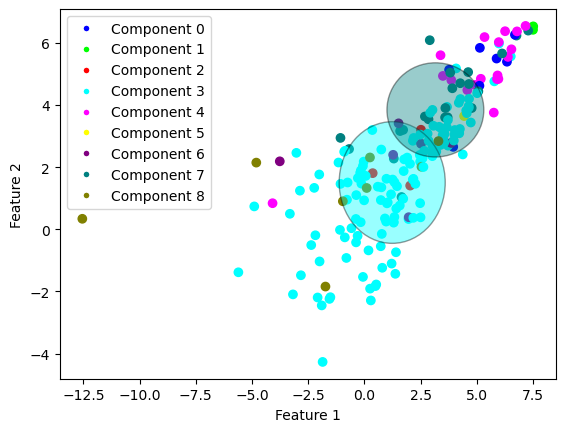

completed gibbs sampling in  7.268924951553345
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  14.272727272727273 diff:  -7.727272727272727
avg:  14.25 diff:  -5.083333333333332
avg:  14.0 diff:  -4.0
avg:  13.5 diff:  -3.6999999999999993
avg:  13.333333333333334 diff:  -2.666666666666666
avg:  13.0625 diff:  -2.508928571428571
avg:  12.823529411764707 diff:  -2.0514705882352935
avg:  12.777777777777779 diff:  -2.0
avg:  12.894736842105264 diff:  -1.405263157894737
avg:  12.6 diff:  -1.6727272727272737
avg:  12.380952380952381 diff:  -1.8690476190476186
avg:  12.090909090909092 diff:  -1.9090909090909083
avg:  11.956521739130435 diff:  -1.5434782608695645
avg:  11.875 diff:  -1.458333333333334
avg:  11.92 diff:  -1.1425
avg:  11.76923076923077 diff:  -1.0542986425339365
avg:  11.703703703703704 diff:  -1.0740740740740744
avg:

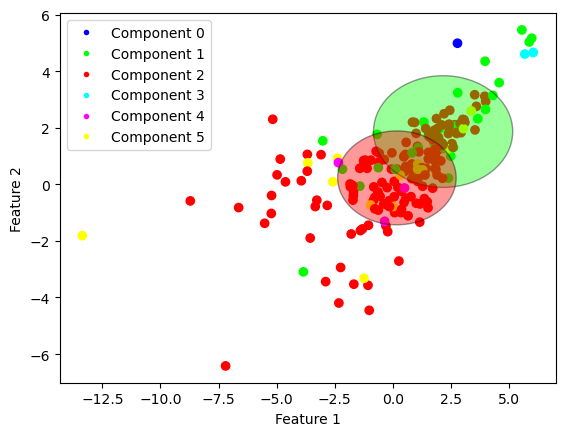

completed gibbs sampling in  6.6073760986328125
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  15.909090909090908 diff:  -4.590909090909092
avg:  15.416666666666666 diff:  -3.583333333333334
avg:  14.846153846153847 diff:  -4.153846153846153
avg:  14.5 diff:  -4.5
avg:  14.333333333333334 diff:  -4.499999999999998
avg:  14.3125 diff:  -3.6875
avg:  14.058823529411764 diff:  -3.3161764705882355
avg:  13.777777777777779 diff:  -2.7777777777777786
avg:  13.68421052631579 diff:  -2.51578947368421
avg:  13.4 diff:  -2.509090909090908
avg:  13.285714285714286 diff:  -2.1309523809523796
avg:  12.909090909090908 diff:  -1.9370629370629384
avg:  12.826086956521738 diff:  -1.6739130434782616
avg:  12.5 diff:  -1.833333333333334
avg:  12.32 diff:  -1.9924999999999997
avg:  12.346153846153847 diff:  -1.7126696832579178
avg:  12.03703703

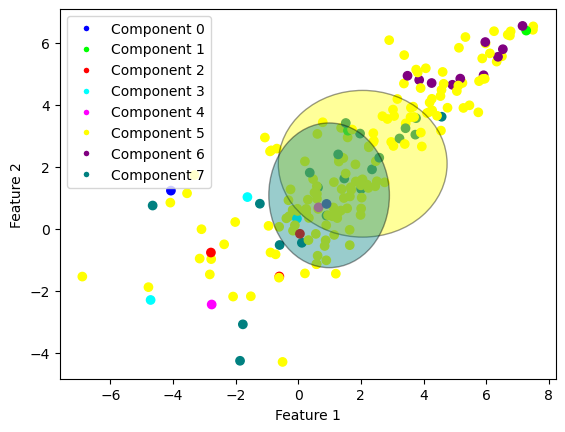

completed gibbs sampling in  6.8583619594573975
_______________________________
whale:  2  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  15.636363636363637 diff:  -4.363636363636363
avg:  15.166666666666666 diff:  -4.500000000000002
avg:  15.076923076923077 diff:  -3.9230769230769234
avg:  14.857142857142858 diff:  -4.142857142857142
avg:  14.466666666666667 diff:  -4.200000000000001
avg:  14.0625 diff:  -3.508928571428573
avg:  13.705882352941176 diff:  -3.4191176470588243
avg:  13.444444444444445 diff:  -3.222222222222223
avg:  13.105263157894736 diff:  -2.794736842105264
avg:  12.9 diff:  -2.7363636363636363
avg:  12.80952380952381 diff:  -2.357142857142856
avg:  12.590909090909092 diff:  -2.486013986013985
avg:  12.521739130434783 diff:  -2.3354037267080745
avg:  12.416666666666666 diff:  -2.0500000000000007
avg:  12.32 diff:  -1.7424999999999997
avg:  12.307692

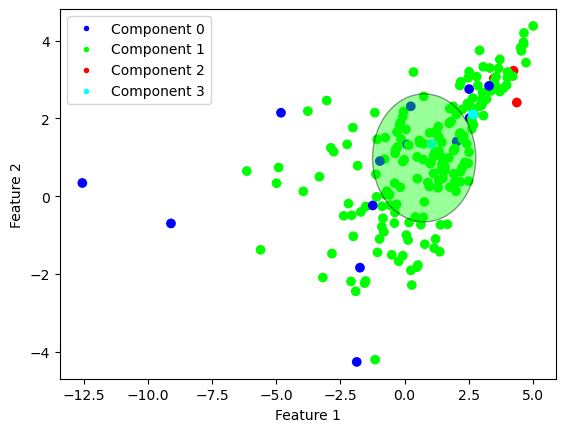

completed gibbs sampling in  7.144737005233765
completed, final component avg:  10.3
testing for whale type:  3
testing for model_type:  wl_hdphmm
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  6.454545454545454 diff:  1.9545454545454541
avg:  6.75 diff:  1.083333333333333
avg:  7.0 diff:  1.5
avg:  7.142857142857143 diff:  1.3428571428571434
avg:  7.133333333333334 diff:  1.9666666666666668
avg:  7.375 diff:  2.2321428571428568
avg:  7.470588235294118 diff:  2.5955882352941178
avg:  7.277777777777778 diff:  1.9444444444444446
avg:  7.052631578947368 diff:  1.4526315789473685
avg:  7.05 diff:  0.5954545454545457
avg:  7.0476190476190474 diff:  0.29761904761904745
avg:  7.318181818181818 diff:  0.31818181818181834
avg:  7.260869565217392 diff:  0.11801242236024834
avg:  7.333333333333333 diff:  0.1999999999999993
avg:  7.44 d

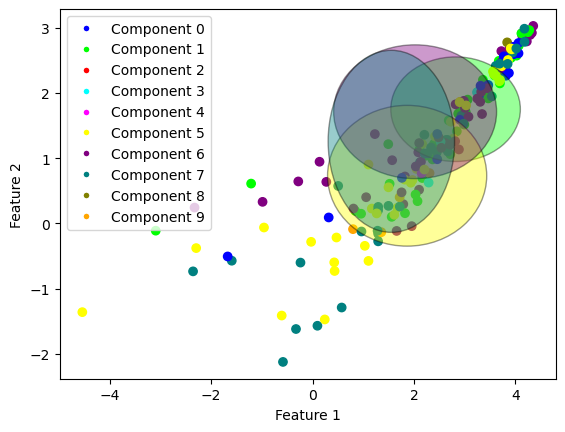

completed gibbs sampling in  5.132178068161011
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.0 diff:  -1.5
avg:  8.833333333333334 diff:  -2.166666666666666
avg:  8.384615384615385 diff:  -1.865384615384615
avg:  8.071428571428571 diff:  -2.128571428571428
avg:  8.133333333333333 diff:  -1.8666666666666671
avg:  8.0625 diff:  -1.7946428571428577
avg:  8.058823529411764 diff:  -1.5661764705882355
avg:  8.11111111111111 diff:  -0.7777777777777786
avg:  8.052631578947368 diff:  -1.2473684210526326
avg:  7.95 diff:  -1.0499999999999998
avg:  7.714285714285714 diff:  -1.1190476190476195
avg:  7.545454545454546 diff:  -0.8391608391608392
avg:  7.565217391304348 diff:  -0.5062111801242235
avg:  7.416666666666667 diff:  -0.7166666666666659
avg:  7.32 diff:  -0.7424999999999997
avg:  7.461538461538462 diff:  -0.5972850678733028
av

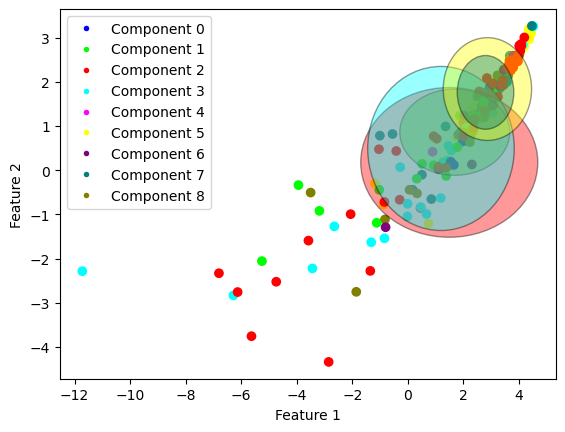

completed gibbs sampling in  5.118283987045288
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  8.818181818181818 diff:  3.3181818181818183
avg:  8.416666666666666 diff:  1.7499999999999991
avg:  8.461538461538462 diff:  0.4615384615384617
avg:  8.714285714285714 diff:  0.9142857142857137
avg:  8.733333333333333 diff:  0.8999999999999995
avg:  8.75 diff:  0.6071428571428577
avg:  8.647058823529411 diff:  0.022058823529411242
avg:  8.61111111111111 diff:  0.05555555555555536
avg:  8.947368421052632 diff:  -0.05263157894736814
avg:  8.85 diff:  0.0318181818181813
avg:  9.0 diff:  0.5833333333333339
avg:  9.136363636363637 diff:  0.674825174825175
avg:  8.91304347826087 diff:  0.19875776397515565
avg:  8.875 diff:  0.1416666666666675
avg:  8.8 diff:  0.05000000000000071
avg:  8.615384615384615 diff:  -0.03167420814479627
avg:  8.

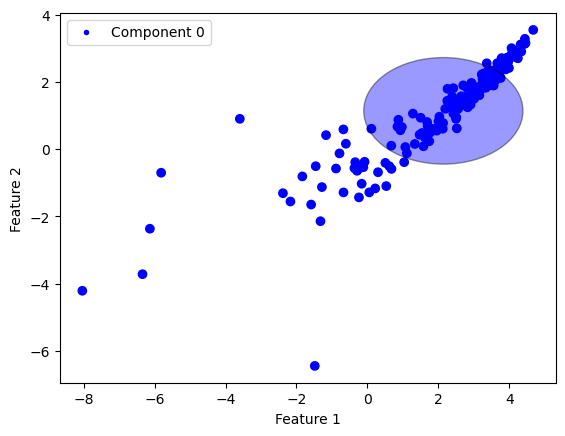

completed gibbs sampling in  5.414911985397339
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  7.636363636363637 diff:  0.6363636363636367
avg:  7.75 diff:  0.08333333333333304
avg:  7.923076923076923 diff:  0.6730769230769234
avg:  7.571428571428571 diff:  0.9714285714285715
avg:  7.733333333333333 diff:  0.5666666666666664
avg:  7.4375 diff:  0.29464285714285676
avg:  7.529411764705882 diff:  -0.34558823529411775
avg:  7.444444444444445 diff:  -0.33333333333333304
avg:  7.315789473684211 diff:  -0.5842105263157897
avg:  7.1 diff:  -0.536363636363637
avg:  7.333333333333333 diff:  -0.41666666666666696
avg:  7.2727272727272725 diff:  -0.6503496503496509
avg:  7.217391304347826 diff:  -0.354037267080745
avg:  7.416666666666667 diff:  -0.31666666666666643
avg:  7.48 diff:  0.042500000000000426
avg:  7.576923076923077 diff:  0.0

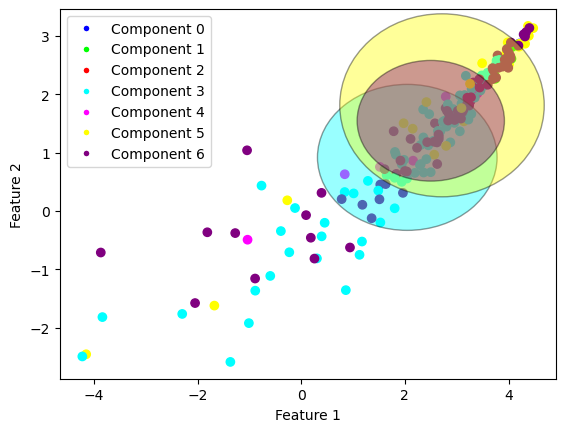

completed gibbs sampling in  5.341227054595947
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  6.636363636363637 diff:  -3.8636363636363633
avg:  6.5 diff:  -1.166666666666667
avg:  6.615384615384615 diff:  -1.134615384615385
avg:  7.0 diff:  -0.20000000000000018
avg:  7.133333333333334 diff:  0.13333333333333375
avg:  6.875 diff:  -0.4107142857142856
avg:  6.764705882352941 diff:  0.13970588235294112
avg:  6.833333333333333 diff:  0.5
avg:  7.0 diff:  0.5
avg:  6.8 diff:  0.16363636363636314
avg:  6.619047619047619 diff:  0.11904761904761862
avg:  6.409090909090909 diff:  -0.2062937062937058
avg:  6.260869565217392 diff:  -0.7391304347826084
avg:  6.333333333333333 diff:  -0.8000000000000007
avg:  6.56 diff:  -0.3150000000000004
avg:  6.6923076923076925 diff:  -0.07239819004524861
avg:  6.851851851851852 diff:  0.01851851851

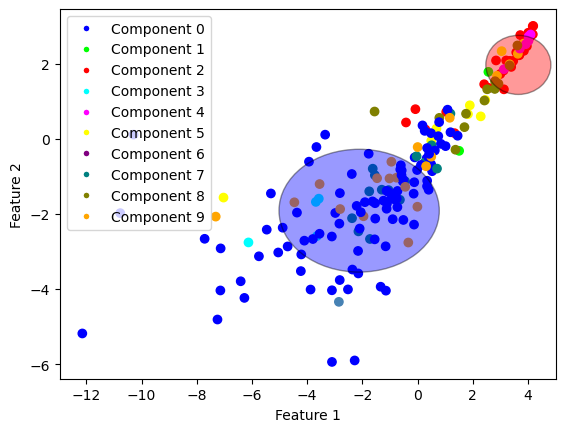

completed gibbs sampling in  5.0720720291137695
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  6.818181818181818 diff:  2.3181818181818183
avg:  7.083333333333333 diff:  1.416666666666666
avg:  6.846153846153846 diff:  0.3461538461538458
avg:  6.928571428571429 diff:  -0.47142857142857153
avg:  7.133333333333334 diff:  0.3000000000000007
avg:  7.0 diff:  0.5714285714285712
avg:  6.823529411764706 diff:  0.19852941176470562
avg:  6.555555555555555 diff:  0.33333333333333304
avg:  6.631578947368421 diff:  -0.2684210526315791
avg:  6.4 diff:  -0.418181818181818
avg:  6.428571428571429 diff:  -0.6547619047619042
avg:  6.454545454545454 diff:  -0.39160839160839167
avg:  6.478260869565218 diff:  -0.4503105590062111
avg:  6.25 diff:  -0.8833333333333337
avg:  6.56 diff:  -0.4400000000000004
avg:  6.730769230769231 diff:  -0.0927601

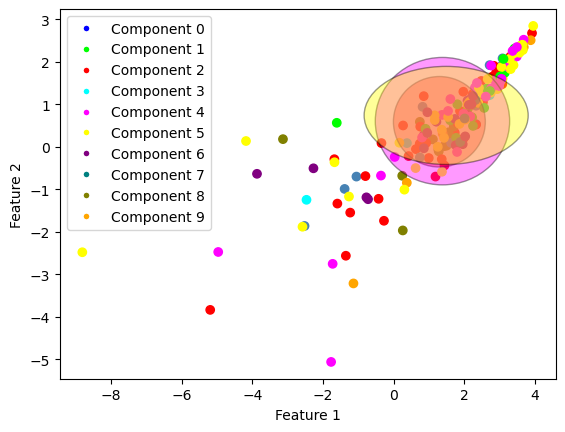

completed gibbs sampling in  4.744472026824951
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  6.545454545454546 diff:  0.04545454545454586
avg:  6.75 diff:  0.41666666666666696
avg:  7.076923076923077 diff:  0.32692307692307665
avg:  6.857142857142857 diff:  -0.7428571428571429
avg:  6.666666666666667 diff:  -1.666666666666667
avg:  6.6875 diff:  -1.0267857142857144
avg:  6.588235294117647 diff:  -1.1617647058823533
avg:  6.944444444444445 diff:  -0.3888888888888884
avg:  7.2105263157894735 diff:  0.3105263157894731
avg:  7.45 diff:  0.9045454545454543
avg:  7.571428571428571 diff:  0.8214285714285712
avg:  7.409090909090909 diff:  0.3321678321678325
avg:  7.3478260869565215 diff:  0.49068322981366475
avg:  7.375 diff:  0.708333333333333
avg:  7.48 diff:  0.7925000000000004
avg:  7.269230769230769 diff:  0.6809954751131224
a

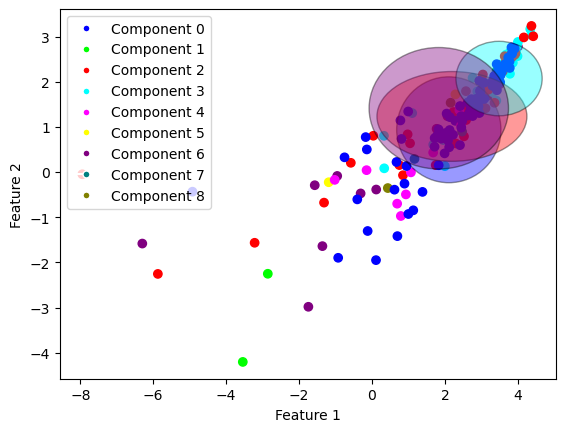

completed gibbs sampling in  4.981029033660889
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  6.909090909090909 diff:  -2.590909090909091
avg:  6.75 diff:  -0.583333333333333
avg:  6.615384615384615 diff:  0.11538461538461497
avg:  6.5 diff:  0.5
avg:  6.6 diff:  0.5999999999999996
avg:  6.6875 diff:  0.2589285714285712
avg:  6.823529411764706 diff:  -0.05147058823529438
avg:  6.888888888888889 diff:  0.44444444444444464
avg:  7.157894736842105 diff:  0.1578947368421053
avg:  7.0 diff:  0.09090909090909083
avg:  7.0 diff:  0.25
avg:  7.090909090909091 diff:  0.47552447552447585
avg:  6.913043478260869 diff:  0.4130434782608692
avg:  6.958333333333333 diff:  0.3583333333333334
avg:  7.08 diff:  0.39250000000000007
avg:  7.1923076923076925 diff:  0.3687782805429869
avg:  7.296296296296297 diff:  0.40740740740740744
avg:  7.214

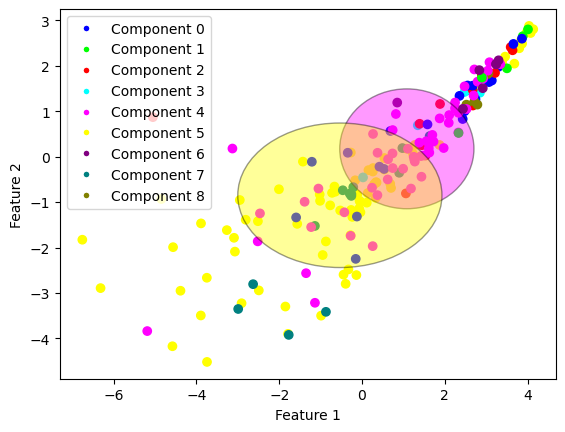

completed gibbs sampling in  5.026137113571167
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  7.090909090909091 diff:  -2.909090909090909
avg:  7.5 diff:  -1.5
avg:  7.3076923076923075 diff:  -0.1923076923076925
avg:  7.5 diff:  -0.5
avg:  7.466666666666667 diff:  -0.5333333333333332
avg:  7.625 diff:  -0.375
avg:  7.764705882352941 diff:  0.5147058823529411
avg:  7.833333333333333 diff:  1.0555555555555554
avg:  7.578947368421052 diff:  0.2789473684210524
avg:  7.35 diff:  0.2590909090909088
avg:  7.238095238095238 diff:  -0.26190476190476186
avg:  7.318181818181818 diff:  0.010489510489510856
avg:  7.304347826086956 diff:  -0.1956521739130439
avg:  7.458333333333333 diff:  -0.008333333333333748
avg:  7.44 diff:  -0.1849999999999996
avg:  7.384615384615385 diff:  -0.3800904977375561
avg:  7.2592592592592595 diff:  -0.574074

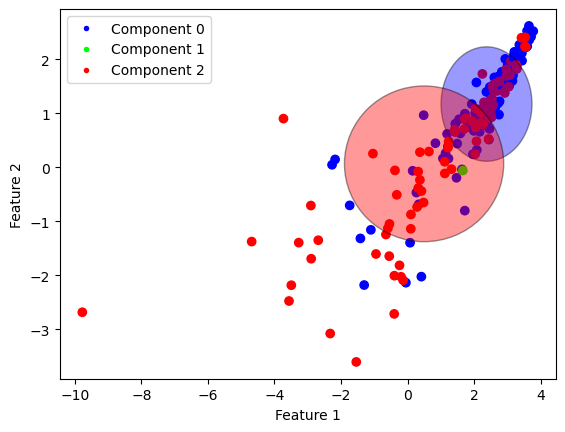

completed gibbs sampling in  5.08293890953064
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  4.2727272727272725 diff:  0.2727272727272725
avg:  4.583333333333333 diff:  0.9166666666666665
avg:  4.769230769230769 diff:  1.0192307692307692
avg:  5.0 diff:  1.2000000000000002
avg:  5.333333333333333 diff:  1.4999999999999996
avg:  5.3125 diff:  1.5982142857142856
avg:  5.588235294117647 diff:  1.9632352941176467
avg:  5.722222222222222 diff:  1.8333333333333335
avg:  5.7368421052631575 diff:  1.6368421052631579
avg:  5.75 diff:  1.4772727272727275
avg:  5.571428571428571 diff:  0.9880952380952381
avg:  5.681818181818182 diff:  0.9125874125874125
avg:  5.782608695652174 diff:  0.7826086956521738
avg:  5.916666666666667 diff:  0.5833333333333339
avg:  6.08 diff:  0.7675000000000001
avg:  6.0 diff:  0.41176470588235325
avg:  5.925

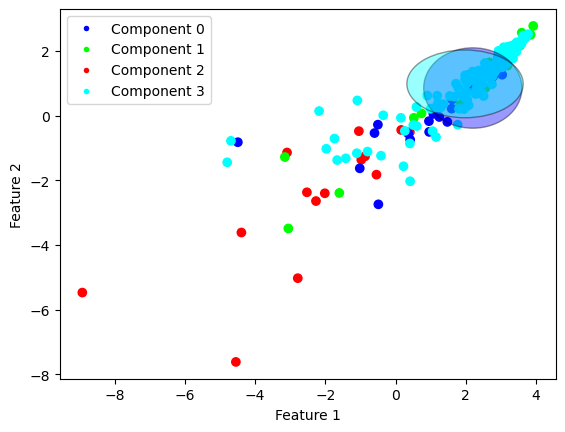

completed gibbs sampling in  4.222539663314819
completed, final component avg:  6.7
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.181818181818182 diff:  2.1818181818181817
avg:  10.666666666666666 diff:  3.333333333333333
avg:  10.384615384615385 diff:  2.384615384615385
avg:  10.142857142857142 diff:  2.1428571428571423
avg:  9.533333333333333 diff:  2.2
avg:  9.75 diff:  1.1785714285714288
avg:  9.823529411764707 diff:  1.0735294117647065
avg:  10.166666666666666 diff:  0.2777777777777768
avg:  10.368421052631579 diff:  0.16842105263157947
avg:  10.2 diff:  0.018181818181817633
avg:  10.285714285714286 diff:  -0.3809523809523796
avg:  10.272727272727273 diff:  -0.11188811188811165
avg:  10.391304347826088 diff:  0.24844720496894546
avg:  10.083333333333334 diff:  0.5500000000000007
avg:  10.16 diff:  0.4100000000000001

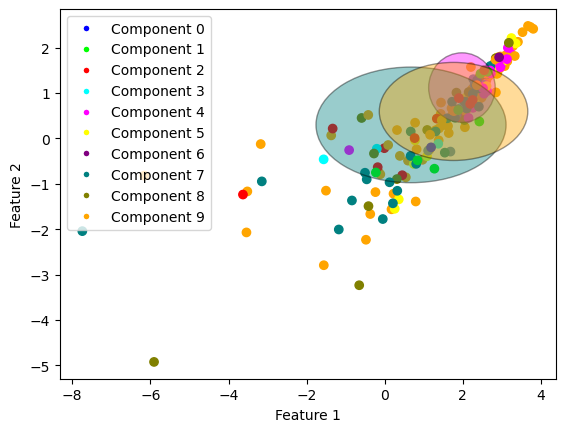

completed gibbs sampling in  6.772201776504517
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  8.454545454545455 diff:  0.954545454545455
avg:  8.75 diff:  2.083333333333333
avg:  9.0 diff:  0.75
avg:  9.285714285714286 diff:  1.8857142857142861
avg:  9.4 diff:  1.5666666666666673
avg:  9.875 diff:  2.5892857142857144
avg:  10.176470588235293 diff:  2.6764705882352935
avg:  9.833333333333334 diff:  2.500000000000001
avg:  10.0 diff:  2.5
avg:  9.75 diff:  1.295454545454545
avg:  9.523809523809524 diff:  0.7738095238095237
avg:  9.727272727272727 diff:  0.7272727272727266
avg:  9.521739130434783 diff:  0.23602484472049667
avg:  9.333333333333334 diff:  -0.06666666666666643
avg:  9.28 diff:  -0.5950000000000006
avg:  9.346153846153847 diff:  -0.8303167420814468
avg:  9.222222222222221 diff:  -0.6111111111111125
avg:  9.5 diff: 

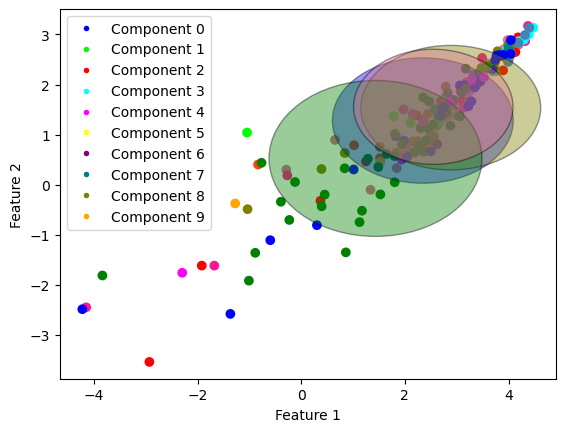

completed gibbs sampling in  6.60587477684021
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  7.909090909090909 diff:  3.409090909090909
avg:  7.75 diff:  2.75
avg:  7.769230769230769 diff:  1.7692307692307692
avg:  7.571428571428571 diff:  0.9714285714285715
avg:  8.0 diff:  1.333333333333333
avg:  8.5 diff:  1.9285714285714288
avg:  8.352941176470589 diff:  1.1029411764705888
avg:  8.166666666666666 diff:  0.4999999999999991
avg:  8.052631578947368 diff:  0.2526315789473683
avg:  8.2 diff:  0.2909090909090901
avg:  8.19047619047619 diff:  0.4404761904761898
avg:  8.227272727272727 diff:  0.45804195804195746
avg:  8.130434782608695 diff:  0.5590062111801242
avg:  8.25 diff:  0.25
avg:  8.04 diff:  -0.46000000000000085
avg:  7.846153846153846 diff:  -0.506787330316743
avg:  8.0 diff:  -0.16666666666666607
avg:  8.035714285714

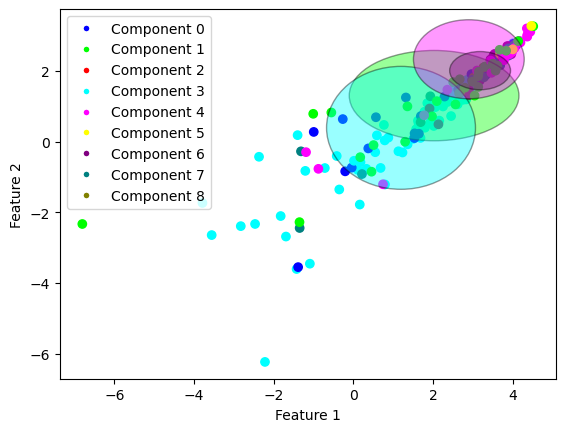

completed gibbs sampling in  6.386135101318359
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.454545454545455 diff:  2.954545454545455
avg:  10.833333333333334 diff:  2.833333333333334
avg:  10.384615384615385 diff:  1.384615384615385
avg:  9.785714285714286 diff:  -0.014285714285714235
avg:  9.266666666666667 diff:  -0.06666666666666643
avg:  9.3125 diff:  -0.4017857142857135
avg:  9.588235294117647 diff:  0.08823529411764675
avg:  9.166666666666666 diff:  -0.6111111111111125
avg:  9.368421052631579 diff:  -0.8315789473684205
avg:  9.65 diff:  -0.8045454545454547
avg:  9.333333333333334 diff:  -1.5
avg:  9.045454545454545 diff:  -1.33916083916084
avg:  8.782608695652174 diff:  -1.0031055900621126
avg:  8.625 diff:  -0.6416666666666675
avg:  8.8 diff:  -0.5124999999999993
avg:  9.0 diff:  -0.5882352941176467
avg:  8.77777

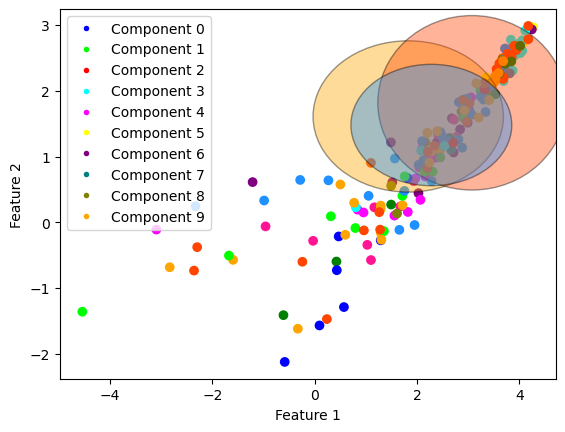

completed gibbs sampling in  6.630701780319214
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.454545454545455 diff:  -2.045454545454545
avg:  10.166666666666666 diff:  -0.16666666666666785
avg:  10.461538461538462 diff:  -1.2884615384615383
avg:  10.428571428571429 diff:  -0.17142857142857082
avg:  10.0 diff:  -0.8333333333333339
avg:  9.625 diff:  -1.6607142857142865
avg:  9.529411764705882 diff:  -1.5955882352941178
avg:  9.555555555555555 diff:  -1.0
avg:  9.578947368421053 diff:  -0.4210526315789469
avg:  9.75 diff:  0.29545454545454497
avg:  9.571428571428571 diff:  -0.5952380952380949
avg:  9.363636363636363 diff:  -1.0979020979020984
avg:  9.130434782608695 diff:  -1.2981366459627335
avg:  9.0 diff:  -1.0
avg:  8.92 diff:  -0.7050000000000001
avg:  9.0 diff:  -0.5294117647058822
avg:  8.851851851851851 diff:  -0.703

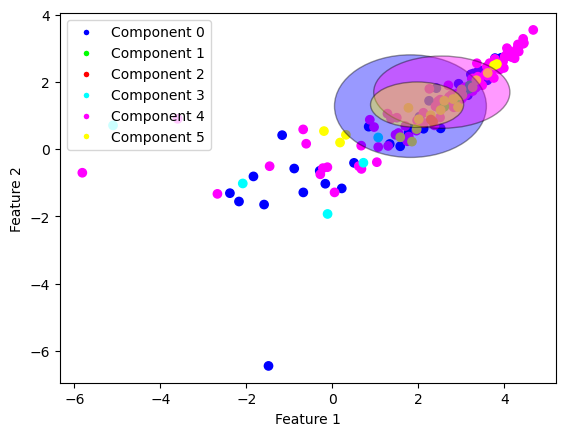

completed gibbs sampling in  6.458569288253784
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  6.0 diff:  -0.5
avg:  6.0 diff:  0.0
avg:  6.538461538461538 diff:  0.7884615384615383
avg:  6.285714285714286 diff:  0.2857142857142856
avg:  6.466666666666667 diff:  -0.033333333333333215
avg:  6.5625 diff:  0.13392857142857117
avg:  6.823529411764706 diff:  -0.4264705882352944
avg:  6.722222222222222 diff:  -0.05555555555555536
avg:  7.0 diff:  0.5999999999999996
avg:  6.8 diff:  0.7999999999999998
avg:  6.9523809523809526 diff:  0.9523809523809526
avg:  7.318181818181818 diff:  0.77972027972028
avg:  7.130434782608695 diff:  0.8447204968944098
avg:  7.666666666666667 diff:  1.2000000000000002
avg:  7.8 diff:  1.2374999999999998
avg:  8.076923076923077 diff:  1.253393665158371
avg:  8.333333333333334 diff:  1.6111111111111116
avg

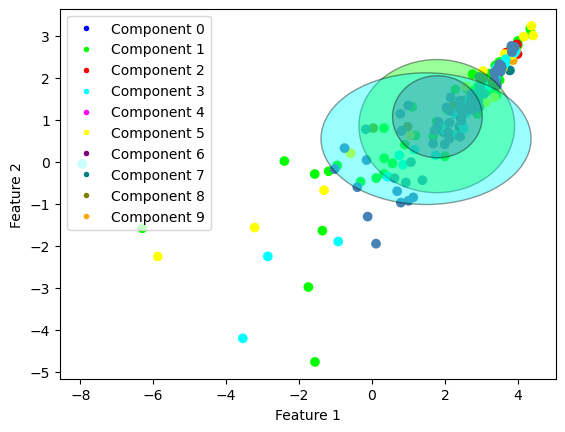

completed gibbs sampling in  6.445477724075317
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  6.181818181818182 diff:  -0.8181818181818183
avg:  6.25 diff:  -0.41666666666666696
avg:  6.0 diff:  -1.0
avg:  6.642857142857143 diff:  -0.15714285714285658
avg:  7.133333333333334 diff:  0.9666666666666668
avg:  6.9375 diff:  1.0803571428571432
avg:  6.705882352941177 diff:  0.7058823529411766
avg:  6.666666666666667 diff:  0.5555555555555562
avg:  7.105263157894737 diff:  1.1052631578947372
avg:  7.0 diff:  0.8181818181818183
avg:  6.809523809523809 diff:  0.5595238095238093
avg:  6.636363636363637 diff:  0.6363636363636367
avg:  6.956521739130435 diff:  0.31366459627329135
avg:  7.333333333333333 diff:  0.1999999999999993
avg:  7.28 diff:  0.34250000000000025
avg:  7.153846153846154 diff:  0.44796380090497756
avg:  7.0 diff:  0.

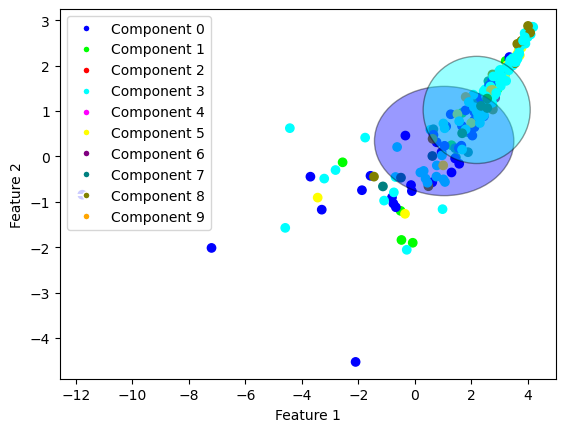

completed gibbs sampling in  5.924633026123047
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  8.909090909090908 diff:  1.4090909090909083
avg:  8.75 diff:  1.416666666666667
avg:  8.384615384615385 diff:  1.634615384615385
avg:  8.285714285714286 diff:  1.4857142857142867
avg:  8.2 diff:  0.36666666666666625
avg:  8.625 diff:  0.19642857142857117
avg:  8.588235294117647 diff:  -0.7867647058823533
avg:  8.38888888888889 diff:  -0.7222222222222214
avg:  8.526315789473685 diff:  -0.3736842105263154
avg:  8.65 diff:  -0.25909090909090793
avg:  8.714285714285714 diff:  -0.035714285714286476
avg:  8.681818181818182 diff:  0.29720279720279663
avg:  8.826086956521738 diff:  0.5403726708074519
avg:  8.958333333333334 diff:  0.7583333333333346
avg:  8.88 diff:  0.2550000000000008
avg:  8.961538461538462 diff:  0.37330316742081493
avg:

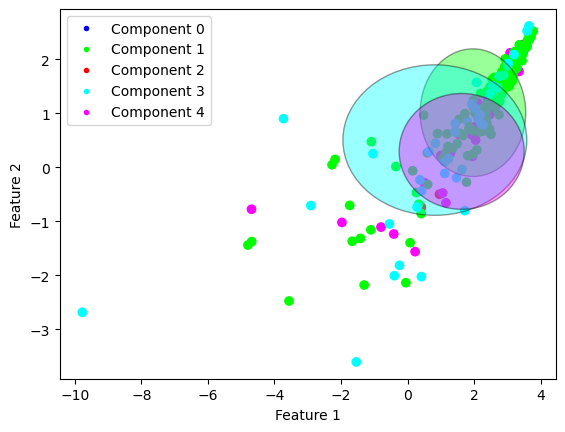

completed gibbs sampling in  6.122997045516968
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  8.0 diff:  1.0
avg:  7.916666666666667 diff:  -0.08333333333333304
avg:  7.846153846153846 diff:  -0.9038461538461542
avg:  8.0 diff:  -0.1999999999999993
avg:  8.2 diff:  0.1999999999999993
avg:  8.125 diff:  0.26785714285714324
avg:  8.235294117647058 diff:  -0.764705882352942
avg:  8.277777777777779 diff:  -0.2777777777777768
avg:  8.368421052631579 diff:  0.16842105263157947
avg:  8.1 diff:  0.09999999999999964
avg:  8.238095238095237 diff:  0.3214285714285703
avg:  8.5 diff:  0.6538461538461542
avg:  8.26086956521739 diff:  0.2608695652173907
avg:  8.208333333333334 diff:  0.008333333333334636
avg:  8.48 diff:  0.3550000000000004
avg:  8.384615384615385 diff:  0.14932126696832704
avg:  8.25925925925926 diff:  -0.018518518518519

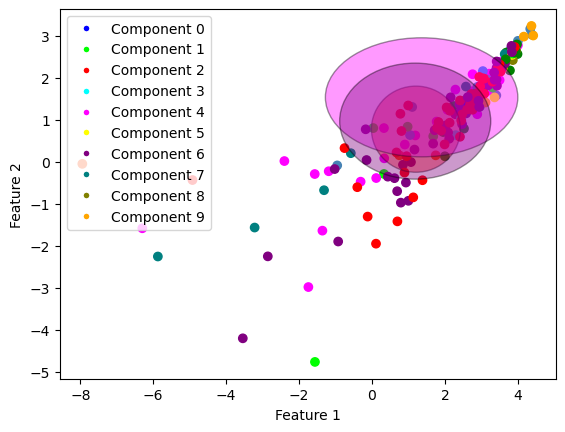

completed gibbs sampling in  6.480646133422852
_______________________________
whale:  3  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  8.545454545454545 diff:  -0.954545454545455
avg:  8.166666666666666 diff:  -0.8333333333333339
avg:  8.0 diff:  0.0
avg:  7.785714285714286 diff:  -0.6142857142857148
avg:  7.933333333333334 diff:  -0.40000000000000036
avg:  7.9375 diff:  -0.4910714285714288
avg:  7.764705882352941 diff:  -1.2352941176470589
avg:  8.0 diff:  -0.5555555555555554
avg:  7.842105263157895 diff:  -1.0578947368421057
avg:  8.0 diff:  -0.545454545454545
avg:  7.9523809523809526 diff:  -0.21428571428571352
avg:  8.090909090909092 diff:  0.09090909090909172
avg:  8.08695652173913 diff:  0.30124223602484523
avg:  8.166666666666666 diff:  0.2333333333333325
avg:  8.08 diff:  0.14250000000000007
avg:  7.846153846153846 diff:  0.08144796380090469
avg:  7.7777777

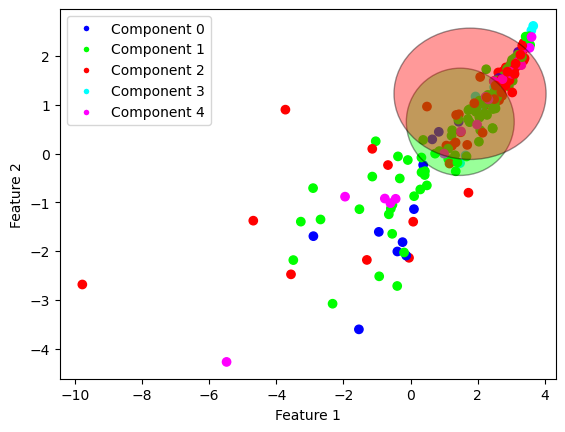

completed gibbs sampling in  6.184689044952393
completed, final component avg:  8.8
testing for whale type:  4
testing for model_type:  wl_hdphmm
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.090909090909092 diff:  -0.9090909090909083
avg:  10.916666666666666 diff:  -0.41666666666666785
avg:  10.538461538461538 diff:  -1.4615384615384617
avg:  10.785714285714286 diff:  -0.014285714285714235
avg:  10.6 diff:  -0.40000000000000036
avg:  10.375 diff:  -1.0535714285714288
avg:  10.294117647058824 diff:  -0.9558823529411757
avg:  9.88888888888889 diff:  -1.0
avg:  9.947368421052632 diff:  -1.5526315789473681
avg:  10.0 diff:  -1.0909090909090917
avg:  10.285714285714286 diff:  -0.6309523809523796
avg:  10.363636363636363 diff:  -0.174825174825175
avg:  10.391304347826088 diff:  -0.39440993788819867
avg:  10.541666666666666 di

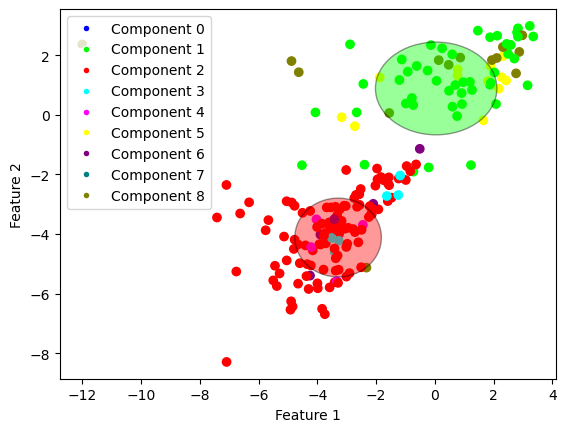

completed gibbs sampling in  6.113224983215332
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.090909090909092 diff:  0.5909090909090917
avg:  10.833333333333334 diff:  0.5
avg:  11.23076923076923 diff:  0.48076923076922995
avg:  11.357142857142858 diff:  -0.242857142857142
avg:  11.0 diff:  -1.166666666666666
avg:  10.8125 diff:  -1.4732142857142865
avg:  10.764705882352942 diff:  -1.485294117647058
avg:  10.5 diff:  -1.2777777777777786
avg:  10.421052631578947 diff:  -1.2789473684210524
avg:  10.25 diff:  -0.8409090909090917
avg:  10.238095238095237 diff:  -0.5952380952380967
avg:  9.954545454545455 diff:  -1.276223776223775
avg:  10.130434782608695 diff:  -1.2267080745341623
avg:  10.125 diff:  -0.875
avg:  10.12 diff:  -0.6925000000000008
avg:  10.115384615384615 diff:  -0.649321266968327
avg:  10.185185185185185 diff:

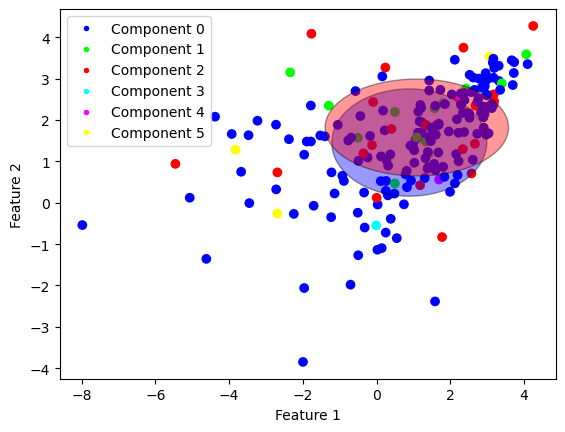

completed gibbs sampling in  6.437187671661377
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.363636363636363 diff:  -4.636363636363637
avg:  8.916666666666666 diff:  -3.416666666666668
avg:  9.0 diff:  -2.25
avg:  9.357142857142858 diff:  -2.0428571428571427
avg:  9.533333333333333 diff:  -0.9666666666666668
avg:  9.875 diff:  -0.6964285714285712
avg:  9.941176470588236 diff:  -0.0588235294117645
avg:  9.722222222222221 diff:  -0.16666666666666785
avg:  9.842105263157896 diff:  0.04210526315789487
avg:  9.95 diff:  0.586363636363636
avg:  9.904761904761905 diff:  0.988095238095239
avg:  9.909090909090908 diff:  0.9090909090909083
avg:  10.08695652173913 diff:  0.7298136645962732
avg:  10.083333333333334 diff:  0.5500000000000007
avg:  9.88 diff:  0.005000000000000782
avg:  9.846153846153847 diff:  -0.0950226244343888
avg:

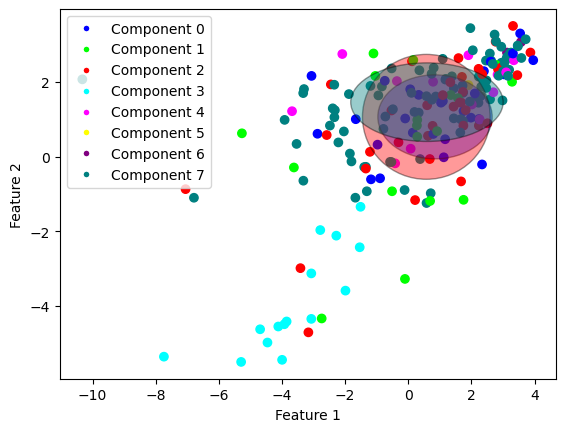

completed gibbs sampling in  6.031310796737671
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.363636363636363 diff:  0.3636363636363633
avg:  11.833333333333334 diff:  -0.8333333333333321
avg:  11.846153846153847 diff:  -1.6538461538461533
avg:  11.857142857142858 diff:  -1.5428571428571427
avg:  11.866666666666667 diff:  -1.1333333333333329
avg:  11.8125 diff:  -1.3303571428571423
avg:  11.411764705882353 diff:  -1.7132352941176467
avg:  11.444444444444445 diff:  -0.7777777777777768
avg:  11.0 diff:  -1.4000000000000004
avg:  10.8 diff:  -1.5636363636363626
avg:  10.904761904761905 diff:  -0.9285714285714288
avg:  11.045454545454545 diff:  -0.8006993006993017
avg:  11.08695652173913 diff:  -0.7701863354037268
avg:  11.041666666666666 diff:  -0.8250000000000011
avg:  11.08 diff:  -0.7324999999999999
avg:  11.1538461538461

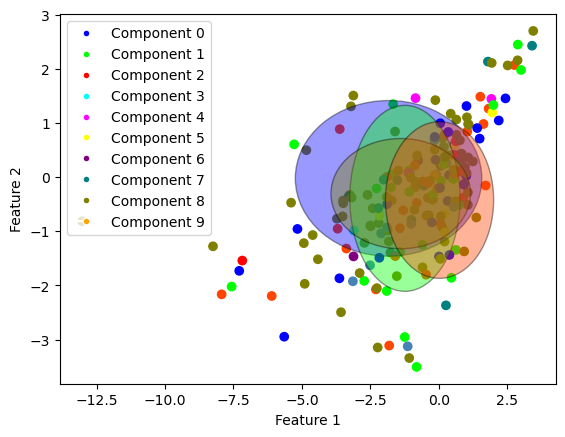

completed gibbs sampling in  6.23308801651001
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.545454545454545 diff:  2.545454545454545
avg:  10.5 diff:  1.166666666666666
avg:  10.538461538461538 diff:  1.0384615384615383
avg:  10.5 diff:  0.6999999999999993
avg:  10.4 diff:  0.06666666666666643
avg:  10.125 diff:  -0.01785714285714235
avg:  10.117647058823529 diff:  -0.257352941176471
avg:  10.222222222222221 diff:  -0.2222222222222232
avg:  10.0 diff:  -0.5
avg:  9.9 diff:  -0.6454545454545446
avg:  9.857142857142858 diff:  -0.6428571428571423
avg:  9.818181818181818 diff:  -0.72027972027972
avg:  9.782608695652174 diff:  -0.7173913043478262
avg:  9.625 diff:  -0.7750000000000004
avg:  9.64 diff:  -0.48499999999999943
avg:  9.653846153846153 diff:  -0.4638009049773757
avg:  9.481481481481481 diff:  -0.7407407407407405
av

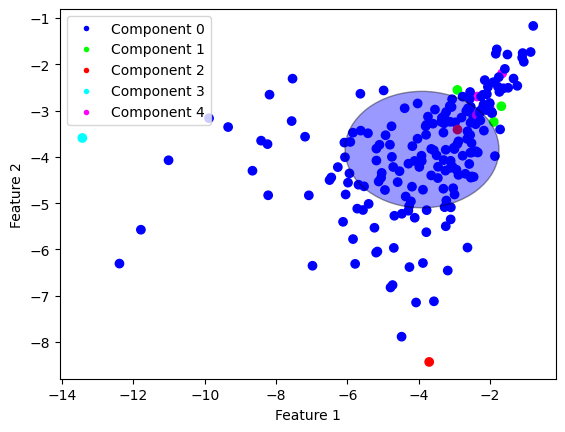

completed gibbs sampling in  5.528501987457275
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.0 diff:  -0.5
avg:  11.083333333333334 diff:  1.4166666666666679
avg:  10.76923076923077 diff:  1.01923076923077
avg:  10.5 diff:  0.9000000000000004
avg:  10.4 diff:  0.9000000000000004
avg:  10.3125 diff:  0.5982142857142865
avg:  10.235294117647058 diff:  0.11029411764705799
avg:  10.0 diff:  -0.44444444444444464
avg:  9.947368421052632 diff:  -1.0526315789473681
avg:  9.85 diff:  -1.1500000000000004
avg:  9.666666666666666 diff:  -1.4166666666666679
avg:  9.590909090909092 diff:  -1.1783216783216783
avg:  9.782608695652174 diff:  -0.7173913043478262
avg:  9.708333333333334 diff:  -0.6916666666666664
avg:  9.68 diff:  -0.6325000000000003
avg:  9.576923076923077 diff:  -0.6583710407239813
avg:  9.555555555555555 diff:  -0.44444

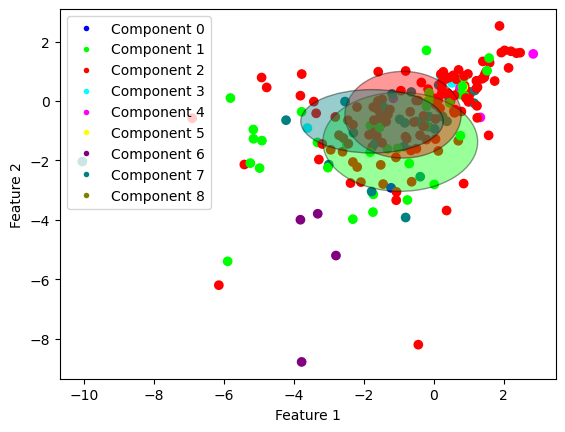

completed gibbs sampling in  5.9463560581207275
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.636363636363637 diff:  -1.8636363636363633
avg:  11.5 diff:  -0.16666666666666607
avg:  11.23076923076923 diff:  0.48076923076922995
avg:  11.357142857142858 diff:  -0.042857142857142705
avg:  11.133333333333333 diff:  -0.033333333333333215
avg:  10.875 diff:  -0.4107142857142865
avg:  10.941176470588236 diff:  -0.3088235294117645
avg:  10.944444444444445 diff:  -0.7222222222222214
avg:  10.68421052631579 diff:  -1.215789473684211
avg:  10.5 diff:  -1.1363636363636367
avg:  10.285714285714286 diff:  -1.2142857142857135
avg:  10.272727272727273 diff:  -0.9580419580419566
avg:  10.08695652173913 diff:  -1.2701863354037268
avg:  10.25 diff:  -0.8833333333333329
avg:  10.24 diff:  -0.6349999999999998
avg:  10.192307692307692 diff:  

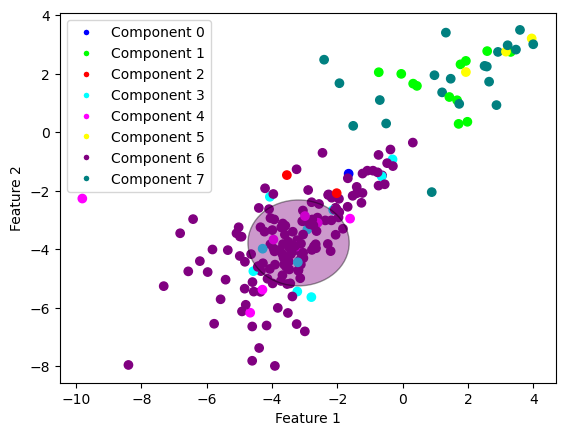

completed gibbs sampling in  6.023026943206787
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.272727272727273 diff:  -1.2272727272727266
avg:  11.083333333333334 diff:  0.08333333333333393
avg:  11.0 diff:  -1.75
avg:  11.071428571428571 diff:  -0.5285714285714285
avg:  11.066666666666666 diff:  -0.5999999999999996
avg:  10.8125 diff:  -1.0446428571428577
avg:  10.647058823529411 diff:  -0.9779411764705888
avg:  10.444444444444445 diff:  -1.1111111111111107
avg:  10.368421052631579 diff:  -0.931578947368422
avg:  10.3 diff:  -0.9727272727272727
avg:  10.285714285714286 diff:  -0.7976190476190474
avg:  10.227272727272727 diff:  -0.7727272727272734
avg:  10.0 diff:  -1.0714285714285712
avg:  9.833333333333334 diff:  -1.2333333333333325
avg:  9.88 diff:  -0.9324999999999992
avg:  9.807692307692308 diff:  -0.8393665158371029


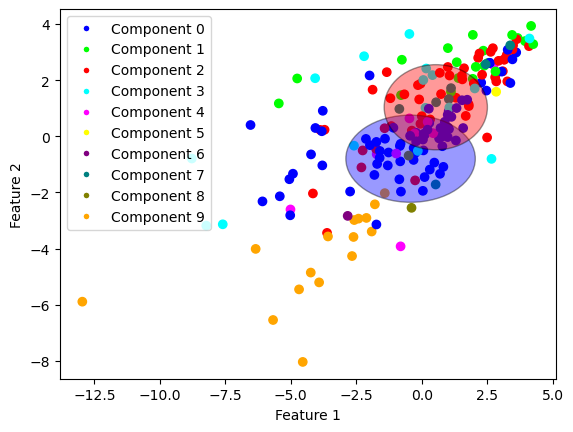

completed gibbs sampling in  6.0450451374053955
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.909090909090908 diff:  -3.0909090909090917
avg:  11.583333333333334 diff:  -3.75
avg:  11.153846153846153 diff:  -3.5961538461538467
avg:  10.714285714285714 diff:  -3.085714285714287
avg:  10.666666666666666 diff:  -3.166666666666668
avg:  10.4375 diff:  -3.4196428571428577
avg:  10.176470588235293 diff:  -2.6985294117647065
avg:  10.166666666666666 diff:  -2.3888888888888893
avg:  10.157894736842104 diff:  -1.8421052631578956
avg:  10.05 diff:  -1.8590909090909076
avg:  10.095238095238095 diff:  -1.488095238095239
avg:  9.818181818181818 diff:  -1.335664335664335
avg:  9.91304347826087 diff:  -0.8012422360248443
avg:  9.666666666666666 diff:  -1.0
avg:  9.4 diff:  -1.0374999999999996
avg:  9.23076923076923 diff:  -0.9457013574

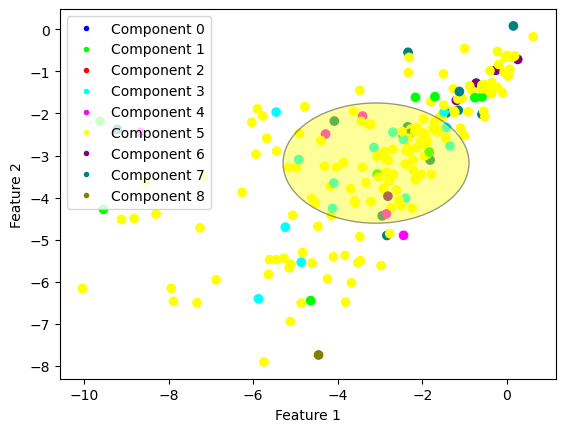

completed gibbs sampling in  6.051268815994263
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.636363636363637 diff:  -2.8636363636363633
avg:  11.666666666666666 diff:  -1.333333333333334
avg:  11.76923076923077 diff:  -1.23076923076923
avg:  11.857142857142858 diff:  -1.3428571428571416
avg:  11.733333333333333 diff:  -1.4333333333333336
avg:  11.6875 diff:  -1.1696428571428577
avg:  11.470588235294118 diff:  -0.5294117647058822
avg:  11.38888888888889 diff:  -0.6111111111111107
avg:  11.368421052631579 diff:  -0.33157894736842053
avg:  11.35 diff:  -0.28636363636363704
avg:  11.047619047619047 diff:  -0.6190476190476186
avg:  11.045454545454545 diff:  -0.7237762237762251
avg:  11.043478260869565 diff:  -0.8136645962732931
avg:  11.0 diff:  -0.7333333333333325
avg:  10.88 diff:  -0.8074999999999992
avg:  10.8461538461538

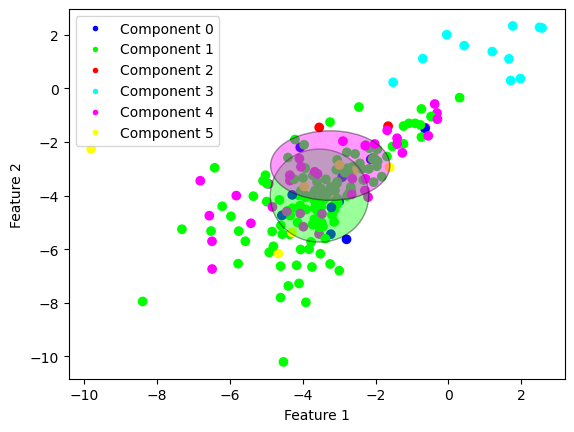

completed gibbs sampling in  6.194778919219971
completed, final component avg:  8.9
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  13.636363636363637 diff:  0.6363636363636367
avg:  13.0 diff:  -1.0
avg:  12.384615384615385 diff:  -1.615384615384615
avg:  12.5 diff:  -1.3000000000000007
avg:  12.666666666666666 diff:  -1.6666666666666679
avg:  12.4375 diff:  -2.4196428571428577
avg:  12.176470588235293 diff:  -2.5735294117647065
avg:  11.777777777777779 diff:  -2.8888888888888875
avg:  11.421052631578947 diff:  -2.9789473684210535
avg:  11.2 diff:  -2.4363636363636374
avg:  10.904761904761905 diff:  -2.095238095238095
avg:  10.863636363636363 diff:  -1.5209790209790217
avg:  11.130434782608695 diff:  -1.3695652173913047
avg:  10.916666666666666 diff:  -1.75
avg:  10.68 diff:  -1.7575000000000003
avg:  10.76923076923077 diff:

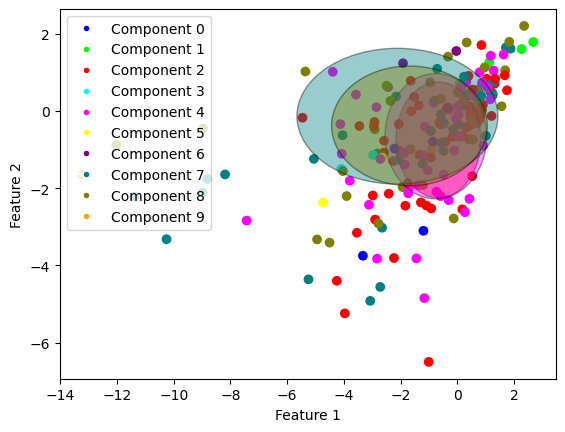

completed gibbs sampling in  7.230617046356201
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.909090909090908 diff:  -6.590909090909092
avg:  10.416666666666666 diff:  -4.583333333333334
avg:  11.076923076923077 diff:  -3.4230769230769234
avg:  11.571428571428571 diff:  -2.428571428571429
avg:  11.2 diff:  -1.8000000000000007
avg:  11.125 diff:  -1.0178571428571423
avg:  10.941176470588236 diff:  -0.6838235294117645
avg:  10.833333333333334 diff:  -0.6111111111111107
avg:  10.894736842105264 diff:  -0.30526315789473557
avg:  11.1 diff:  0.19090909090909136
avg:  11.285714285714286 diff:  0.8690476190476204
avg:  11.318181818181818 diff:  0.2412587412587417
avg:  11.304347826086957 diff:  -0.2670807453416142
avg:  11.416666666666666 diff:  0.21666666666666679
avg:  11.6 diff:  0.47499999999999964
avg:  11.5 diff:  0.558823

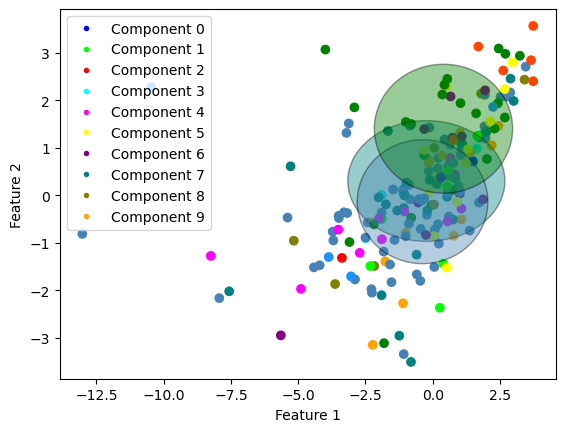

completed gibbs sampling in  7.732698202133179
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.272727272727273 diff:  -0.7272727272727266
avg:  10.416666666666666 diff:  -1.9166666666666679
avg:  10.692307692307692 diff:  -0.3076923076923084
avg:  10.928571428571429 diff:  -1.0714285714285712
avg:  11.066666666666666 diff:  -0.43333333333333357
avg:  11.3125 diff:  0.3125
avg:  11.352941176470589 diff:  0.6029411764705888
avg:  11.333333333333334 diff:  0.7777777777777786
avg:  11.68421052631579 diff:  1.48421052631579
avg:  11.65 diff:  1.377272727272727
avg:  11.333333333333334 diff:  0.9166666666666679
avg:  11.090909090909092 diff:  0.3986013986014001
avg:  10.869565217391305 diff:  -0.05900621118012417
avg:  10.583333333333334 diff:  -0.4833333333333325
avg:  10.68 diff:  -0.6325000000000003
avg:  10.884615384615385 d

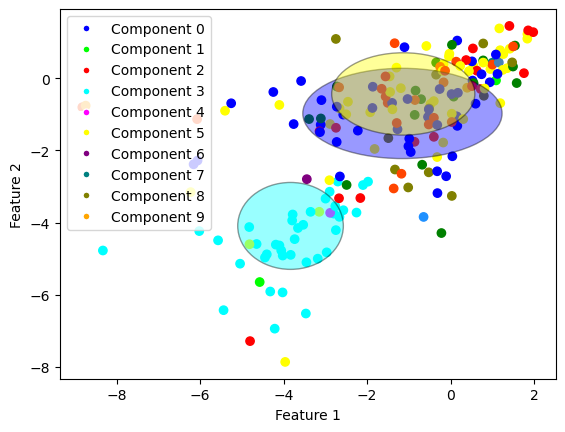

completed gibbs sampling in  7.349744081497192
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  15.0 diff:  -1.0
avg:  14.583333333333334 diff:  -4.083333333333334
avg:  14.307692307692308 diff:  -3.4423076923076916
avg:  13.714285714285714 diff:  -3.885714285714288
avg:  13.8 diff:  -3.6999999999999993
avg:  13.6875 diff:  -2.883928571428573
avg:  13.705882352941176 diff:  -2.2941176470588243
avg:  13.38888888888889 diff:  -1.8333333333333321
avg:  12.947368421052632 diff:  -2.352631578947369
avg:  12.6 diff:  -2.4000000000000004
avg:  12.19047619047619 diff:  -2.392857142857144
avg:  12.363636363636363 diff:  -1.944055944055945
avg:  12.391304347826088 diff:  -1.3229813664596257
avg:  12.458333333333334 diff:  -1.3416666666666668
avg:  12.28 diff:  -1.4075000000000006
avg:  11.961538461538462 diff:  -1.744343891402714
avg:  

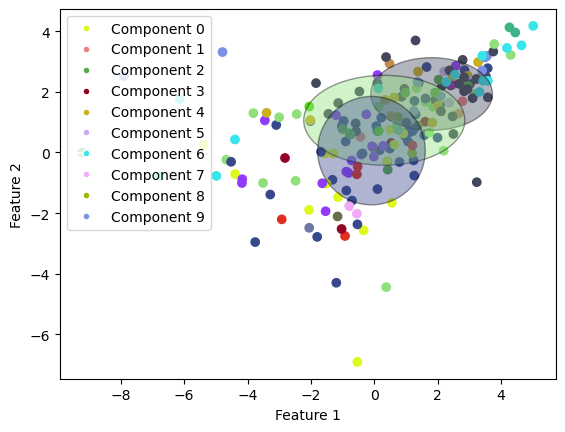

completed gibbs sampling in  8.190428733825684
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  15.818181818181818 diff:  -1.6818181818181817
avg:  15.416666666666666 diff:  -0.9166666666666661
avg:  15.153846153846153 diff:  -1.3461538461538467
avg:  15.142857142857142 diff:  -1.2571428571428562
avg:  15.266666666666667 diff:  -0.9000000000000004
avg:  15.25 diff:  -1.178571428571427
avg:  15.0 diff:  -1.875
avg:  14.777777777777779 diff:  -1.6666666666666643
avg:  14.578947368421053 diff:  -1.6210526315789462
avg:  14.2 diff:  -1.618181818181819
avg:  14.428571428571429 diff:  -0.9880952380952372
avg:  14.136363636363637 diff:  -1.0174825174825166
avg:  13.826086956521738 diff:  -1.316770186335404
avg:  13.708333333333334 diff:  -1.5583333333333336
avg:  13.76 diff:  -1.4900000000000002
avg:  13.538461538461538 diff:  -1.461

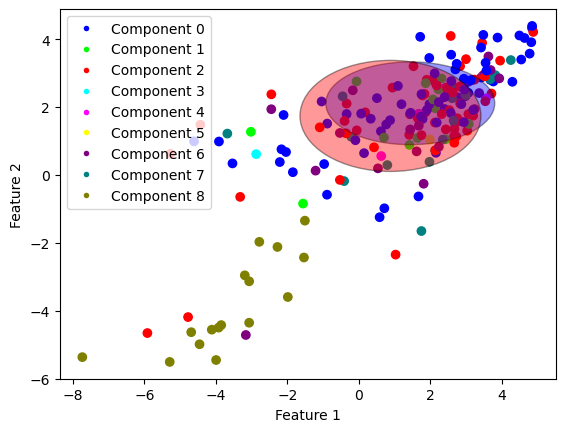

completed gibbs sampling in  7.36348819732666
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  14.545454545454545 diff:  0.04545454545454497
avg:  13.916666666666666 diff:  -2.083333333333334
avg:  13.846153846153847 diff:  -1.9038461538461533
avg:  13.642857142857142 diff:  -2.557142857142857
avg:  13.533333333333333 diff:  -2.466666666666667
avg:  13.4375 diff:  -2.4196428571428577
avg:  13.411764705882353 diff:  -1.7132352941176467
avg:  13.444444444444445 diff:  -1.2222222222222214
avg:  13.157894736842104 diff:  -1.242105263157896
avg:  12.95 diff:  -1.5954545454545457
avg:  12.761904761904763 diff:  -1.1547619047619033
avg:  12.590909090909092 diff:  -1.255244755244755
avg:  12.478260869565217 diff:  -1.1645962732919255
avg:  12.5 diff:  -1.0333333333333332
avg:  12.4 diff:  -1.0374999999999996
avg:  12.346153846153847 d

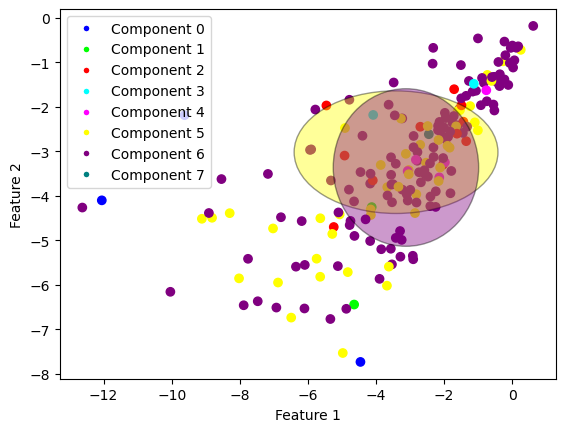

completed gibbs sampling in  7.270260334014893
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  14.090909090909092 diff:  -3.4090909090909083
avg:  13.833333333333334 diff:  -5.166666666666666
avg:  13.76923076923077 diff:  -2.73076923076923
avg:  13.571428571428571 diff:  -3.628571428571428
avg:  13.266666666666667 diff:  -4.066666666666665
avg:  13.125 diff:  -3.446428571428573
avg:  13.0 diff:  -3.125
avg:  12.944444444444445 diff:  -2.833333333333334
avg:  12.631578947368421 diff:  -2.3684210526315788
avg:  12.3 diff:  -1.790909090909091
avg:  12.095238095238095 diff:  -1.738095238095239
avg:  12.045454545454545 diff:  -1.723776223776225
avg:  12.043478260869565 diff:  -1.5279503105590067
avg:  12.0 diff:  -1.2666666666666675
avg:  11.88 diff:  -1.2449999999999992
avg:  11.884615384615385 diff:  -1.115384615384615
avg:  11

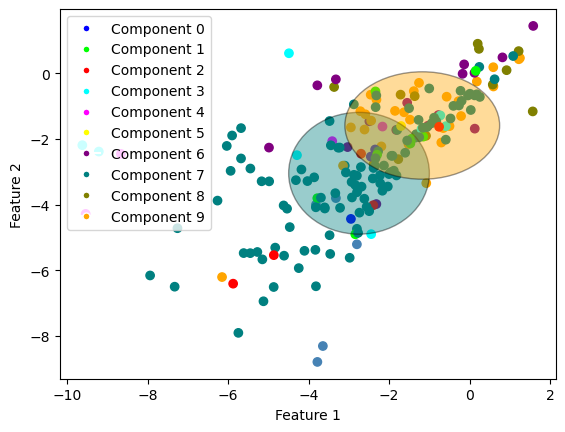

completed gibbs sampling in  7.248353719711304
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  16.636363636363637 diff:  -4.363636363636363
avg:  15.833333333333334 diff:  -3.833333333333334
avg:  15.538461538461538 diff:  -4.211538461538462
avg:  14.928571428571429 diff:  -3.4714285714285698
avg:  14.533333333333333 diff:  -2.799999999999999
avg:  14.0 diff:  -3.1428571428571423
avg:  13.823529411764707 diff:  -3.5514705882352935
avg:  13.61111111111111 diff:  -3.6111111111111107
avg:  13.210526315789474 diff:  -3.5894736842105264
avg:  13.15 diff:  -3.4863636363636363
avg:  13.047619047619047 diff:  -2.7857142857142865
avg:  12.636363636363637 diff:  -2.9020979020979016
avg:  12.478260869565217 diff:  -2.450310559006212
avg:  12.208333333333334 diff:  -2.3249999999999993
avg:  12.2 diff:  -1.8000000000000007
avg:  11.961538

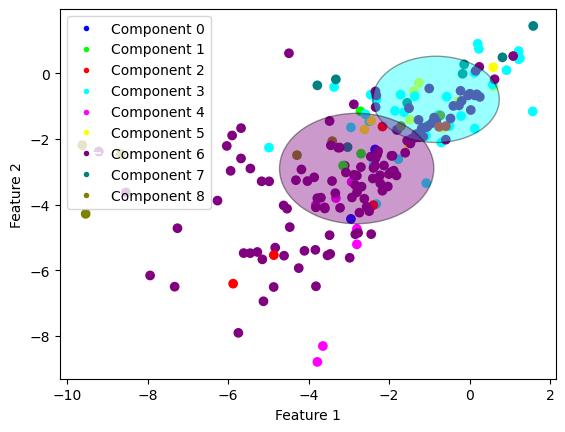

completed gibbs sampling in  7.104111194610596
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  13.727272727272727 diff:  -7.772727272727273
avg:  13.75 diff:  -3.916666666666668
avg:  13.461538461538462 diff:  -4.288461538461538
avg:  13.0 diff:  -2.8000000000000007
avg:  12.533333333333333 diff:  -1.6333333333333329
avg:  12.6875 diff:  -1.1696428571428577
avg:  12.411764705882353 diff:  -1.7132352941176467
avg:  12.444444444444445 diff:  -1.4444444444444446
avg:  12.368421052631579 diff:  -1.5315789473684216
avg:  12.3 diff:  -1.427272727272726
avg:  12.0 diff:  -1.75
avg:  12.0 diff:  -1.4615384615384617
avg:  11.956521739130435 diff:  -1.0434782608695645
avg:  11.708333333333334 diff:  -0.8249999999999993
avg:  11.68 diff:  -1.0075000000000003
avg:  11.73076923076923 diff:  -0.6809954751131233
avg:  11.777777777777779 dif

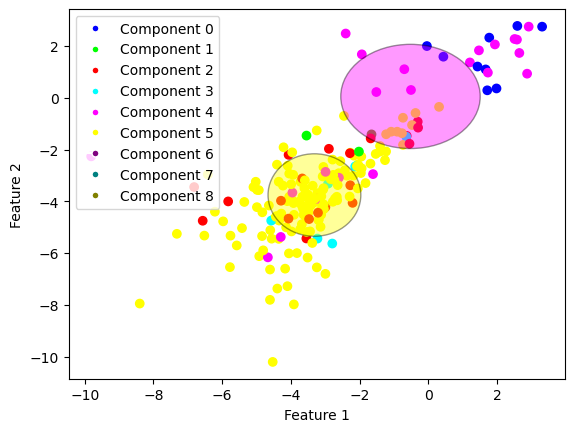

completed gibbs sampling in  7.213057041168213
_______________________________
whale:  4  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  12.727272727272727 diff:  1.2272727272727266
avg:  13.0 diff:  2.0
avg:  13.076923076923077 diff:  2.0769230769230766
avg:  13.142857142857142 diff:  0.742857142857142
avg:  13.133333333333333 diff:  -0.5333333333333332
avg:  13.125 diff:  -0.16071428571428648
avg:  13.294117647058824 diff:  0.04411764705882426
avg:  13.222222222222221 diff:  0.33333333333333215
avg:  13.0 diff:  0.6999999999999993
avg:  12.65 diff:  -0.07727272727272627
avg:  12.619047619047619 diff:  -0.3809523809523814
avg:  12.5 diff:  -0.5769230769230766
avg:  12.347826086956522 diff:  -0.7950310559006208
avg:  12.166666666666666 diff:  -0.9666666666666668
avg:  12.2 diff:  -0.9250000000000007
avg:  12.153846153846153 diff:  -1.140271493212671
avg:  12.07407407

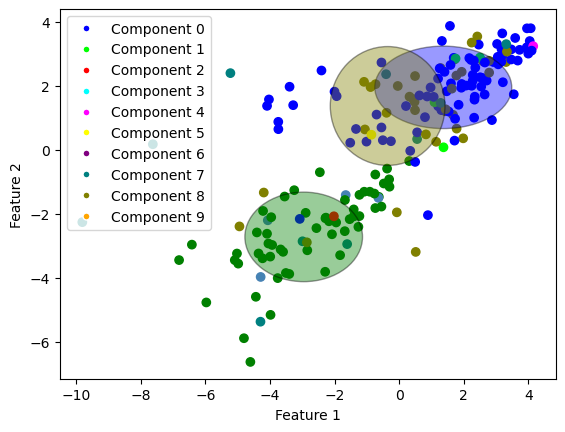

completed gibbs sampling in  7.222843885421753
completed, final component avg:  10.1
testing for whale type:  5
testing for model_type:  wl_hdphmm
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.181818181818182 diff:  -0.8181818181818183
avg:  8.75 diff:  -2.583333333333334
avg:  8.307692307692308 diff:  -2.4423076923076916
avg:  7.857142857142857 diff:  -3.742857142857143
avg:  7.6 diff:  -3.7333333333333343
avg:  7.1875 diff:  -3.8125
avg:  6.9411764705882355 diff:  -4.1838235294117645
avg:  6.611111111111111 diff:  -3.833333333333334
avg:  6.578947368421052 diff:  -3.2210526315789485
avg:  6.4 diff:  -2.7818181818181813
avg:  6.238095238095238 diff:  -2.511904761904762
avg:  6.045454545454546 diff:  -2.2622377622377625
avg:  5.913043478260869 diff:  -1.9440993788819876
avg:  5.875 diff:  -1.7249999999999996
avg:  5.72 di

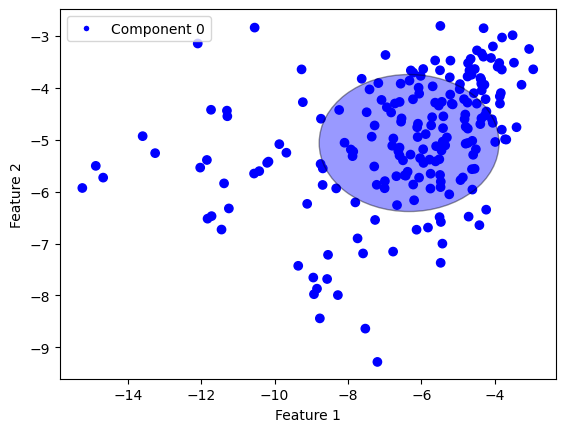

completed gibbs sampling in  3.7660341262817383
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  8.181818181818182 diff:  -5.818181818181818
avg:  8.0 diff:  -4.333333333333334
avg:  7.769230769230769 diff:  -3.230769230769231
avg:  8.0 diff:  -1.8000000000000007
avg:  7.733333333333333 diff:  -1.1000000000000005
avg:  7.3125 diff:  -1.4017857142857135
avg:  7.0588235294117645 diff:  -1.4411764705882355
avg:  7.055555555555555 diff:  -1.166666666666666
avg:  6.894736842105263 diff:  -1.5052631578947375
avg:  6.6 diff:  -1.581818181818182
avg:  6.380952380952381 diff:  -1.6190476190476186
avg:  6.181818181818182 diff:  -1.5874125874125875
avg:  6.0 diff:  -2.0
avg:  5.916666666666667 diff:  -1.8166666666666664
avg:  5.76 diff:  -1.5525000000000002
avg:  5.576923076923077 diff:  -1.4819004524886878
avg:  5.592592592592593 diff: 

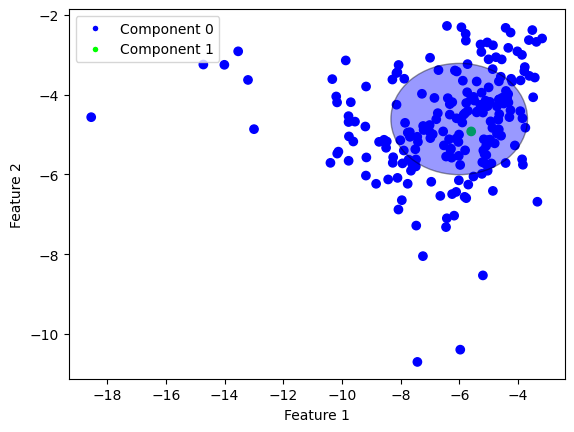

completed gibbs sampling in  3.774204969406128
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.454545454545455 diff:  -1.545454545454545
avg:  8.916666666666666 diff:  -1.4166666666666679
avg:  8.692307692307692 diff:  -2.3076923076923084
avg:  8.357142857142858 diff:  -2.0428571428571427
avg:  8.066666666666666 diff:  -1.7666666666666675
avg:  7.875 diff:  -1.8392857142857135
avg:  7.647058823529412 diff:  -2.227941176470588
avg:  7.611111111111111 diff:  -2.166666666666668
avg:  7.421052631578948 diff:  -2.4789473684210526
avg:  7.15 diff:  -2.3045454545454547
avg:  6.904761904761905 diff:  -2.011904761904761
avg:  6.681818181818182 diff:  -2.01048951048951
avg:  6.521739130434782 diff:  -1.8354037267080754
avg:  6.375 diff:  -1.6916666666666664
avg:  6.24 diff:  -1.6349999999999998
avg:  6.115384615384615 diff:  -1.53167

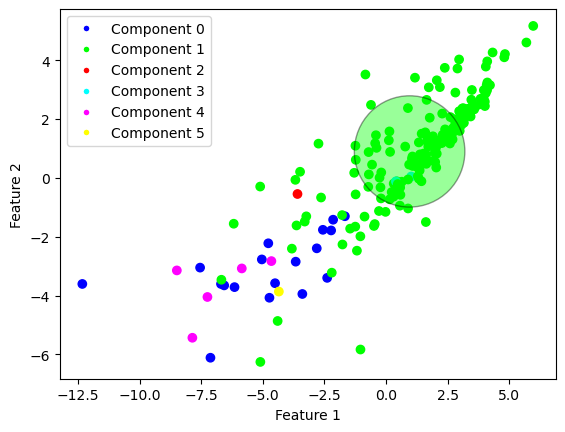

completed gibbs sampling in  3.9944908618927
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  7.7272727272727275 diff:  -6.2727272727272725
avg:  7.25 diff:  -3.75
avg:  6.769230769230769 diff:  -3.980769230769231
avg:  6.642857142857143 diff:  -3.1571428571428575
avg:  6.733333333333333 diff:  -2.4333333333333327
avg:  6.625 diff:  -2.0892857142857135
avg:  6.529411764705882 diff:  -2.3455882352941178
avg:  6.333333333333333 diff:  -2.2222222222222223
avg:  6.105263157894737 diff:  -1.7947368421052632
avg:  6.0 diff:  -1.7272727272727275
avg:  6.0 diff:  -1.25
avg:  6.136363636363637 diff:  -0.6328671328671325
avg:  6.130434782608695 diff:  -0.5124223602484479
avg:  6.041666666666667 diff:  -0.6916666666666664
avg:  5.92 diff:  -0.7050000000000001
avg:  5.769230769230769 diff:  -0.7601809954751131
avg:  5.703703703703703 diff

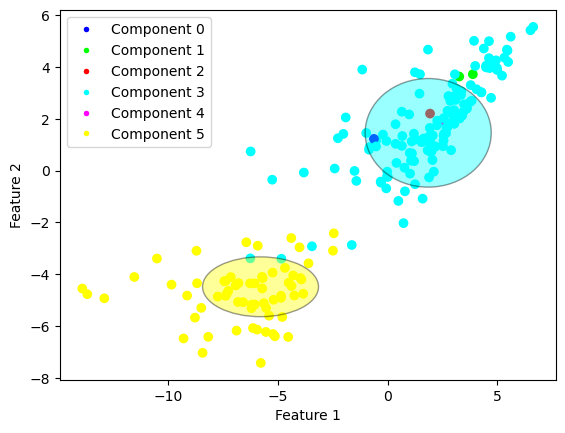

completed gibbs sampling in  3.6925599575042725
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  20  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  8.272727272727273 diff:  -6.227272727272727
avg:  8.166666666666666 diff:  -4.833333333333334
avg:  7.923076923076923 diff:  -4.826923076923077
avg:  7.5 diff:  -4.300000000000001
avg:  7.266666666666667 diff:  -4.066666666666667
avg:  7.0625 diff:  -3.0803571428571423
avg:  6.882352941176471 diff:  -2.367647058823529
avg:  6.555555555555555 diff:  -2.333333333333334
avg:  6.368421052631579 diff:  -2.231578947368421
avg:  6.15 diff:  -2.122727272727273
avg:  5.9523809523809526 diff:  -2.2142857142857135
avg:  5.7272727272727275 diff:  -2.195804195804196
avg:  5.739130434782608 diff:  -1.7608695652173916
avg:  5.625 diff:  -1.6416666666666666
avg:  5.64 diff:  -1.4225000000000003
avg:  5.538461538461538 diff:  -1.3438914027149327
av

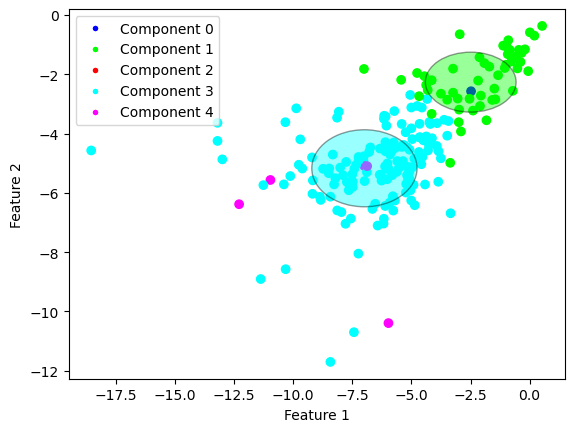

completed gibbs sampling in  3.759779214859009
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.363636363636363 diff:  -1.1363636363636367
avg:  9.166666666666666 diff:  -1.833333333333334
avg:  8.923076923076923 diff:  -2.8269230769230766
avg:  8.642857142857142 diff:  -3.757142857142858
avg:  8.6 diff:  -3.4000000000000004
avg:  8.5625 diff:  -2.866071428571429
avg:  8.176470588235293 diff:  -2.6985294117647065
avg:  8.166666666666666 diff:  -2.0555555555555554
avg:  8.052631578947368 diff:  -1.8473684210526322
avg:  7.85 diff:  -1.5136363636363637
avg:  7.714285714285714 diff:  -1.4523809523809517
avg:  7.5 diff:  -1.4230769230769234
avg:  7.478260869565218 diff:  -1.1645962732919246
avg:  7.375 diff:  -1.2249999999999996
avg:  7.4 diff:  -1.1624999999999996
avg:  7.461538461538462 diff:  -0.7149321266968318
avg:  7.29629

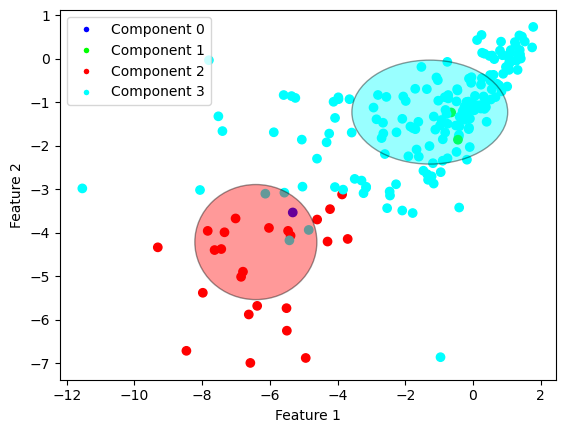

completed gibbs sampling in  4.182704210281372
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  6.909090909090909 diff:  -3.590909090909091
avg:  6.916666666666667 diff:  -3.749999999999999
avg:  7.153846153846154 diff:  -2.846153846153846
avg:  7.142857142857143 diff:  -2.057142857142856
avg:  6.866666666666666 diff:  -1.2999999999999998
avg:  6.875 diff:  -0.8392857142857144
avg:  6.647058823529412 diff:  -0.7279411764705879
avg:  6.555555555555555 diff:  -0.8888888888888893
avg:  6.578947368421052 diff:  -0.7210526315789476
avg:  6.55 diff:  -0.35909090909090935
avg:  6.666666666666667 diff:  -0.25
avg:  6.5 diff:  -0.6538461538461542
avg:  6.565217391304348 diff:  -0.5776397515527956
avg:  6.625 diff:  -0.24166666666666625
avg:  6.56 diff:  -0.3150000000000004
avg:  6.615384615384615 diff:  -0.031674208144797156
avg:  6.74

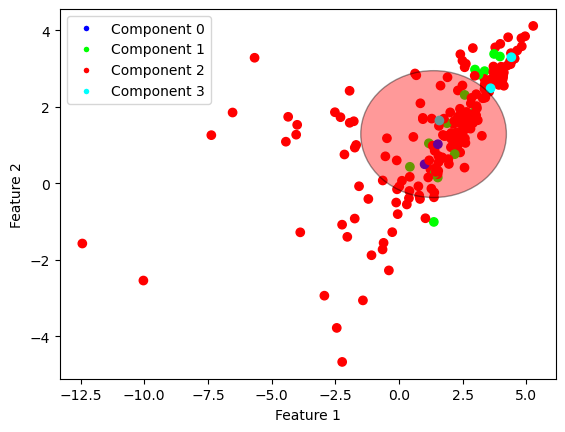

completed gibbs sampling in  4.409795045852661
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  8.727272727272727 diff:  -5.772727272727273
avg:  8.5 diff:  -5.166666666666666
avg:  8.846153846153847 diff:  -3.9038461538461533
avg:  8.428571428571429 diff:  -2.571428571428571
avg:  8.2 diff:  -1.1333333333333346
avg:  7.9375 diff:  -1.0625
avg:  7.647058823529412 diff:  -1.4779411764705879
avg:  7.5 diff:  -1.166666666666666
avg:  7.315789473684211 diff:  -1.48421052631579
avg:  7.05 diff:  -1.6772727272727268
avg:  6.857142857142857 diff:  -1.6428571428571432
avg:  6.7272727272727275 diff:  -2.118881118881119
avg:  6.869565217391305 diff:  -1.5590062111801242
avg:  6.75 diff:  -1.4499999999999993
avg:  6.68 diff:  -1.2575000000000003
avg:  6.576923076923077 diff:  -1.0701357466063355
avg:  6.62962962962963 diff:  -0.870370370

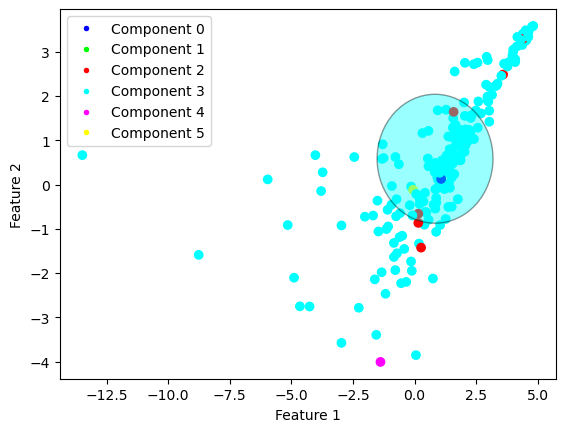

completed gibbs sampling in  4.604310989379883
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  8.181818181818182 diff:  -4.318181818181818
avg:  8.25 diff:  -4.083333333333334
avg:  8.153846153846153 diff:  -4.596153846153847
avg:  7.928571428571429 diff:  -3.4714285714285715
avg:  7.866666666666666 diff:  -2.6333333333333337
avg:  7.6875 diff:  -1.8839285714285712
avg:  7.470588235294118 diff:  -1.6544117647058822
avg:  7.333333333333333 diff:  -1.5555555555555562
avg:  7.2105263157894735 diff:  -1.3894736842105262
avg:  7.0 diff:  -1.1818181818181817
avg:  6.857142857142857 diff:  -1.3928571428571432
avg:  6.7272727272727275 diff:  -1.4265734265734258
avg:  6.521739130434782 diff:  -1.4068322981366466
avg:  6.416666666666667 diff:  -1.4499999999999993
avg:  6.28 diff:  -1.4074999999999998
avg:  6.269230769230769 diff:  -1.2

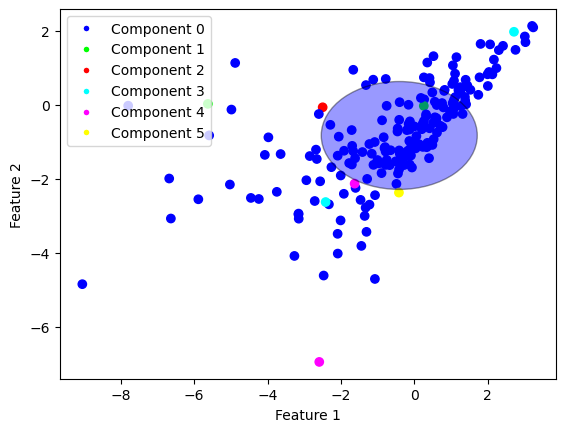

completed gibbs sampling in  4.570551156997681
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  20  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  8.0 diff:  -4.0
avg:  7.916666666666667 diff:  -3.749999999999999
avg:  8.0 diff:  -2.5
avg:  7.928571428571429 diff:  -2.071428571428571
avg:  7.8 diff:  -1.7000000000000002
avg:  7.8125 diff:  -2.0446428571428577
avg:  7.764705882352941 diff:  -1.6102941176470589
avg:  7.611111111111111 diff:  -1.3888888888888893
avg:  7.578947368421052 diff:  -0.8210526315789481
avg:  7.35 diff:  -0.6500000000000004
avg:  7.380952380952381 diff:  -0.5357142857142856
avg:  7.318181818181818 diff:  -0.6818181818181817
avg:  7.304347826086956 diff:  -0.6242236024844727
avg:  7.333333333333333 diff:  -0.4666666666666668
avg:  7.32 diff:  -0.4924999999999997
avg:  7.269230769230769 diff:  -0.49547511312217196
avg:  7.222222222222222 diff:  -0.38888888

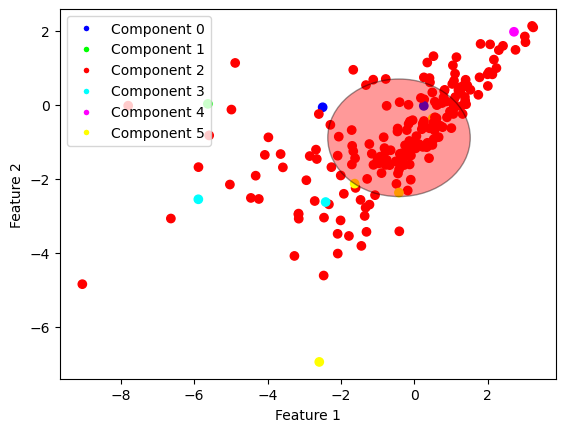

completed gibbs sampling in  4.339705944061279
completed, final component avg:  4.7
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  8.454545454545455 diff:  -8.545454545454545
avg:  7.916666666666667 diff:  -6.083333333333333
avg:  7.538461538461538 diff:  -5.211538461538462
avg:  7.642857142857143 diff:  -4.757142857142857
avg:  7.666666666666667 diff:  -3.833333333333333
avg:  7.375 diff:  -3.9107142857142865
avg:  7.235294117647059 diff:  -3.639705882352941
avg:  6.944444444444445 diff:  -3.166666666666666
avg:  6.7368421052631575 diff:  -2.4631578947368418
avg:  6.55 diff:  -1.9045454545454552
avg:  6.714285714285714 diff:  -1.2023809523809526
avg:  6.545454545454546 diff:  -0.9930069930069925
avg:  6.304347826086956 diff:  -1.3385093167701871
avg:  6.166666666666667 diff:  -1.5
avg:  6.0 diff:  -1.375
avg:  5.96153846153

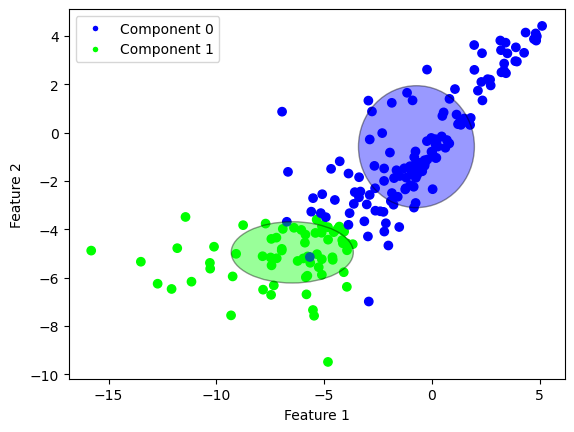

completed gibbs sampling in  4.410918712615967
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.545454545454545 diff:  -3.454545454545455
avg:  10.5 diff:  -3.5
avg:  10.23076923076923 diff:  -4.76923076923077
avg:  9.857142857142858 diff:  -4.342857142857142
avg:  9.533333333333333 diff:  -4.466666666666667
avg:  9.25 diff:  -4.0357142857142865
avg:  9.0 diff:  -3.625
avg:  8.777777777777779 diff:  -2.777777777777777
avg:  8.894736842105264 diff:  -2.405263157894737
avg:  8.85 diff:  -1.6954545454545453
avg:  8.80952380952381 diff:  -1.6904761904761898
avg:  8.681818181818182 diff:  -1.5489510489510483
avg:  8.869565217391305 diff:  -0.987577639751553
avg:  8.75 diff:  -0.7833333333333332
avg:  8.6 diff:  -0.6500000000000004
avg:  8.423076923076923 diff:  -0.5769230769230766
avg:  8.333333333333334 diff:  -0.44444444444444

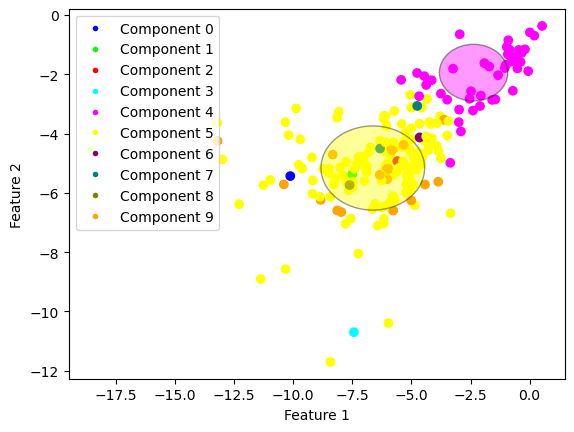

completed gibbs sampling in  5.452197790145874
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.363636363636363 diff:  -9.136363636363637
avg:  9.833333333333334 diff:  -8.166666666666666
avg:  9.461538461538462 diff:  -7.788461538461538
avg:  9.071428571428571 diff:  -6.5285714285714285
avg:  8.933333333333334 diff:  -5.2333333333333325
avg:  8.625 diff:  -4.375
avg:  8.411764705882353 diff:  -3.8382352941176467
avg:  8.277777777777779 diff:  -2.833333333333332
avg:  8.157894736842104 diff:  -2.542105263157895
avg:  7.9 diff:  -2.463636363636363
avg:  7.666666666666667 diff:  -2.166666666666667
avg:  7.545454545454546 diff:  -1.9160839160839158
avg:  7.3478260869565215 diff:  -1.7236024844720497
avg:  7.125 diff:  -1.8083333333333336
avg:  7.08 diff:  -1.545
avg:  6.846153846153846 diff:  -1.5656108597285074
avg:  6.777777

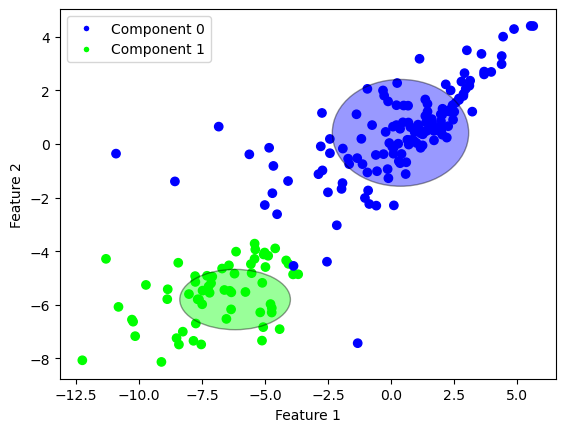

completed gibbs sampling in  4.484450101852417
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.727272727272727 diff:  -8.272727272727273
avg:  9.166666666666666 diff:  -7.500000000000002
avg:  8.615384615384615 diff:  -5.634615384615385
avg:  8.5 diff:  -5.1
avg:  8.466666666666667 diff:  -4.199999999999999
avg:  8.5625 diff:  -2.866071428571429
avg:  8.294117647058824 diff:  -2.9558823529411757
avg:  8.38888888888889 diff:  -2.0555555555555554
avg:  8.105263157894736 diff:  -1.794736842105264
avg:  7.8 diff:  -1.9272727272727268
avg:  7.619047619047619 diff:  -1.5476190476190474
avg:  7.409090909090909 diff:  -1.2062937062937058
avg:  7.260869565217392 diff:  -1.2391304347826084
avg:  7.083333333333333 diff:  -1.3833333333333337
avg:  6.88 diff:  -1.6825
avg:  6.6923076923076925 diff:  -1.6018099547511317
avg:  6.592592592

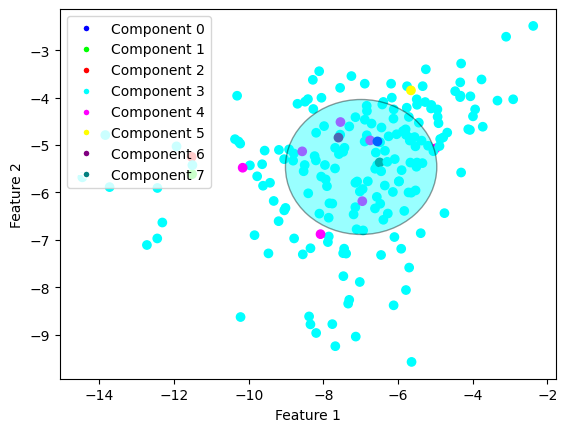

completed gibbs sampling in  4.680097818374634
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  30  cv_index:  0  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.090909090909092 diff:  -6.909090909090908
avg:  10.083333333333334 diff:  -5.25
avg:  9.461538461538462 diff:  -4.538461538461538
avg:  9.071428571428571 diff:  -4.328571428571429
avg:  8.933333333333334 diff:  -4.2333333333333325
avg:  8.5625 diff:  -3.7232142857142865
avg:  8.294117647058824 diff:  -3.2058823529411757
avg:  8.166666666666666 diff:  -2.6111111111111125
avg:  8.0 diff:  -2.0
avg:  8.1 diff:  -1.990909090909092
avg:  8.0 diff:  -2.083333333333334
avg:  8.0 diff:  -1.4615384615384617
avg:  7.739130434782608 diff:  -1.3322981366459627
avg:  7.541666666666667 diff:  -1.3916666666666666
avg:  7.4 diff:  -1.1624999999999996
avg:  7.3076923076923075 diff:  -0.9864253393665168
avg:  7.518518518518518 diff:  -0.6481481481

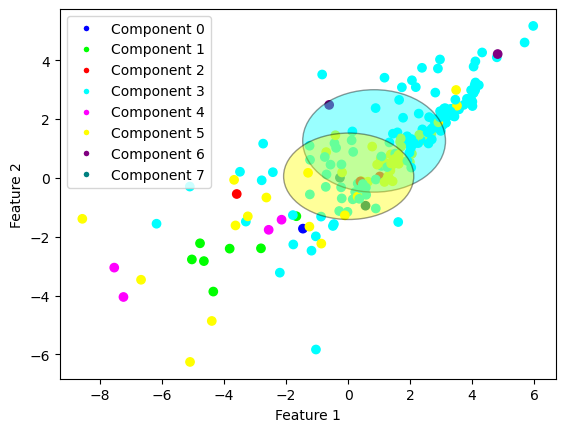

completed gibbs sampling in  5.276909112930298
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  0 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  9.636363636363637 diff:  -5.863636363636363
avg:  9.333333333333334 diff:  -5.333333333333332
avg:  9.23076923076923 diff:  -5.26923076923077
avg:  9.357142857142858 diff:  -3.6428571428571423
avg:  9.266666666666667 diff:  -3.0666666666666664
avg:  8.875 diff:  -2.553571428571429
avg:  8.823529411764707 diff:  -2.1764705882352935
avg:  8.88888888888889 diff:  -1.666666666666666
avg:  9.210526315789474 diff:  -0.989473684210525
avg:  8.9 diff:  -0.7363636363636363
avg:  8.714285714285714 diff:  -0.6190476190476204
avg:  8.454545454545455 diff:  -0.7762237762237749
avg:  8.391304347826088 diff:  -0.9658385093167698
avg:  8.333333333333334 diff:  -0.9333333333333336
avg:  8.36 diff:  -0.5150000000000006
avg:  8.23076923076923 diff:  -

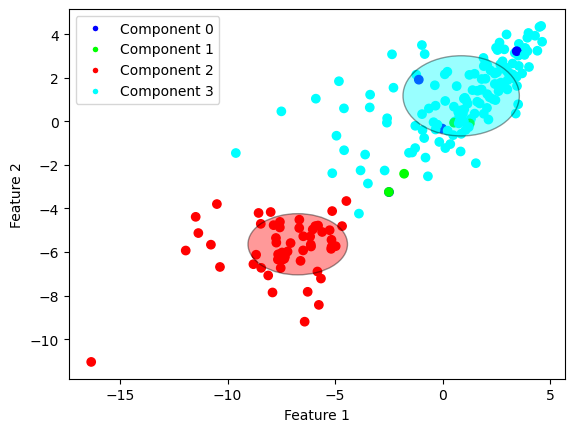

completed gibbs sampling in  5.701955080032349
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  1 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  11.545454545454545 diff:  -4.954545454545455
avg:  10.666666666666666 diff:  -6.666666666666666
avg:  10.538461538461538 diff:  -5.961538461538462
avg:  10.357142857142858 diff:  -4.242857142857142
avg:  9.8 diff:  -4.366666666666665
avg:  9.875 diff:  -2.9821428571428577
avg:  9.352941176470589 diff:  -2.8970588235294112
avg:  9.38888888888889 diff:  -2.3888888888888893
avg:  9.0 diff:  -2.5999999999999996
avg:  8.85 diff:  -2.6954545454545453
avg:  8.761904761904763 diff:  -1.9047619047619033
avg:  8.681818181818182 diff:  -1.8566433566433567
avg:  8.565217391304348 diff:  -1.79192546583851
avg:  8.666666666666666 diff:  -1.1333333333333346
avg:  8.56 diff:  -1.3149999999999995
avg:  8.423076923076923 diff:  -0.9298642533936654
av

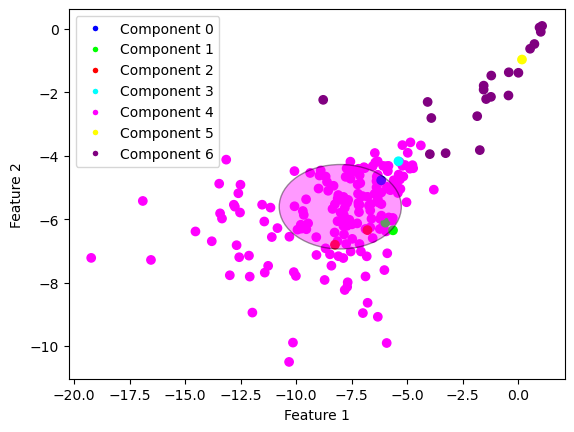

completed gibbs sampling in  6.104022026062012
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  2 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.272727272727273 diff:  -7.727272727272727
avg:  9.75 diff:  -6.916666666666668
avg:  9.461538461538462 diff:  -5.788461538461538
avg:  9.857142857142858 diff:  -4.142857142857142
avg:  9.533333333333333 diff:  -4.966666666666667
avg:  9.875 diff:  -3.4107142857142865
avg:  10.0 diff:  -2.375
avg:  9.833333333333334 diff:  -1.6111111111111107
avg:  9.631578947368421 diff:  -1.2684210526315791
avg:  9.35 diff:  -0.9227272727272737
avg:  9.047619047619047 diff:  -0.7023809523809526
avg:  8.863636363636363 diff:  -0.5979020979020984
avg:  8.869565217391305 diff:  -0.987577639751553
avg:  8.875 diff:  -0.6583333333333332
avg:  8.68 diff:  -1.1950000000000003
avg:  8.5 diff:  -1.5
avg:  8.666666666666666 diff:  -1.1666666666666679
avg:

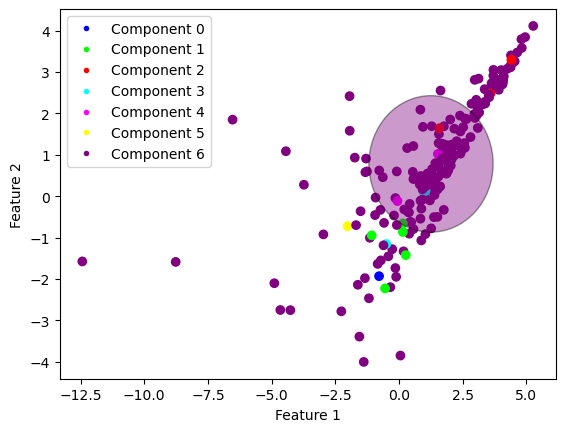

completed gibbs sampling in  6.153084993362427
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  3 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.636363636363637 diff:  -3.8636363636363633
avg:  10.333333333333334 diff:  -6.333333333333334
avg:  9.923076923076923 diff:  -5.826923076923077
avg:  9.714285714285714 diff:  -5.2857142857142865
avg:  9.333333333333334 diff:  -4.5
avg:  9.1875 diff:  -3.6696428571428577
avg:  8.823529411764707 diff:  -3.3014705882352935
avg:  8.666666666666666 diff:  -2.8888888888888893
avg:  8.578947368421053 diff:  -2.621052631578946
avg:  8.55 diff:  -2.086363636363636
avg:  8.571428571428571 diff:  -1.7619047619047628
avg:  8.454545454545455 diff:  -1.4685314685314683
avg:  8.434782608695652 diff:  -1.2795031055900612
avg:  8.333333333333334 diff:  -1.0
avg:  8.2 diff:  -0.9875000000000007
avg:  8.115384615384615 diff:  -0.7081447963800915
av

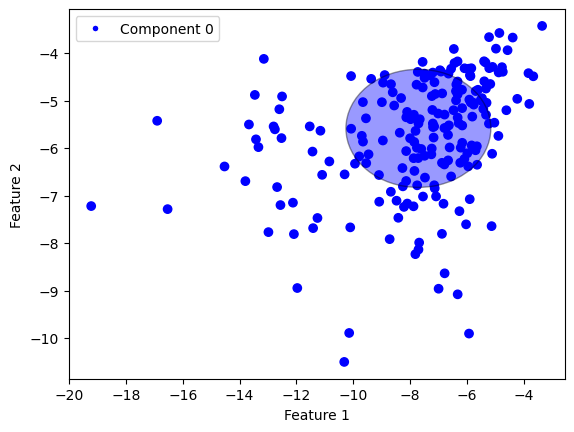

completed gibbs sampling in  5.387672185897827
_______________________________
whale:  5  mode:  wl_hdphmm  num comps:  30  cv_index:  1  n_inits:  4 / [0 1 2 3 4]
_______________________________
single sequence given
sbp given
starting gibbs sampling
avg:  10.727272727272727 diff:  -7.272727272727273
avg:  10.166666666666666 diff:  -5.833333333333334
avg:  9.846153846153847 diff:  -4.903846153846153
avg:  10.0 diff:  -4.199999999999999
avg:  9.6 diff:  -4.233333333333334
avg:  9.1875 diff:  -3.6696428571428577
avg:  8.823529411764707 diff:  -3.5514705882352935
avg:  8.61111111111111 diff:  -3.3888888888888893
avg:  8.263157894736842 diff:  -2.7368421052631575
avg:  8.0 diff:  -2.7272727272727266
avg:  7.809523809523809 diff:  -2.3571428571428568
avg:  7.590909090909091 diff:  -2.255244755244756
avg:  7.6521739130434785 diff:  -2.3478260869565215
avg:  7.5 diff:  -2.0999999999999996
avg:  7.36 diff:  -1.8274999999999997
avg:  7.230769230769231 diff:  -1.5927601809954757
avg:  7.1111111

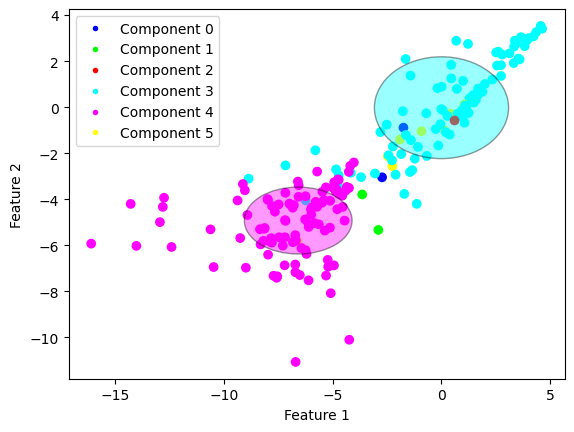

completed gibbs sampling in  5.263095140457153
completed, final component avg:  5.3


In [5]:
import pickle
output = open('new_results.pkl', "wb")
pickle.dump(results, output)
output.close()

# 'hmmlearn', 'em_bnpy', 'vi_fin_bnpy',
# data_temp = hmm_data['train_data'][0][0]
# print('loc: ', loc)

In [24]:
results = pickle.load(open(r'/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/log_power/gibbs_fin_results.pkl', 'rb'))

HPB
val ll:  15150.368544960473


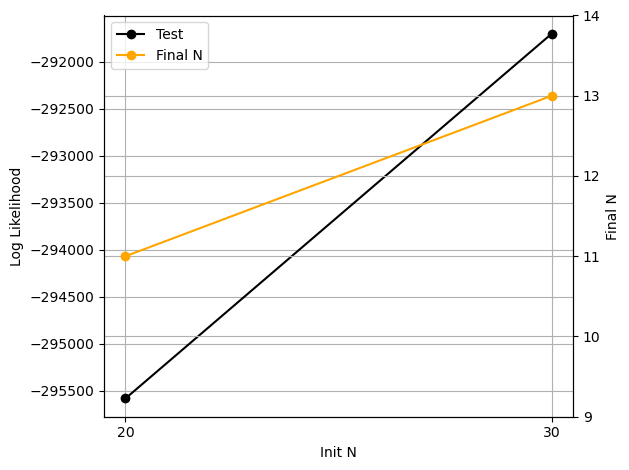

SRW
val ll:  32475.061341476154


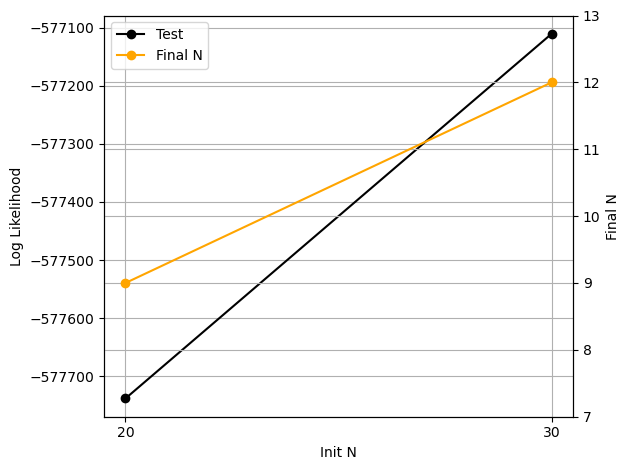

BRD
val ll:  13954.076208791254


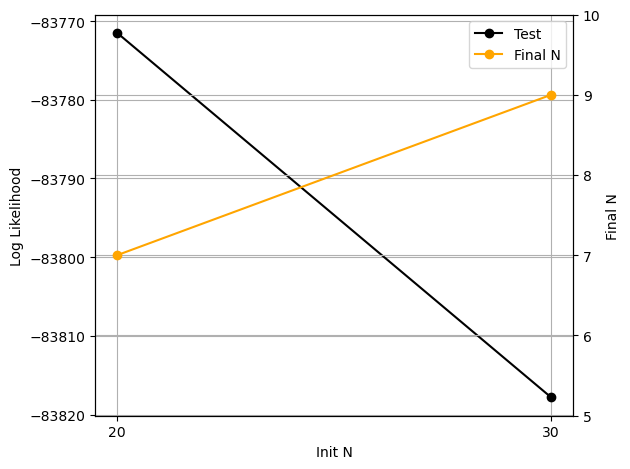

BWH
val ll:  152134.80971386778


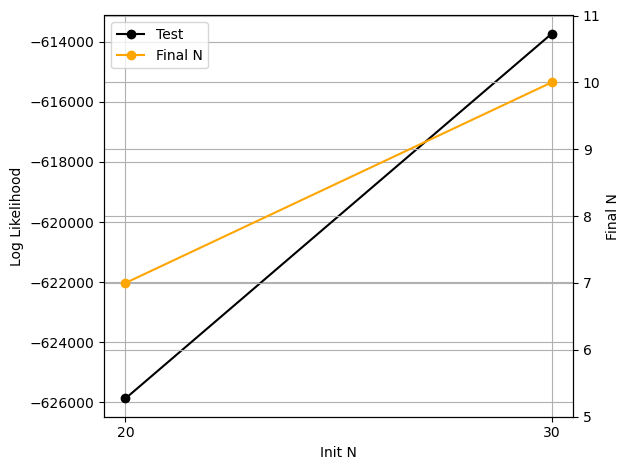

SPM
val ll:  165358.64271651208


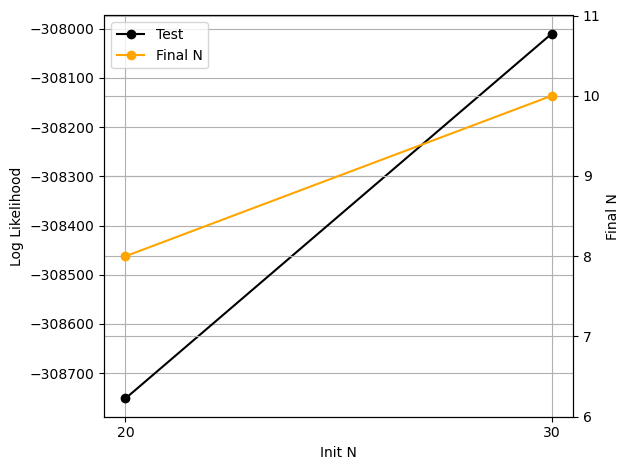

NOISE
val ll:  26129.077486316586


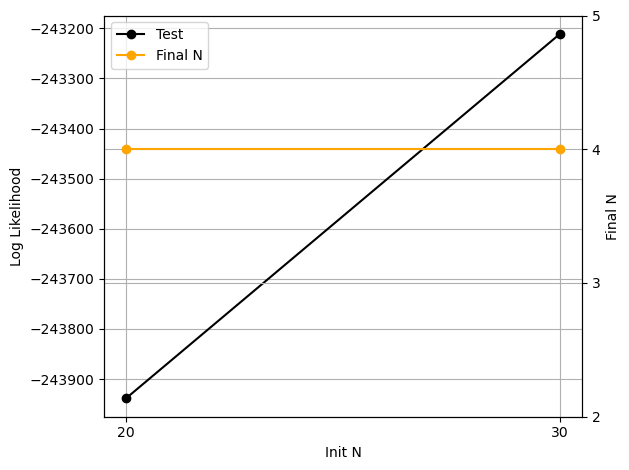

In [10]:
import matplotlib.pyplot as plt

# // select // min elbo
# // For EM //
def normalise_before_plot(some_arr):
    y1 = np.array(np.copy(some_arr))
    return (y1 - np.min(y1)) / (np.max(y1) - np.min(y1))

best_model_per_whale = {}

# colors = ['blue', 'orange']
# colors_b = ['darkblue', 'darkorange']

best_models = {
    'HPB': 20,
    'SRW': 20,
    'BRD': 20,
    'BWH': 20,
    'SPM': 20,
    'NOISE': 20
}

ns_components = None
for results_key in results:
    ns_components = [key for key in results[results_key][model_types[0]]['components']]
    pass

for whale_key in results:

    whale_results = results[whale_key]

    print(num_map[whale_key])

    model_results = whale_results[model_types[0]]

    components_results = model_results['components']

    # fig, ax = plt.subplots()
    # fig.tight_layout()
    # ax2 = ax.twinx()

    avg_val_ll = [components_results[some_key]['avg_val'] for some_key in components_results]
    std_val_ll = np.std([components_results[some_key]['lls'] for some_key in components_results])
    test_ll = [components_results[some_key]['test'] for some_key in components_results]
    final_components = [components_results[some_key]['final_components'] for some_key in components_results]

    # best_model_key = best_models[num_map[whale_key]]
    # best_model = components_results[best_model_key]['best_model']
    # best_model_per_whale[num_map[whale_key]] = best_model # should be max model
    max_val_component = components_results[ns_components[np.argmax(test_ll)]]
    max_val_model = max_val_component['models'][np.argmax(max_val_component['lls'])]
    best_model_per_whale[num_map[whale_key]] = max_val_model

    fig, ax = plt.subplots()

    # ax.plot(ns_components, normalise_before_plot(avg_val_ll), color='blue', label='Val', marker='o')
    ax.plot(ns_components, avg_val_ll, color='black', label='Test', marker='o')

    print('val ll: ', std_val_ll) # , 'test ll: ', np.std(test_ll))

    ax2 = ax.twinx()
    ax2.plot(ns_components, final_components, color='orange', label='Final N', marker='o')
    ax2.set_yticks(
        np.arange(np.round(np.min(final_components))-2,
                  np.round(np.max(final_components)) + 2,1))
    ax.set_xticks(ns_components)

    ax.legend(handles=ax.lines + ax2.lines) # + ax3.lines)
    # ax.set_title("HMM Gibbs Finite Validate/Test")
    ax.set_ylabel("Log Likelihood")
    ax.grid(True)  # Enable grid on primary axis
    ax2.grid(True)  # Enable grid on secondary axis
    ax2.set_ylabel("Final N")
    ax.set_xlabel("Init N")
    all_axes = fig.get_axes()
    for axis in all_axes:
        legend = axis.get_legend()
        if legend is not None:
            legend.remove()
            all_axes[-1].add_artist(legend)
    fig.tight_layout()
    plt.show()


In [11]:
# output = open('/Users/david/Documents/mastersCode/ubm/final/models/hdphmm/bhmm/testing/log_power/wl_inf_results.pkl', "wb")
# pickle.dump(results, output)
# output.close()
#
output = open(r'/Users/david/Documents/mastersCode/ubm/final/tests/get_features/all_whale_results/log_power/gibbs_inf_models.pkl', "wb")
pickle.dump(best_model_per_whale, output)
output.close()

In [25]:
import pickle
# output = open('new_results', "wb")
# pickle.dump(results, output)
# output.close()

output = open('new_models_02.pkl', "wb")
pickle.dump(best_model_per_whale, output)
output.close()